In [1]:
import os
import sys
sys.path.append('/home/kevinteng/Desktop/DE_Project')
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import tensorflow as tf
from coord_conv import CoordConv
import cv2
import utils
import utils_vis
import utils_model
from sklearn.model_selection import train_test_split
from utils_vis import plot_comparison
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from random import randint, seed
from utils import stack4plot, similarity_multi, similarity_multiplication
from utils_vis import overlapMasks, overlapMasks02

/home/kevinteng/anaconda3/lib/python3.6/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:541: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/kevinteng/anaconda3/lib/python3.6/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:542: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/kevinteng/anaconda3/lib/python3.6/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:543: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/kevinteng/anaconda3/lib/python3.6/site-package

---------------------

# Retrieving and Preprocess Data

Image size:  100


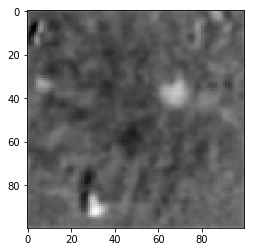

In [2]:
dataset = np.load('/home/kevinteng/Desktop/jpg_to_npy_benchmark/DG13_3-8-17_preprocessed_dF.npy')

#hyperparameter 
NEW_SIZE = 100
ver = 'fullSess04' #version no.
BATCH_SIZE = 8
lr01 = 0.00001 #learning rate for global 
lr02 = 0.000001 #learning rate for encoder 
lr03 = 0.1 #learning rate for learnable coords
n_neurons = 100
MAX_EPOCHS = 1000
l1_coeff = 0.1
thr = 0.3 #threshold for one hot pixel* sim score
dr = 0.4 #dropout rate
pre_pad_type = "SYMMETRIC"
path_desktop = '/home/kevinteng/Desktop/'
#re_list = dataset
re_list = utils.resize(dataset, NEW_SIZE)
IMG_SIZE = re_list.shape[1]

print('Image size: ', IMG_SIZE)
#Dimension for network should include the color channel 
re_list = np.expand_dims(re_list, axis = -1)
#Cast data type to float32 for TensorFlow
# re_list = re_list.astype('float32')
re_list = tf.convert_to_tensor(re_list, dtype = tf.float32)

for img in re_list:
    plt.imshow(np.reshape(img, (IMG_SIZE, IMG_SIZE)), cmap = 'gray')
    plt.show()   
    break
    

In [3]:
#apply min max norm for mean image
re_list = utils.min_max_norm(re_list)
#max_img_ori = np.expand_dims(max_img_ori, -1)
print('Max value:', np.max(re_list))
print('Min value:', np.min(re_list))


Max value: 1.0
Min value: 0.0


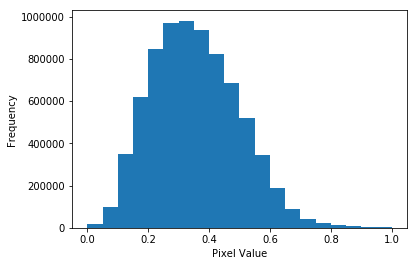

In [4]:
#plot historgram for min max norm image
plt.hist(tf.reshape(re_list, [-1]),20,[0,1])
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

-----------------------------------

# Model

In [5]:
from tensorflow.keras import Model, Sequential
from tensorflow.keras.layers import Conv2D, Dense, Flatten, Reshape, MaxPooling2D, UpSampling2D
from tensorflow.keras.layers import InputLayer, Conv2DTranspose, Activation, BatchNormalization
from tensorflow.keras.layers import Input, Softmax, Dropout
from tensorflow.keras.regularizers import l1
from utils_model import conv_block, coordconv_block, up_block, up_coord_block
from tensorflow.keras import layers    
    
def encoder(inps, img_size):
    #activity_regularizer=l1(0.1)
    #conv block1
    paddings = tf.constant([[0, 0], [1, 1], [1, 1], [0, 0]])
    coord=tf.pad(inps, paddings, "SYMMETRIC")
    coord1 =CoordConv(x_dim = 102, y_dim = 102, with_r = False, 
                       filters = 128,strides=(1,1), kernel_size = 3, padding='valid')(coord)
    
    paddings1 = tf.constant([[0, 0], [1, 1], [1, 1], [0, 0]])    
    coord1=tf.pad(coord1, paddings1, "SYMMETRIC")
    conv1=Conv2D(32, kernel_size = 3,strides=(2,2), padding='valid',activation = 'relu',activity_regularizer=l1(0.1))(coord1)
    conv2=Conv2D(32, kernel_size = 3,strides=(2,2), padding='valid',activation = 'relu',activity_regularizer=l1(0.1))(coord1)
    pool1=tf.keras.layers.Concatenate()([conv1, conv2])
    drop01 = Dropout(0.4)(pool1)
    paddingsp = tf.constant([[0, 0], [1, 1], [1, 1], [0, 0]])    
    coordp=tf.pad(drop01, paddingsp, "SYMMETRIC")

    #conv block2
    conv3=Conv2D(32, kernel_size = 3,strides=(2,2), padding='valid',activation = 'relu',activity_regularizer=l1(0.1))(coordp)
    conv4=Conv2D(32, kernel_size = 3,strides=(2,2), padding='valid',activation = 'relu',activity_regularizer=l1(0.1))(coordp)
    pool2=tf.keras.layers.Concatenate()([conv3, conv4])
    drop02 = Dropout(0.4)(pool2)
    x=tf.keras.backend.resize_images(drop02, height_factor=2, width_factor=2, data_format="channels_last", interpolation='bilinear')
    paddings2 = tf.constant([[0, 0], [1, 1], [1, 1], [0, 0]])
    
    coord2=tf.pad(x, paddings2, "SYMMETRIC")
    coord2 = Conv2D(32, 3, padding = 'valid', activation = 'relu',activity_regularizer=l1(0.1))(coord2)
    #coord2 = Conv2D(32, 3, padding = 'valid', activation = 'relu')(coord2)
    coord2=tf.keras.backend.resize_images(x, height_factor=2, width_factor=2, data_format="channels_last", interpolation='bilinear')
    paddings3 = tf.constant([[0, 0], [1, 1], [1, 1], [0, 0]])
    coord3=tf.pad(coord2, paddings3, "SYMMETRIC")
    x3 = Conv2D(16, 3, padding = 'valid', activation = 'relu',activity_regularizer=l1(0.1))(coord3)
    paddings4 = tf.constant([[0, 0], [1, 1], [1, 1], [0, 0]])
    coord4=tf.pad(x3, paddings4, "SYMMETRIC")
    output = Conv2D(1, 3, padding = 'valid', activation = 'sigmoid',activity_regularizer=l1(0.1))(coord4)
    return output




def de_conv(input_tensor):
    coord01 = CoordConv(x_dim = 100, y_dim = 100, with_r = False, filters = 100,
              kernel_size = 1, padding='same', activation='relu')(input_tensor)
    conv01 = Conv2D(filters = 50, kernel_size = 1, strides = 1, padding = "same", activation = 'relu')(coord01)
    conv02 = Conv2D(filters = 50, kernel_size = 1, strides = 1, padding = "same", activation = 'relu')(conv01)
    conv03 = Conv2D(filters = 100, kernel_size = 1, strides = 1, padding = "same", activation = 'relu')(conv02)
    conv04 = Conv2D(filters = 100, kernel_size = 1, strides = 1, padding = "same", activation = 'relu')(conv03)
    conv05 = Conv2D(filters = 1, kernel_size = 1, strides = 1, padding = "same" )(conv04)
    f1 = Flatten()(conv05)
    output = Softmax(axis = -1)(f1)

    return output

def de_conv02(input_tensor):
    coord01 = CoordConv(x_dim = 100, y_dim = 100, with_r = False, filters = 100,
              kernel_size = 1, padding='same', activation='relu')(input_tensor)
    conv01 = Conv2D(filters = 1, kernel_size = 1, strides = 1, padding = "same" )(coord01)
    f1 = Flatten()(conv01)
    output = Softmax(axis = -1)(f1)
    return output

def latent_space(encoded_imgs, deconv_imgs, coords, batch_size, img_size):
    '''
    This function construct the dot product of the output of an encoder(batch_size, img_size, img_size, 1) 
    with the one hot images generated by decoord-conv(n_neurons, img_size, img_size, 1), which yields
    similarity score (batch_size, n_neurons). Similarity score is then concatenate to the last layer of the 
    input coordinates with the corresponding batch (batch_size, n_neurons, 3)
    
    @encoded_imgs: output images from the encoder
    @deconv_imgs: one hot images generated from the coordinate list 
    @coords: A list of coordinates generated randomly based on the number of neurons
    @batch_size: Batch size of the input image for encoder, to allocate size for writing in loop
    
    return: 
        latent space with dim (batch_size, n_neurons, 3, 1)
    '''
    similarity_score = tf.tensordot(encoded_imgs, deconv_imgs, [[1,2,3],[1,2,3]]) #(batch_size, n_neurons)
#     squeeze_coords = tf.squeeze(coords/(img_size-1)) #coords dim (n_neurons, 1, 1, 2) = > (n_neurons, 2)
    squeeze_coords = tf.squeeze(coords)
    latent = tf.TensorArray(tf.float32, size=0, dynamic_size=True)
    for i in tf.range(batch_size):
        concat = tf.stack((squeeze_coords[:,-2], squeeze_coords[:,-1], similarity_score[i]), axis=-1)    
        latent = latent.write(i, concat) #(batch_size, n_neurons, 3)
    return tf.expand_dims(latent.stack(), axis = -1), similarity_score

def duplicate_batch(inp_img, batch_size):
    '''
    This function duplicate an image with respect to its batch size
    @param inp_img: input image to be duplicated
    @param batch_size: batch size, which is the number of image to be duplicated

    return duplicated images along axis 0, (batch_size, img_size, img_size, 1)
    '''
    inp_img = tf.expand_dims(inp_img, 0)
    m2 = tf.constant([batch_size, 1, 1, 1], tf.int32)  # multiplier for tiling
    duplicate_imgs = tf.tile(inp_img, m2)
    return tf.cast(duplicate_imgs, dtype = tf.float32)

def decoder(latent_dim):
    flat_01 = Flatten()(latent_dim)
    dense_01 = Dense(25*25*32, activation = 'relu')(flat_01)
    dense_01 = Reshape((25,25,32))(dense_01)
    up_01 = up_coord_block(dense_01, up_size = 2, x_dim = 50, y_dim = 50, filters = 64, 
                           kernel_size = 3, strides = 1, padding = 'same', activation = 'relu')
    up_02 = up_block(up_01, up_size = 2, filters = 32, kernel_size = 3,
                            strides = 1, padding = 'same', activation = 'relu')
    output = Conv2D(filters = 1, kernel_size = 3, strides = 1,
                    padding = 'same', activation = None)(up_02)
    return output

class learnable_coords(layers.Layer):
    def __init__(self, coords):
        super(learnable_coords, self).__init__()
        self.learned_coords = tf.Variable((coords), trainable = True)

    def __call__(self, img_size):
        y = self.learned_coords/(img_size-1) #normalize the coordinates
        #clip values so that the values doesnt runs out of the normalized pixel space 
        y = tf.clip_by_value(y, clip_value_min=0.0, clip_value_max=1.0) 
        return y
    
def gaussian_blur(img, kernel_size=3, sigma=0.01):
    def gauss_kernel(channels, kernel_size, sigma):
        ax = tf.range(-kernel_size // 2 + 1.0, kernel_size // 2 + 1.0)
        xx, yy = tf.meshgrid(ax, ax)
        kernel = tf.exp(-(xx ** 2 + yy ** 2) / (2.0 * sigma ** 2))
        kernel = kernel / tf.reduce_sum(kernel)
        kernel = tf.tile(kernel[..., tf.newaxis], [1, 1, channels])
        return kernel

    gaussian_kernel = gauss_kernel(tf.shape(img)[-1], kernel_size, sigma)
    gaussian_kernel = gaussian_kernel[..., tf.newaxis]

    return tf.nn.depthwise_conv2d(img, gaussian_kernel, [1, 1, 1, 1],
                                  padding='SAME', data_format='NHWC')

-----------------------------------------------------------------

# Visualization

In [6]:
# coords list for every 100 epochs (max_epochs/100, n_neurons, 1, 1, 2)
coords_list_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'coords_list', ver)) 
# encoder output first batch for every 100 epochs (max_epochs/100, 8, 100, 100, 1)
encoded_imgs_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'encoded_imgs', ver))
# input image first batch for every 100 epochs (max_epochs/100, 8, 100, 100, 1)
input_imgs_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'input_imgs', ver))
# global loss for every epochs
loss_list_global_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'loss_list_global', ver))
#similarity loss for every epochs
loss_list_encoded_one_hot_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'loss_list_encoded_one_hot', ver))
# one hot images first batch for every 100 epochs  (max_epochs/100, n_neurons, 100, 100, 1)
one_hot_imgs_list_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'one_hot_imgs_list', ver))
# reconstructed images first batch for every 100 epochs (max_epochs/100, 8, 100, 100, 1)
reconstructed_imgs_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'reconstructed_imgs', ver))
# similarity batch for every 100 epochs (max_epochs/100, 8, n_neurons)
similarity_list_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'similarity_list', ver))
#original coords list (n_neurons, 1, 1, 2)
ori_coords_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'ori_coords', ver))
#original one hot image (n_neurons, 100, 100, 1)
ori_one_hot_imgs_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'ori_one_hot_imgs', ver))

In [7]:
#load roi mask
roi_img = np.load('/home/kevinteng/Desktop/Manual_annotation/DG-13-3-8-17_ROImask.npy')
roi_img = cv2.resize(roi_img, (100, 100))
# plt.imshow(roi_img, cmap = 'gray')

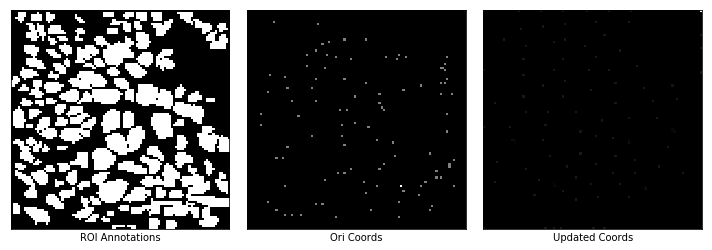

In [8]:
#comparison of roi and one hot images 
captions_03 = ['ROI Annotations', 'Ori Coords', 'Updated Coords']
img_row03 = [roi_img, stack4plot(ori_one_hot_imgs_npy), stack4plot(one_hot_imgs_list_npy[-1])]
plot_comparison(img_row03, captions_03, n_col=len(img_row03), figsize = (10, 10))

Mean value:  0.01
Counts:  94


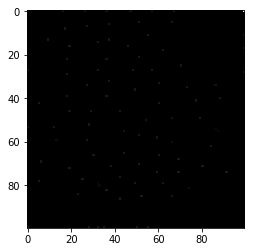

In [9]:
sum_updated_coords = stack4plot(one_hot_imgs_list_npy[-1])
print("Mean value: ", np.mean(sum_updated_coords))
updated_coords_img = np.where(sum_updated_coords<thr, 0, sum_updated_coords) 
activations_count = np.count_nonzero(updated_coords_img!=0)
print("Counts: ", activations_count)
plt.imshow(updated_coords_img, cmap = 'gray')

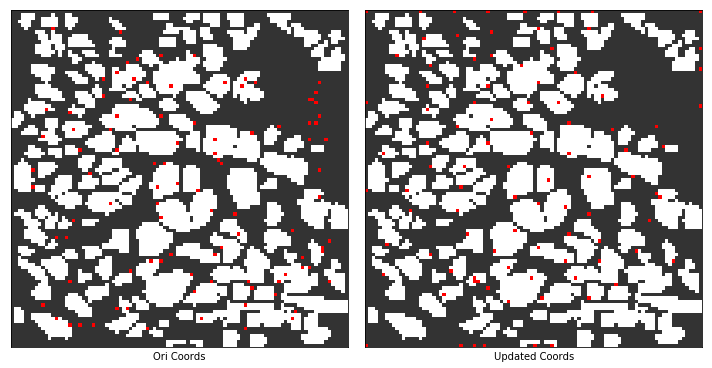

In [10]:
#define color
col = [(0.2, 0.2, 0.2),(1,1,1),(1,0,0)] 
cm = LinearSegmentedColormap.from_list('mylist', col, 3)  
#     #Bins for cmap
bounds=[0,1,5,10]
norm = BoundaryNorm(bounds, cm.N)
#overlap mask with original coordinates 
roi_ori_mask = overlapMasks02(roi_img, stack4plot(ori_one_hot_imgs_npy))

#overlap mask with updated coordinates 
roi_updated_mask = overlapMasks02(roi_img, updated_coords_img)

captions_04 = ['Ori Coords', 'Updated Coords']
img_row04 = [roi_ori_mask, roi_updated_mask]
plot_comparison(img_row04, captions_04, n_col=len(img_row04), figsize = (10, 10), cmap = cm, norm = norm)

In [11]:
#confusion matrix 
confMatrix = utils_model.getConfusionMatrix(roi_img, updated_coords_img)

print("True Positives: ", confMatrix[0])
print("True Negatives: ", confMatrix[1])
print("False Positive Ratio: ", confMatrix[2])
print("False Negatives Ratio: ", confMatrix[3])
print("F1 score: ", utils_model.f1score(confMatrix))

True Positives:  0.4574468085106383
True Negatives:  0.5425531914893617
False Positive Ratio:  0.4182313749242883
False Negatives Ratio:  0.5817686250757117
F1 score:  0.48776683820346695


---

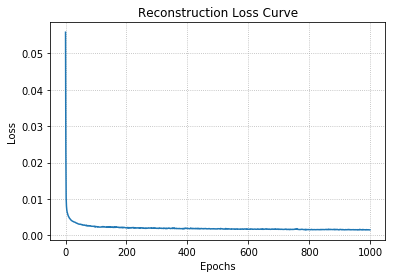

In [12]:
#plot loss
xlabel = 'Epochs'
ylabel = 'Loss'
title = 'Reconstruction Loss Curve'
utils_vis.plot_loss(loss_list_global_npy, xlabel, ylabel, title)

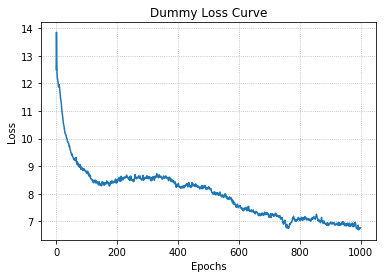

In [13]:
#plot loss
xlabel = 'Epochs'
ylabel = 'Loss'
title = 'Dummy Loss Curve'
utils_vis.plot_loss(loss_list_encoded_one_hot_npy, xlabel, ylabel, title)

---

# Visualization Per-frame

In [14]:

def multi_similarity_frame(one_hot_imgs_last_list_npy, similarity_score_last_list_npy, img_size, batch_size):
    '''
    Multiply similarity scores for every one hot pixel images and aggregate the one hot images into
    single frames
    
    @param one_hot_imgs_last_list_npy: .npy array of one hot images for the last epochs 
    @param similarity_score_last_list_npy: .npy array of similarity score for the last epochs
    @param img_size: image size
    @param batch_size: batch size
    
    return 
    tensor of one hot images multiplied with similarity scores for each images 
    '''
    count = 0
    onehot_list = []
    for one_hot in np.squeeze(one_hot_imgs_last_list_npy):
        if count!=len(similarity_score_last_list_npy): 
            for idx in range(count,count+batch_size): #loop through the similarity score for every batch_size increment
                sum_multi = np.zeros((img_size, img_size))
                for n in range(len(one_hot)): #n_neurons
                    multi = similarity_score_last_list_npy[idx, n]*one_hot[n]
                    sum_multi+=multi #sum all the one hot images
                onehot_list.append(sum_multi)
        count+=batch_size
        tensor = tf.convert_to_tensor(onehot_list, tf.float32)
    
    return tensor

---

# Validation 

In [15]:
#build encoder 
inps = Input(shape=(IMG_SIZE, IMG_SIZE, 1))
encoder_model = Model(inps, encoder(inps, IMG_SIZE))
encoder_model.load_weights("model_weights/encoder_model_{}.h5".format(ver))
#build coord model
inp = Input(shape=(100, 100,2)) #(batch_size, img_size, img_size, 2)
de_coordconv = Model(inp, de_conv(inp))
de_coordconv.load_weights("best_class_model100_02.hdf5")

#decoder
latent_dim = Input(shape=(n_neurons, 3, 1))
decoder_model = Model(latent_dim, decoder(latent_dim))
decoder_model.load_weights("model_weights/decoder_model_{}.h5".format(ver))

#learnable coords
l_coords = learnable_coords(tf.convert_to_tensor(ori_coords_npy))

In [16]:
# #concat latent space as input
# squeeze_coords = np.squeeze(coords_list_npy[-1]) #use the last pos
# similarity_score = similarity_list_npy[-1]


# concat = tf.stack((squeeze_coords[:,-2], squeeze_coords[:,-1], similarity_score[0]), axis=-1)
# concat_ex = concat[np.newaxis,:,:,np.newaxis] #extand axis=0 and axis=-1 for input into model
# # print(concat_ex.shape)

In [17]:
mse = tf.losses.MeanSquaredError()
bxent = tf.keras.losses.BinaryCrossentropy()
opt_coords = tf.keras.optimizers.Adam(0.1)
ori_one_hot_imgs = tf.convert_to_tensor(ori_one_hot_imgs_npy)

@tf.function
def val_fn(inp_imgs, img_size, batch_size, neuron_multi = False, one_hot_thr = False):
    with tf.GradientTape() as tape:
        #--RHS pipeline (Learnable Coords)--
        #custom layer for updating coordinates
        updated_coords = l_coords(img_size)
        m1 = tf.constant([1,img_size,img_size,1], tf.int32) #multiplier for tiling 
        #tile coordinates (n_neurons, img_size, img_size, 1)
        tile_cd = tf.tile(updated_coords, m1)
        #de-coordconv model
    #     de_coordconv.trainable = False #freeze de-coordconv
        #one hot images depending on the learnable coordinates
        one_hot_imgs = tf.reshape(de_coordconv(tile_cd),[-1,img_size, img_size, 1]) #(n_neurons, img_size, img_size, 1)
        #one hot images depending on the dummy coordinates 
        dummy_one_hot = ori_one_hot_imgs
        #--LHS pipeline (Encoder Pipeline)--
        #output from encoder (batch_size, img_size, img_size, 1)
    #         gaussian_blurr_input_images=gaussian_blur(inp_imgs)
        encoder_output = encoder_model(inp_imgs)

        #--Bottle Neck--
        #latent space
        latent, similarity_score = latent_space(encoder_output, one_hot_imgs, updated_coords, batch_size, img_size)#(batch_size, n_neurons, 3, 1)
        #compute the mse between the neurons with the one hot images generated by the deconv
        if neuron_multi==False:
            #sum one hot images for all neurons, (n_neurons, img_size, img_size, 1) => (img_size, img_size, 1)
            one_hot_sum = tf.math.reduce_sum(one_hot_imgs, 0)
            dummy_sum = tf.math.reduce_sum(dummy_one_hot, 0)
            #duplicate summed one_hot_images and compare with encoded output 
            #(img_size, img_size, 1) => (batch_size, img_size, img_size, 1) 
            duplicated_one_hot = duplicate_batch(one_hot_sum, batch_size)
            duplicated_dummy = duplicate_batch(dummy_sum, batch_size)
            #loss between the encoded output and the one hot images 
            encoded_one_loss = bxent(encoder_output, duplicated_one_hot)
            #loss between the encoded output and the dummy one hot images
            encoded_dummy = bxent(encoder_output, duplicated_dummy)
        #compute the mse between the neurons with one hot images multiplied by similarity scores
        elif neuron_multi==True:
            #with thresholding 
            if one_hot_thr==True:
                #multiply similarity scores with one hot images
                #(batch_size, img_size, img_size, 1)
                similarity_multi_threshold = similarity_multi(one_hot_imgs, similarity_score, thr)
                similarity_multi_threshold_dummy = similarity_multi(dummy_one_hot, similarity_score, thr)
                #loss between the encoded output and the one hot images 
                encoded_one_loss = bxent(encoder_output, similarity_multi_threshold)
                #loss between encoded outptu and the dummy one hot images
                encoded_dummy = bxent(encoder_output, similarity_multi_threshold_dummy)
            #without thresholding
            elif one_hot_thr==False: 
                similarity_multi_reduced_neurons = similarity_multi(one_hot_imgs, similarity_score)
                similarity_multi_reduced_dummy = similarity_multi(dummy_one_hot, similarity_score)
                #loss between the encoded output and the one hot images 
                encoded_one_loss = bxent(encoder_output, similarity_multi_reduced_neurons)
                #loss between encoded outptu and the dummy one hot images
                encoded_dummy = bxent(encoder_output, similarity_multi_reduced_dummy)

        #--Decoder--
        #reconstruction 
        reconstruction = decoder_model(latent)  
        #--Loss--
        #the loss that backprop through the whole pipeline 
        global_loss = mse(inp_imgs, reconstruction)
        #regularizer loss
        regularizer_loss = tf.math.reduce_sum(encoder_model.losses)
        #total global loss => global_loss + regularizer loss
        total_loss = global_loss + regularizer_loss
        #append loss 
        loss = [global_loss, encoded_dummy, regularizer_loss, total_loss]
            
    #back prop through the learnable coords
    grad_coords = tape.gradient(global_loss, l_coords.trainable_variables)
    opt_coords.apply_gradients(zip(grad_coords, l_coords.trainable_variables))

    return loss, updated_coords, one_hot_imgs, encoder_output, similarity_score, reconstruction

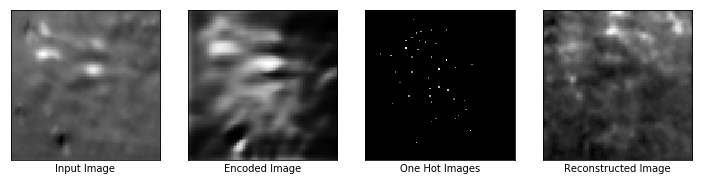

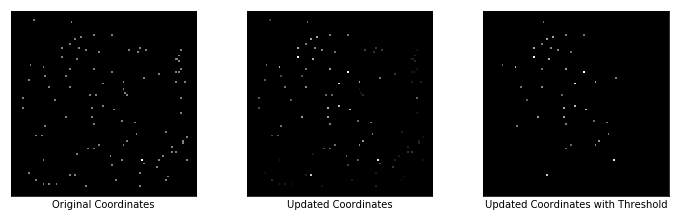

Reconstruction Loss: 0.016975868493318558
Regularizer Loss: 448449.0625, Total Loss: 448449.09375
Encoder Loss: 4.789603233337402
Max Similarity scores: 0.7896085381507874
Updated Coordinates: [[[0.53535354 0.7878788 ]]]



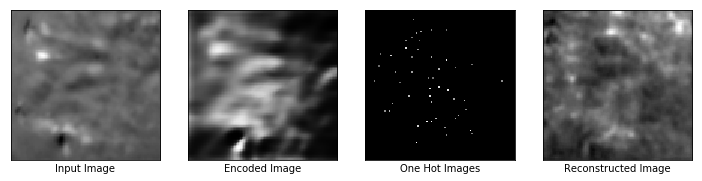

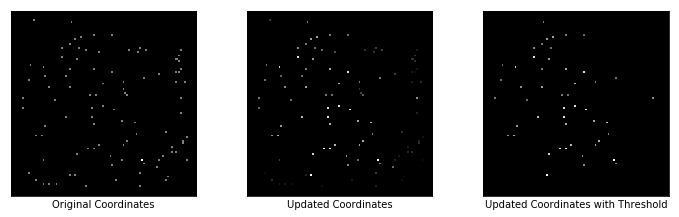

Reconstruction Loss: 0.01467947382479906
Regularizer Loss: 440098.34375, Total Loss: 440098.34375
Encoder Loss: 4.455468654632568
Max Similarity scores: 0.7138552665710449
Updated Coordinates: [[[0.53569615 0.7874056 ]]]



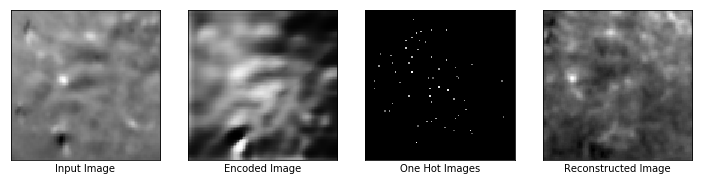

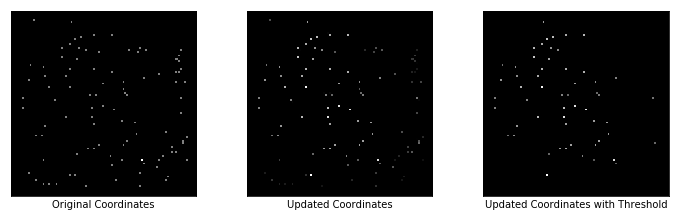

Reconstruction Loss: 0.015633761882781982
Regularizer Loss: 448461.0625, Total Loss: 448461.09375
Encoder Loss: 6.514768600463867
Max Similarity scores: 0.8622362017631531
Updated Coordinates: [[[0.53606886 0.78689736]]]



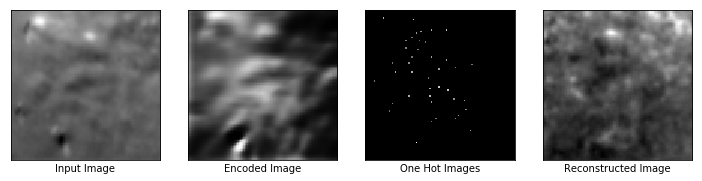

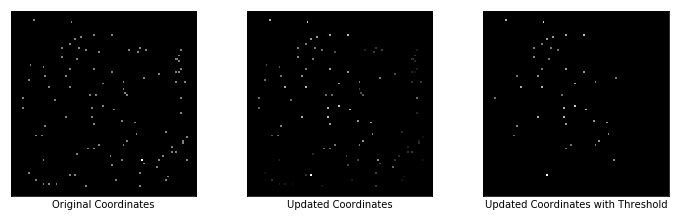

Reconstruction Loss: 0.015245607122778893
Regularizer Loss: 446378.8125, Total Loss: 446378.8125
Encoder Loss: 5.192515850067139
Max Similarity scores: 0.7289769649505615
Updated Coordinates: [[[0.5365555 0.7862722]]]



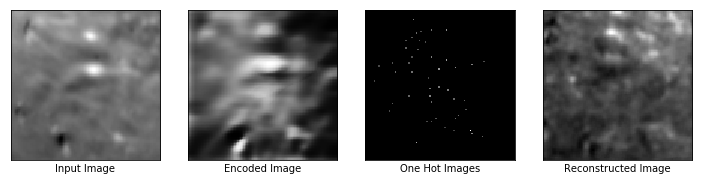

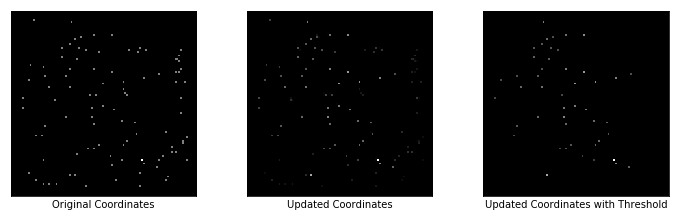

Reconstruction Loss: 0.017544806003570557
Regularizer Loss: 445265.03125, Total Loss: 445265.0625
Encoder Loss: 5.150035858154297
Max Similarity scores: 0.8213420510292053
Updated Coordinates: [[[0.5368667  0.78565943]]]



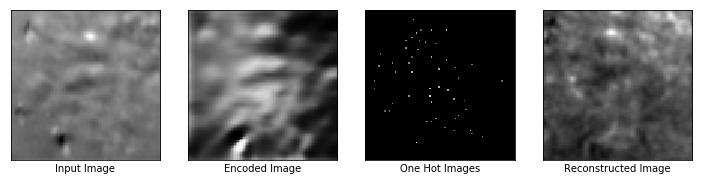

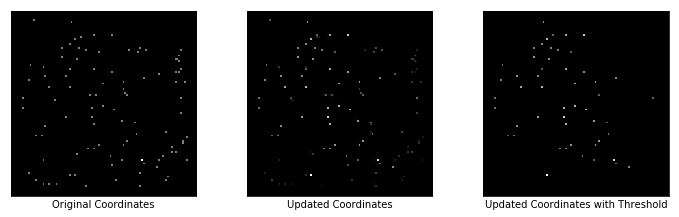

Reconstruction Loss: 0.014999881386756897
Regularizer Loss: 446285.125, Total Loss: 446285.125
Encoder Loss: 5.615760803222656
Max Similarity scores: 0.8616824746131897
Updated Coordinates: [[[0.5368179 0.7855696]]]



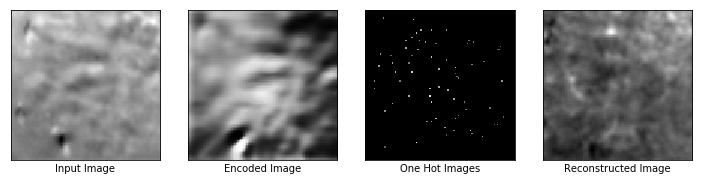

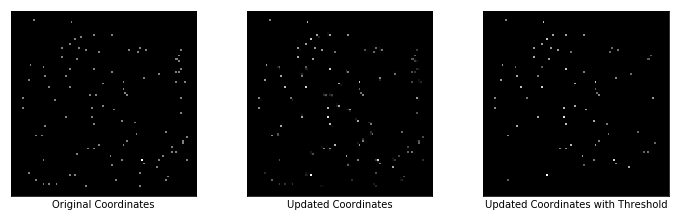

Reconstruction Loss: 0.017729399725794792
Regularizer Loss: 452146.375, Total Loss: 452146.40625
Encoder Loss: 7.055151462554932
Max Similarity scores: 0.9257045388221741
Updated Coordinates: [[[0.5365055 0.7857534]]]



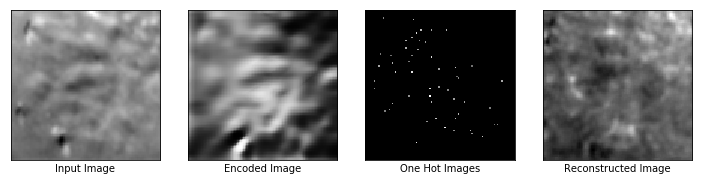

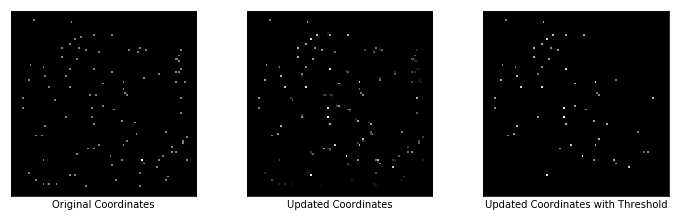

Reconstruction Loss: 0.018440021201968193
Regularizer Loss: 453750.9375, Total Loss: 453750.96875
Encoder Loss: 7.322404861450195
Max Similarity scores: 0.7823544144630432
Updated Coordinates: [[[0.5361634 0.78589  ]]]



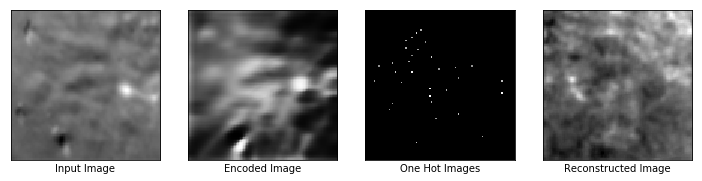

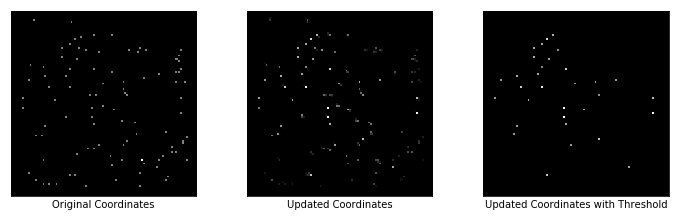

Reconstruction Loss: 0.012641862034797668
Regularizer Loss: 444863.625, Total Loss: 444863.625
Encoder Loss: 5.098841190338135
Max Similarity scores: 0.6815059781074524
Updated Coordinates: [[[0.5359536 0.7858109]]]



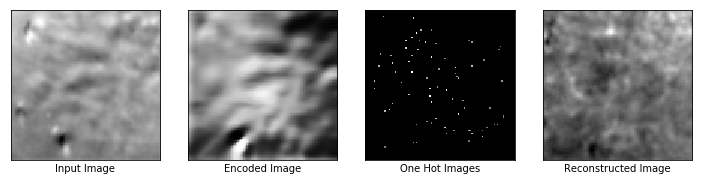

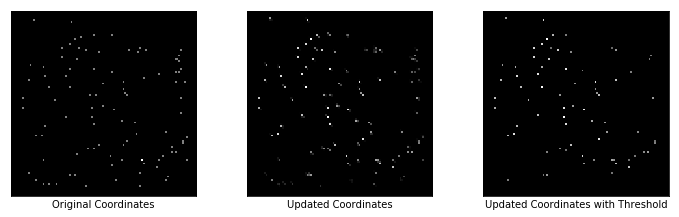

Reconstruction Loss: 0.015809154137969017
Regularizer Loss: 450725.375, Total Loss: 450725.40625
Encoder Loss: 7.128804683685303
Max Similarity scores: 0.8826380968093872
Updated Coordinates: [[[0.53601515 0.7855745 ]]]



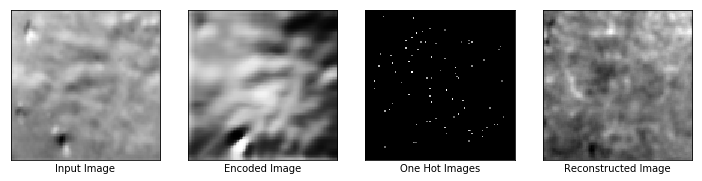

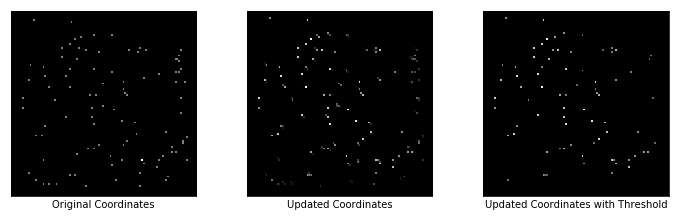

Reconstruction Loss: 0.014641372486948967
Regularizer Loss: 450545.46875, Total Loss: 450545.46875
Encoder Loss: 7.146523475646973
Max Similarity scores: 0.8866867423057556
Updated Coordinates: [[[0.5360041  0.78529525]]]



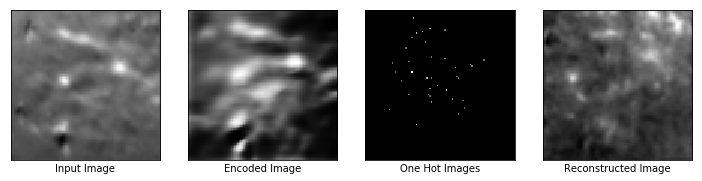

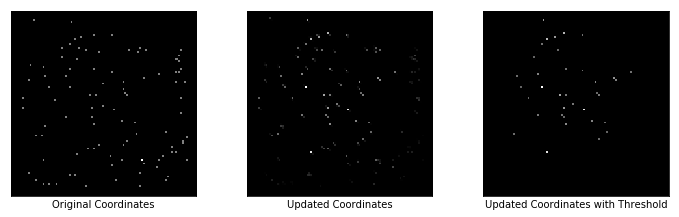

Reconstruction Loss: 0.016932079568505287
Regularizer Loss: 445924.65625, Total Loss: 445924.6875
Encoder Loss: 5.96469783782959
Max Similarity scores: 0.8322057723999023
Updated Coordinates: [[[0.5359078  0.78504205]]]



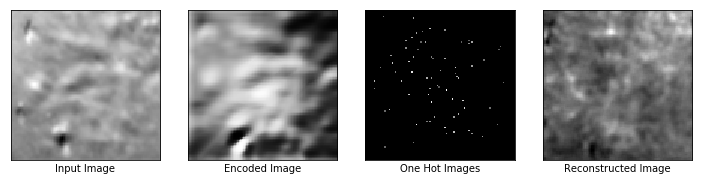

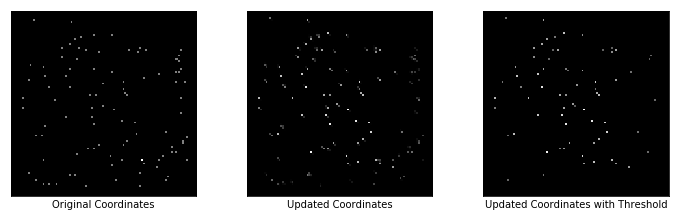

Reconstruction Loss: 0.0149310864508152
Regularizer Loss: 449226.6875, Total Loss: 449226.6875
Encoder Loss: 6.76572322845459
Max Similarity scores: 0.927127480506897
Updated Coordinates: [[[0.5357903 0.7847511]]]



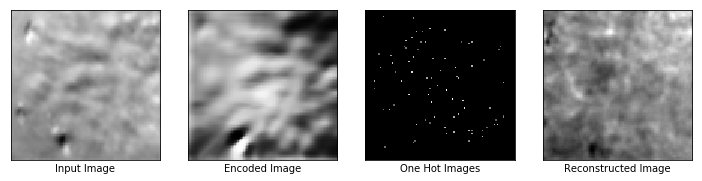

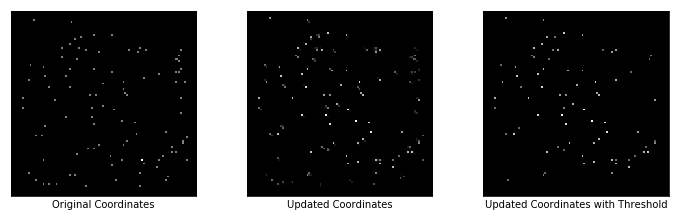

Reconstruction Loss: 0.015712585300207138
Regularizer Loss: 454020.5, Total Loss: 454020.53125
Encoder Loss: 8.06816291809082
Max Similarity scores: 0.904629647731781
Updated Coordinates: [[[0.5356643  0.78441036]]]



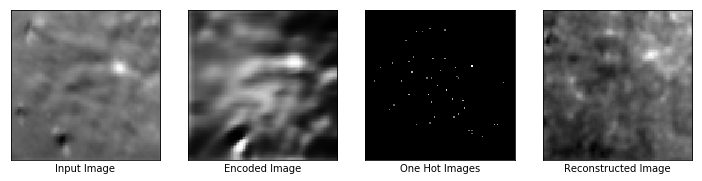

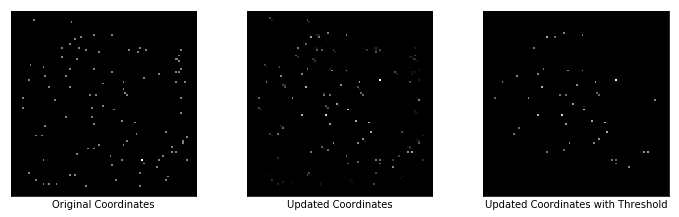

Reconstruction Loss: 0.012072978541254997
Regularizer Loss: 445028.53125, Total Loss: 445028.53125
Encoder Loss: 5.797524929046631
Max Similarity scores: 0.83359694480896
Updated Coordinates: [[[0.53552896 0.7840292 ]]]



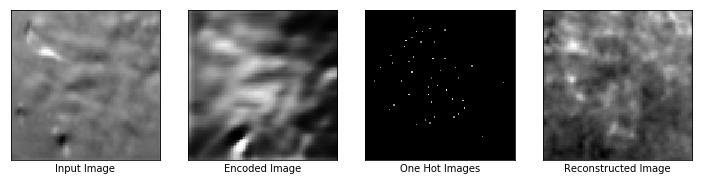

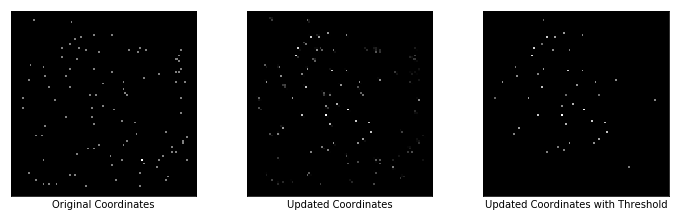

Reconstruction Loss: 0.012289664708077908
Regularizer Loss: 448423.9375, Total Loss: 448423.9375
Encoder Loss: 6.038116931915283
Max Similarity scores: 0.8332133293151855
Updated Coordinates: [[[0.53557587 0.7834847 ]]]



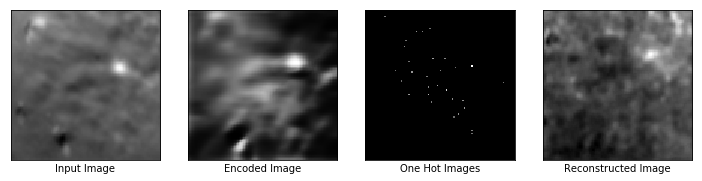

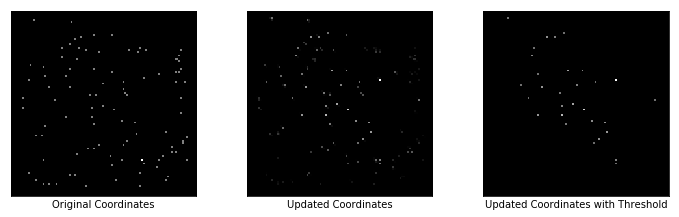

Reconstruction Loss: 0.013574174605309963
Regularizer Loss: 447871.75, Total Loss: 447871.75
Encoder Loss: 5.8562517166137695
Max Similarity scores: 0.7972927689552307
Updated Coordinates: [[[0.53515303 0.78375393]]]



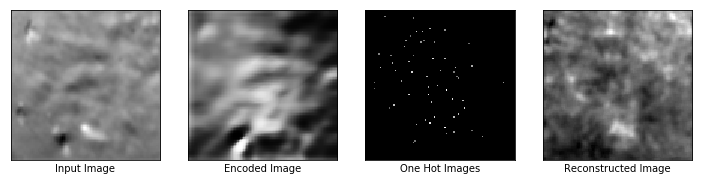

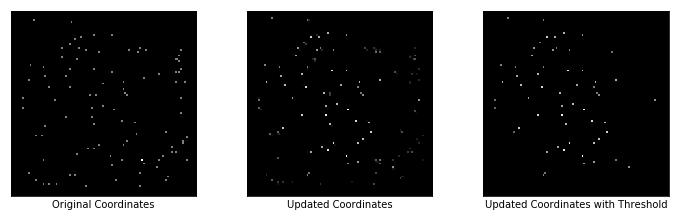

Reconstruction Loss: 0.012933074496686459
Regularizer Loss: 448922.53125, Total Loss: 448922.53125
Encoder Loss: 6.889118671417236
Max Similarity scores: 0.84926837682724
Updated Coordinates: [[[0.5346997  0.78405476]]]



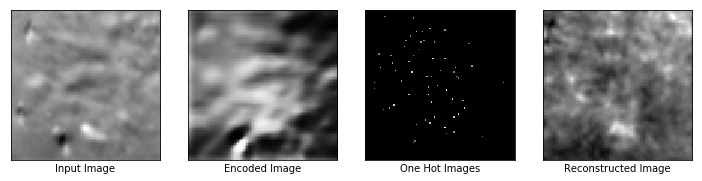

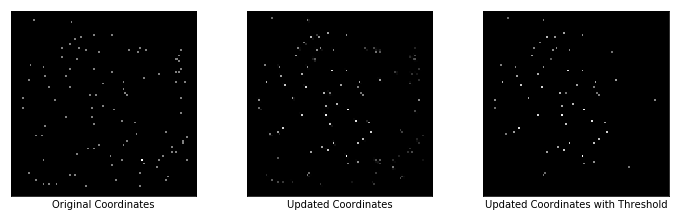

Reconstruction Loss: 0.013858444057404995
Regularizer Loss: 451762.0, Total Loss: 451762.0
Encoder Loss: 7.311331272125244
Max Similarity scores: 0.8571091294288635
Updated Coordinates: [[[0.5342724  0.78429765]]]



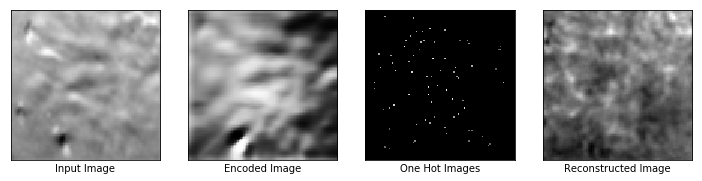

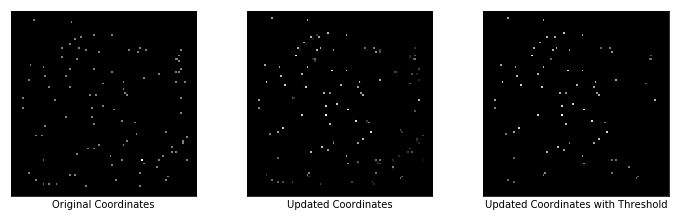

Reconstruction Loss: 0.012480217032134533
Regularizer Loss: 450025.8125, Total Loss: 450025.8125
Encoder Loss: 6.791915416717529
Max Similarity scores: 0.9446880221366882
Updated Coordinates: [[[0.53386873 0.78449416]]]



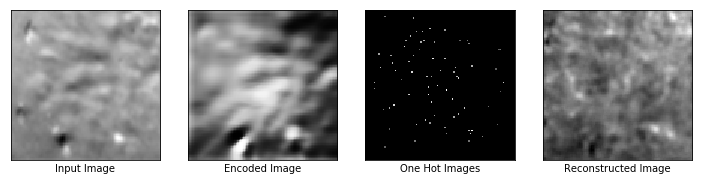

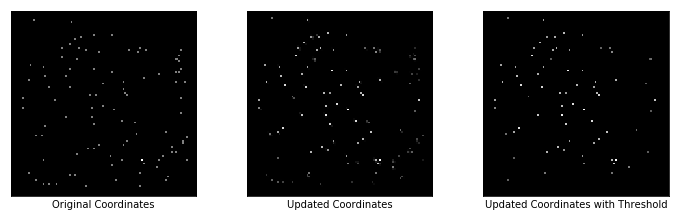

Reconstruction Loss: 0.011091184802353382
Regularizer Loss: 444187.1875, Total Loss: 444187.1875
Encoder Loss: 5.335622787475586
Max Similarity scores: 0.913893461227417
Updated Coordinates: [[[0.53350675 0.784675  ]]]



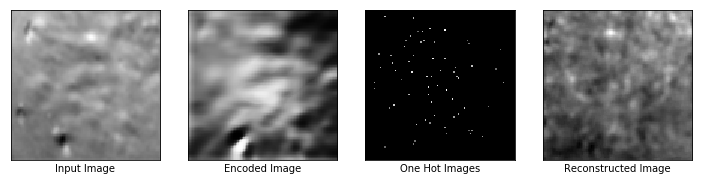

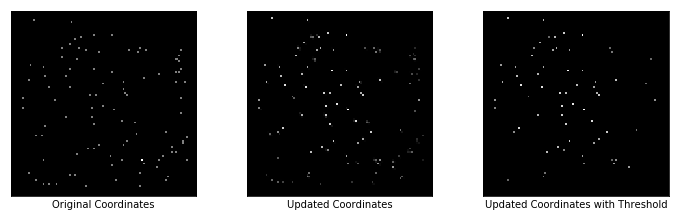

Reconstruction Loss: 0.010549782775342464
Regularizer Loss: 447052.09375, Total Loss: 447052.09375
Encoder Loss: 5.794073104858398
Max Similarity scores: 0.8764944672584534
Updated Coordinates: [[[0.53319764 0.78484267]]]



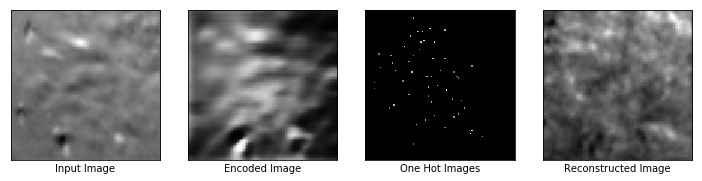

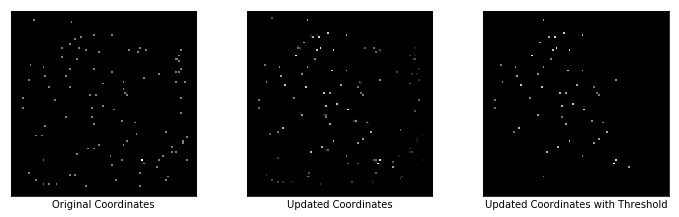

Reconstruction Loss: 0.012847637757658958
Regularizer Loss: 450697.375, Total Loss: 450697.375
Encoder Loss: 6.835560321807861
Max Similarity scores: 0.7872360348701477
Updated Coordinates: [[[0.5329201 0.7849942]]]



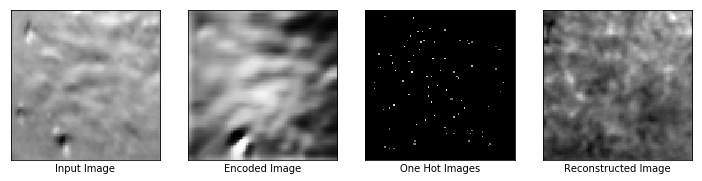

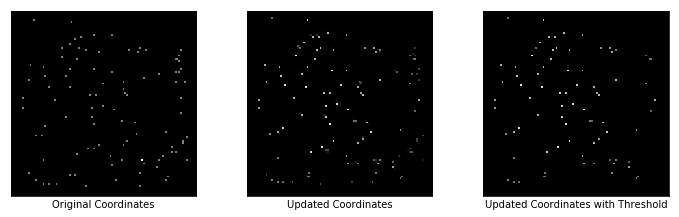

Reconstruction Loss: 0.010468687862157822
Regularizer Loss: 445596.40625, Total Loss: 445596.40625
Encoder Loss: 5.426249980926514
Max Similarity scores: 0.88933926820755
Updated Coordinates: [[[0.53276527 0.7851017 ]]]



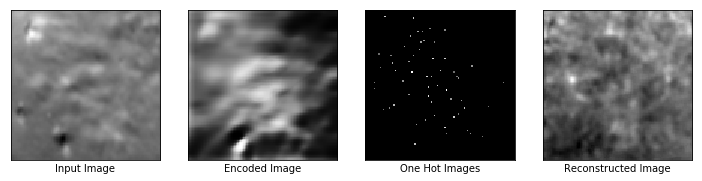

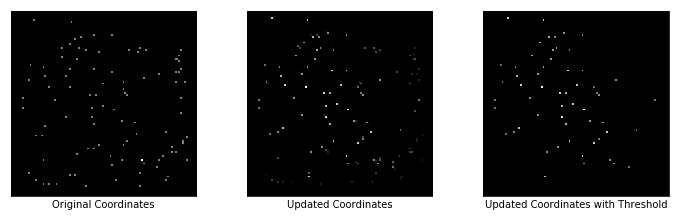

Reconstruction Loss: 0.010528684593737125
Regularizer Loss: 445352.75, Total Loss: 445352.75
Encoder Loss: 5.674767971038818
Max Similarity scores: 0.7675554752349854
Updated Coordinates: [[[0.53271884 0.7851776 ]]]



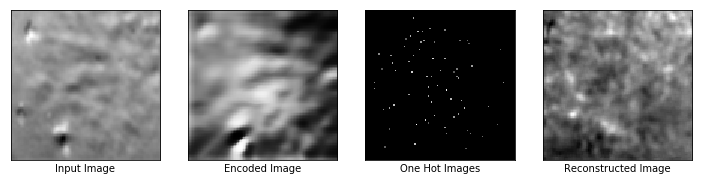

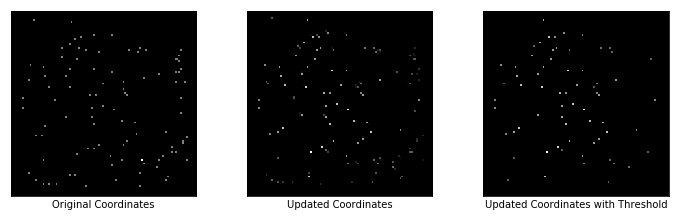

Reconstruction Loss: 0.012222137302160263
Regularizer Loss: 447535.78125, Total Loss: 447535.78125
Encoder Loss: 6.806154727935791
Max Similarity scores: 0.901508092880249
Updated Coordinates: [[[0.5329344 0.7851795]]]



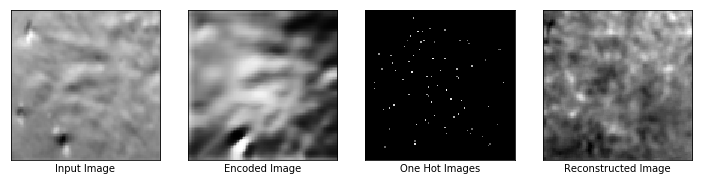

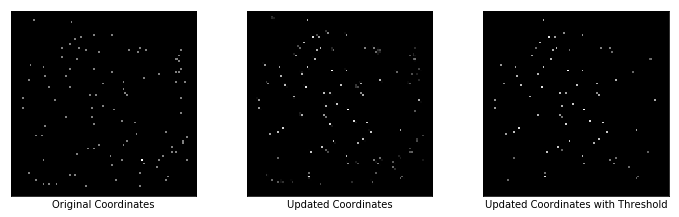

Reconstruction Loss: 0.012754513882100582
Regularizer Loss: 451092.40625, Total Loss: 451092.40625
Encoder Loss: 7.380882740020752
Max Similarity scores: 0.8991207480430603
Updated Coordinates: [[[0.5332403  0.78514314]]]



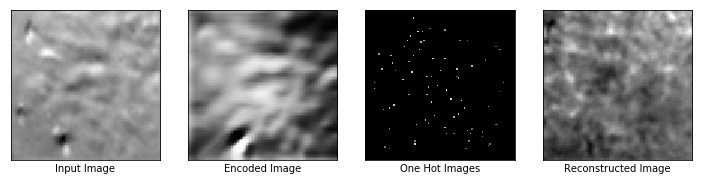

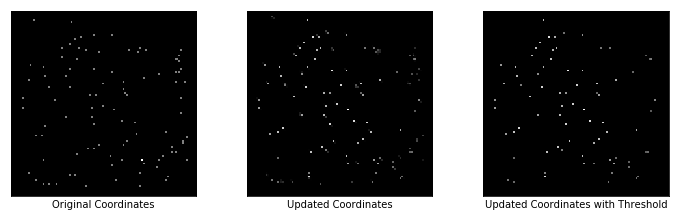

Reconstruction Loss: 0.009188691154122353
Regularizer Loss: 446887.3125, Total Loss: 446887.3125
Encoder Loss: 5.467982769012451
Max Similarity scores: 0.9278602600097656
Updated Coordinates: [[[0.533569   0.78507733]]]



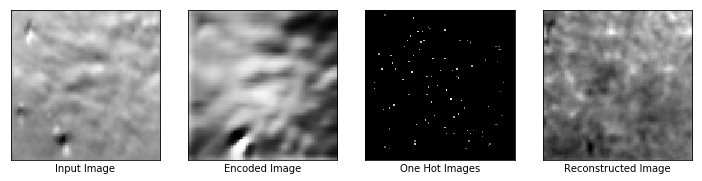

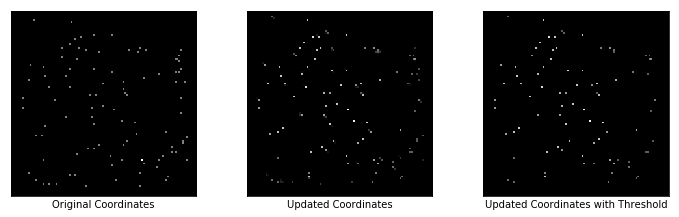

Reconstruction Loss: 0.012741927057504654
Regularizer Loss: 455052.65625, Total Loss: 455052.65625
Encoder Loss: 7.7991414070129395
Max Similarity scores: 0.9369994401931763
Updated Coordinates: [[[0.53386444 0.7850261 ]]]



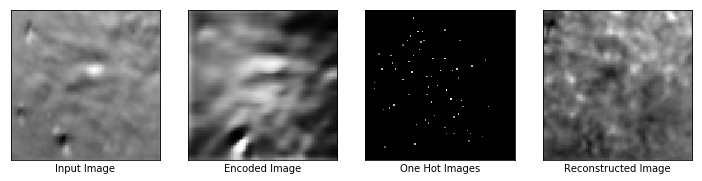

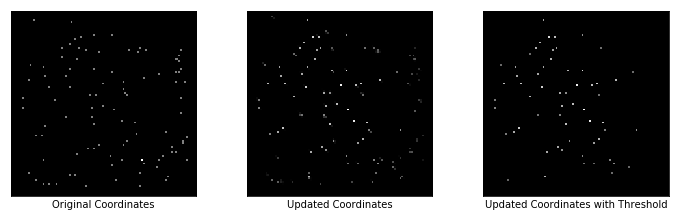

Reconstruction Loss: 0.011832591146230698
Regularizer Loss: 451901.8125, Total Loss: 451901.8125
Encoder Loss: 7.192199230194092
Max Similarity scores: 0.8618997931480408
Updated Coordinates: [[[0.53414047 0.78498137]]]



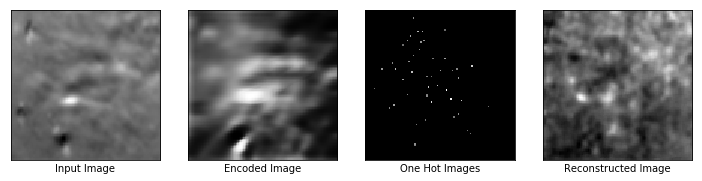

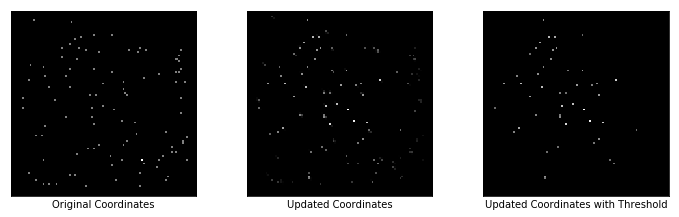

Reconstruction Loss: 0.009689818136394024
Regularizer Loss: 447727.65625, Total Loss: 447727.65625
Encoder Loss: 5.79907751083374
Max Similarity scores: 0.9600269794464111
Updated Coordinates: [[[0.53441375 0.7849493 ]]]



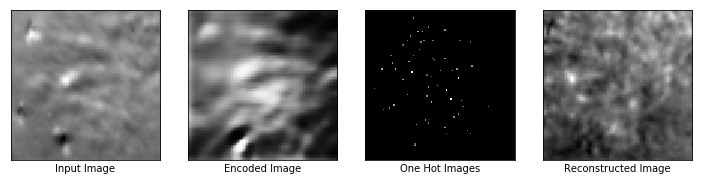

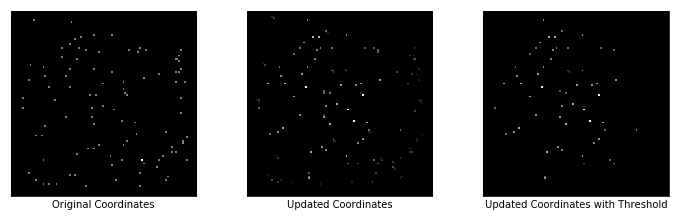

Reconstruction Loss: 0.010549420490860939
Regularizer Loss: 446373.09375, Total Loss: 446373.09375
Encoder Loss: 5.969693183898926
Max Similarity scores: 0.8996670246124268
Updated Coordinates: [[[0.5346706 0.7849248]]]



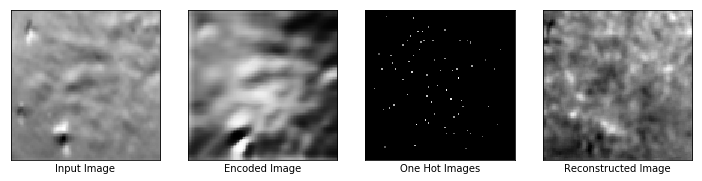

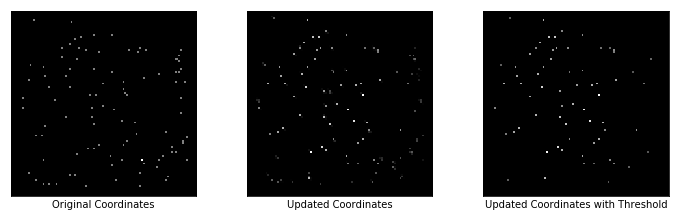

Reconstruction Loss: 0.011383164674043655
Regularizer Loss: 448210.34375, Total Loss: 448210.34375
Encoder Loss: 6.7438435554504395
Max Similarity scores: 0.9313775897026062
Updated Coordinates: [[[0.5349088 0.7848994]]]



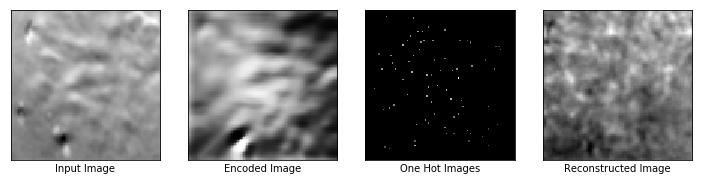

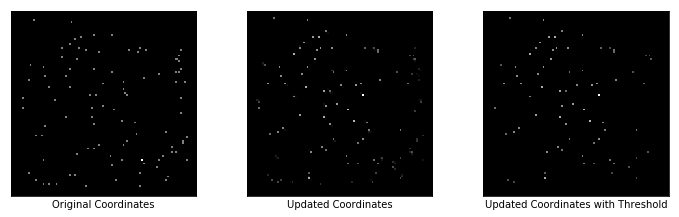

Reconstruction Loss: 0.009109153412282467
Regularizer Loss: 449863.09375, Total Loss: 449863.09375
Encoder Loss: 6.4105682373046875
Max Similarity scores: 0.967767059803009
Updated Coordinates: [[[0.53514457 0.78486186]]]



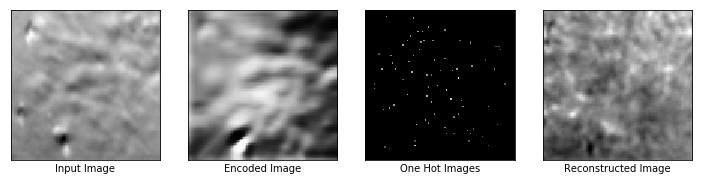

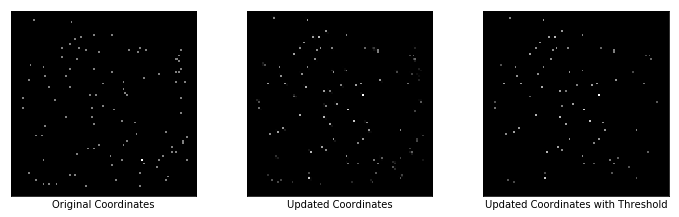

Reconstruction Loss: 0.01037477608770132
Regularizer Loss: 450927.6875, Total Loss: 450927.6875
Encoder Loss: 6.9634575843811035
Max Similarity scores: 0.9686889052391052
Updated Coordinates: [[[0.5354048  0.78482157]]]



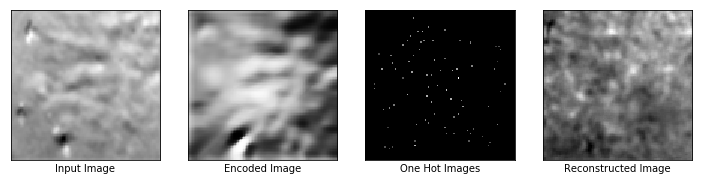

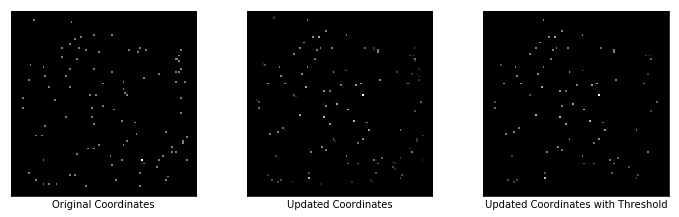

Reconstruction Loss: 0.010309887118637562
Regularizer Loss: 450973.4375, Total Loss: 450973.4375
Encoder Loss: 7.067960739135742
Max Similarity scores: 0.9756401181221008
Updated Coordinates: [[[0.53560174 0.78482556]]]



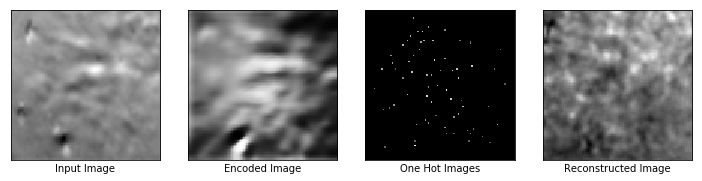

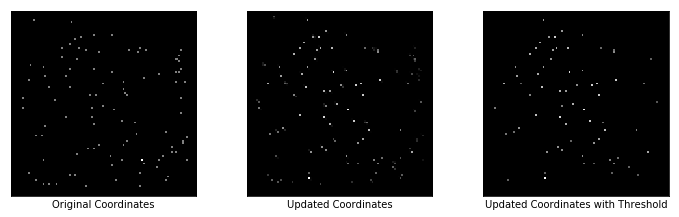

Reconstruction Loss: 0.009863421320915222
Regularizer Loss: 447894.9375, Total Loss: 447894.9375
Encoder Loss: 6.094533443450928
Max Similarity scores: 0.9537099599838257
Updated Coordinates: [[[0.53570205 0.78493875]]]



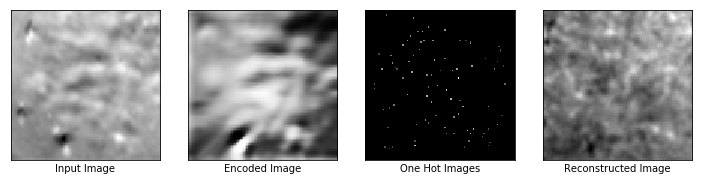

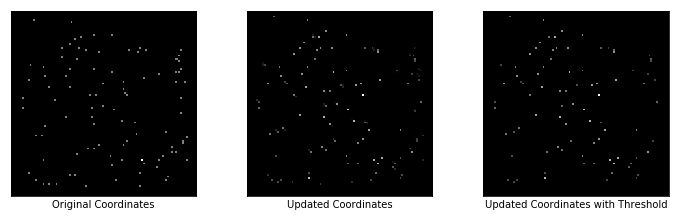

Reconstruction Loss: 0.011144917458295822
Regularizer Loss: 451141.71875, Total Loss: 451141.71875
Encoder Loss: 6.417731761932373
Max Similarity scores: 0.9745634198188782
Updated Coordinates: [[[0.53575724 0.7850836 ]]]



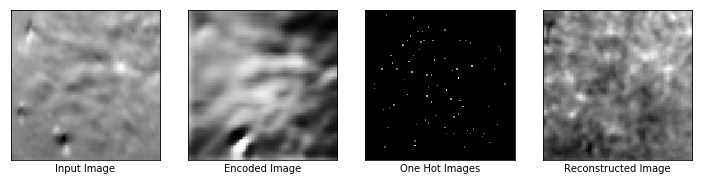

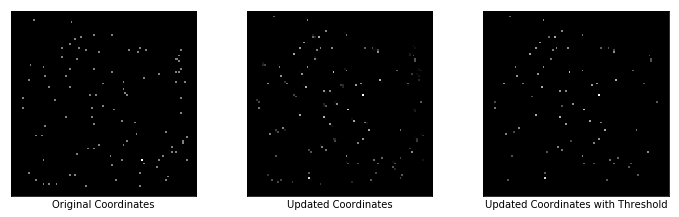

Reconstruction Loss: 0.009779796935617924
Regularizer Loss: 449028.65625, Total Loss: 449028.65625
Encoder Loss: 6.55573034286499
Max Similarity scores: 0.9693622589111328
Updated Coordinates: [[[0.53578377 0.7852328 ]]]



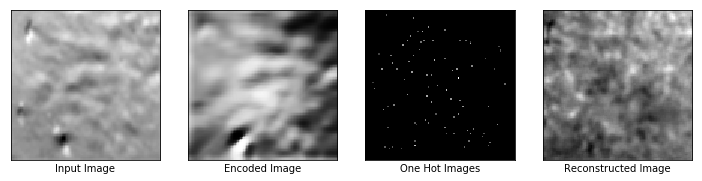

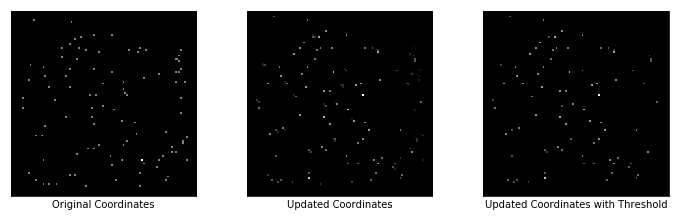

Reconstruction Loss: 0.01029169000685215
Regularizer Loss: 452422.53125, Total Loss: 452422.53125
Encoder Loss: 7.429610729217529
Max Similarity scores: 0.979476273059845
Updated Coordinates: [[[0.5357832 0.7853927]]]



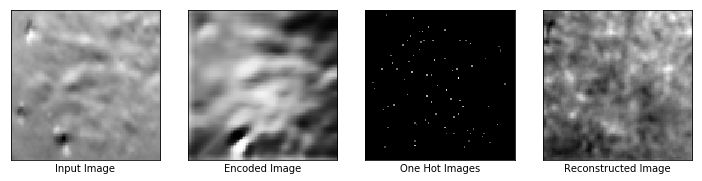

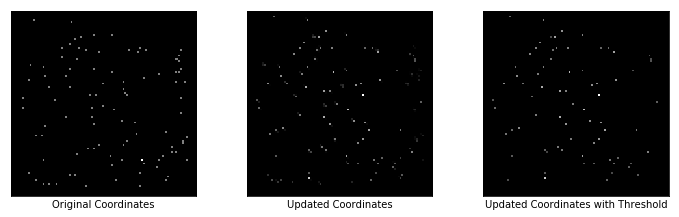

Reconstruction Loss: 0.009975525550544262
Regularizer Loss: 447897.9375, Total Loss: 447897.9375
Encoder Loss: 6.5409040451049805
Max Similarity scores: 0.974809467792511
Updated Coordinates: [[[0.5358551 0.7855032]]]



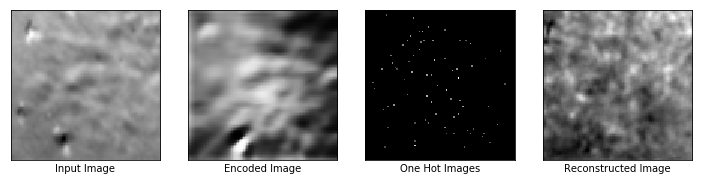

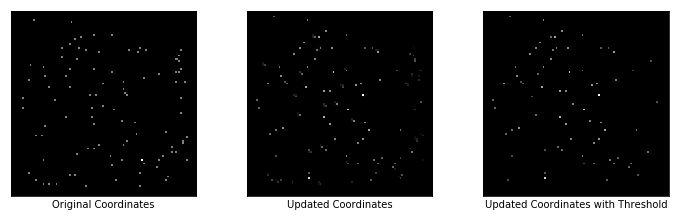

Reconstruction Loss: 0.00948780681937933
Regularizer Loss: 450585.0, Total Loss: 450585.0
Encoder Loss: 7.175367832183838
Max Similarity scores: 0.9615338444709778
Updated Coordinates: [[[0.53592676 0.7855759 ]]]



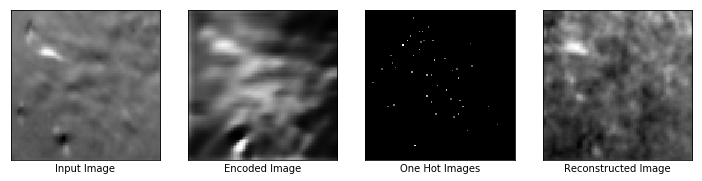

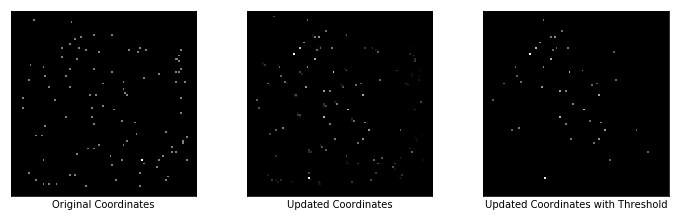

Reconstruction Loss: 0.008638680912554264
Regularizer Loss: 446392.90625, Total Loss: 446392.90625
Encoder Loss: 6.143477439880371
Max Similarity scores: 0.8668289184570312
Updated Coordinates: [[[0.53609645 0.7855801 ]]]



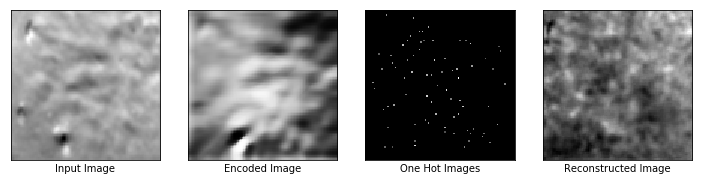

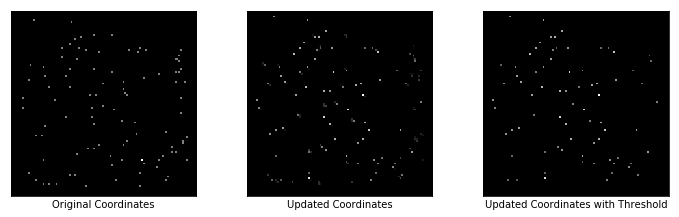

Reconstruction Loss: 0.010535120032727718
Regularizer Loss: 452776.5625, Total Loss: 452776.5625
Encoder Loss: 7.45412015914917
Max Similarity scores: 0.9736306667327881
Updated Coordinates: [[[0.53621155 0.785618  ]]]



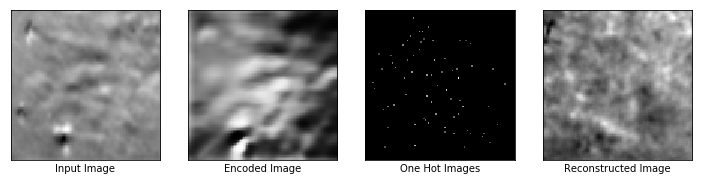

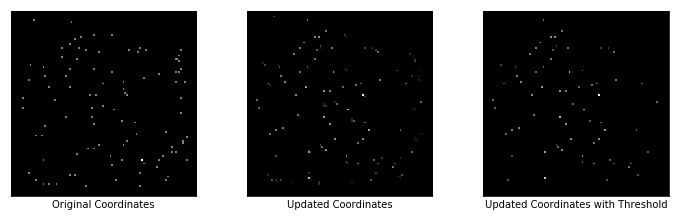

Reconstruction Loss: 0.010508371517062187
Regularizer Loss: 451170.59375, Total Loss: 451170.59375
Encoder Loss: 7.161856174468994
Max Similarity scores: 0.9488637447357178
Updated Coordinates: [[[0.53629583 0.78566587]]]



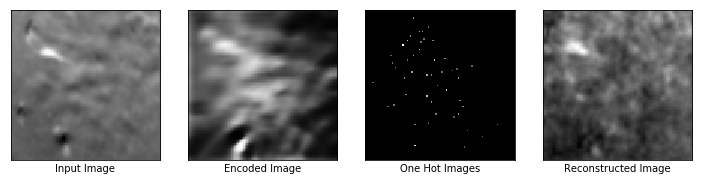

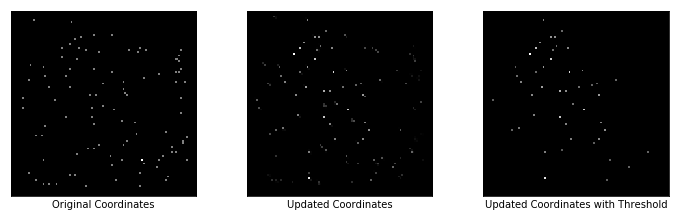

Reconstruction Loss: 0.00758807547390461
Regularizer Loss: 447593.8125, Total Loss: 447593.8125
Encoder Loss: 5.681628704071045
Max Similarity scores: 0.8833815455436707
Updated Coordinates: [[[0.5363397 0.7857416]]]



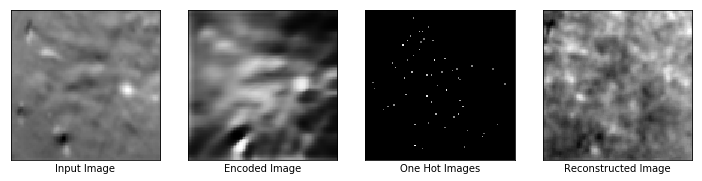

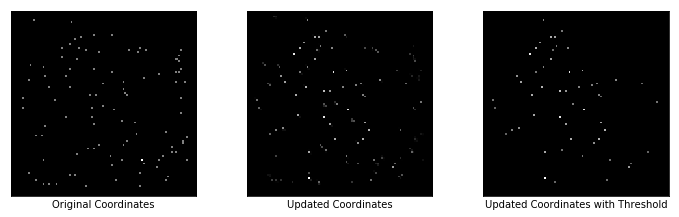

Reconstruction Loss: 0.008368794806301594
Regularizer Loss: 445706.8125, Total Loss: 445706.8125
Encoder Loss: 5.99411153793335
Max Similarity scores: 0.8965953588485718
Updated Coordinates: [[[0.53634673 0.7858449 ]]]



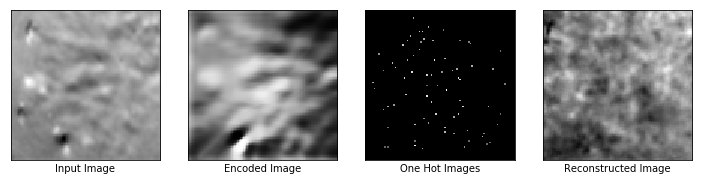

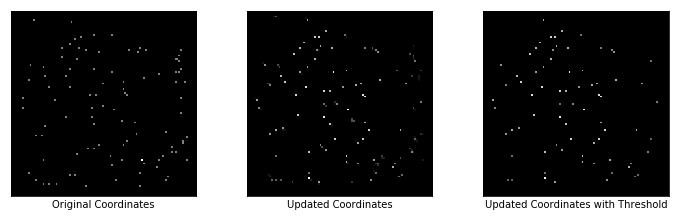

Reconstruction Loss: 0.007611396722495556
Regularizer Loss: 445467.65625, Total Loss: 445467.65625
Encoder Loss: 5.530314922332764
Max Similarity scores: 0.9759107828140259
Updated Coordinates: [[[0.5363311  0.78596044]]]



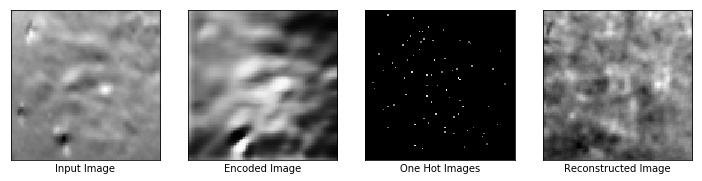

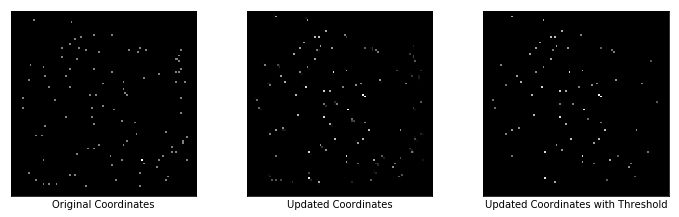

Reconstruction Loss: 0.008073871955275536
Regularizer Loss: 447860.40625, Total Loss: 447860.40625
Encoder Loss: 6.4070916175842285
Max Similarity scores: 0.9481358528137207
Updated Coordinates: [[[0.5363161 0.7860773]]]



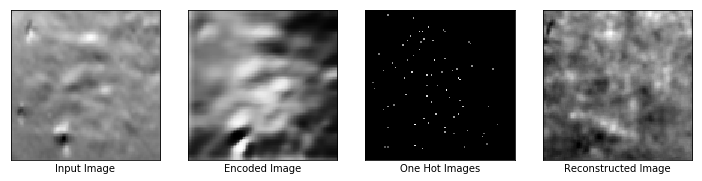

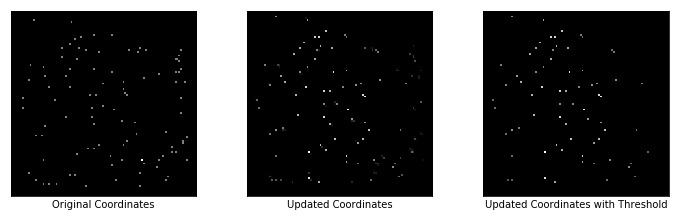

Reconstruction Loss: 0.01042009238153696
Regularizer Loss: 452561.1875, Total Loss: 452561.1875
Encoder Loss: 7.6696343421936035
Max Similarity scores: 0.9358324408531189
Updated Coordinates: [[[0.53629667 0.78618973]]]



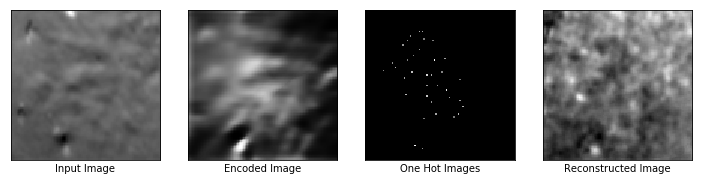

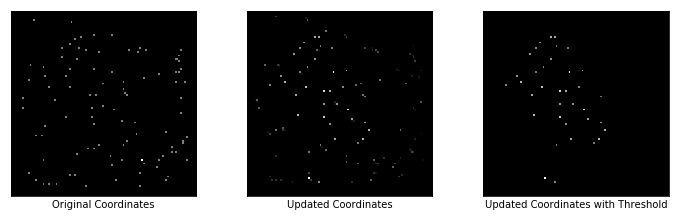

Reconstruction Loss: 0.00790437962859869
Regularizer Loss: 448960.5625, Total Loss: 448960.5625
Encoder Loss: 6.409707069396973
Max Similarity scores: 0.8012243509292603
Updated Coordinates: [[[0.5363153 0.7862601]]]



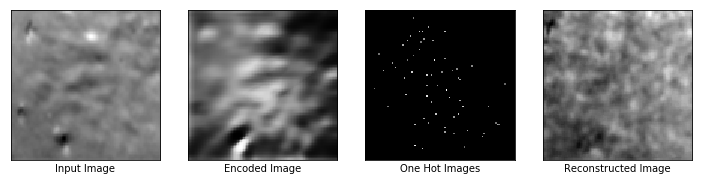

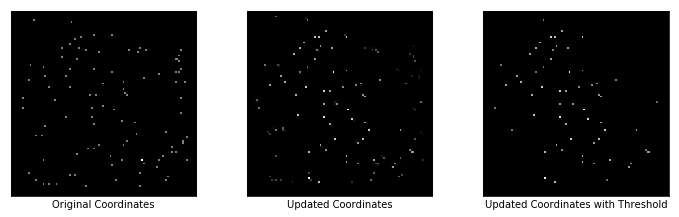

Reconstruction Loss: 0.00892503373324871
Regularizer Loss: 450291.6875, Total Loss: 450291.6875
Encoder Loss: 7.485947608947754
Max Similarity scores: 0.9062920808792114
Updated Coordinates: [[[0.53639567 0.78628385]]]



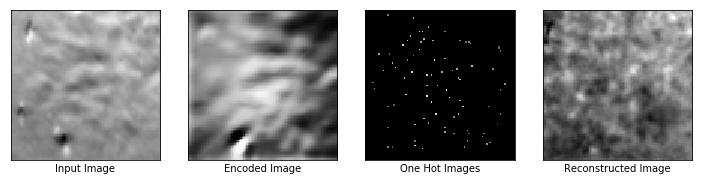

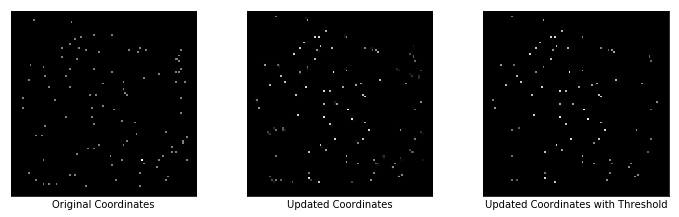

Reconstruction Loss: 0.008455623872578144
Regularizer Loss: 447310.40625, Total Loss: 447310.40625
Encoder Loss: 6.783709526062012
Max Similarity scores: 0.9732491374015808
Updated Coordinates: [[[0.5364916 0.7862813]]]



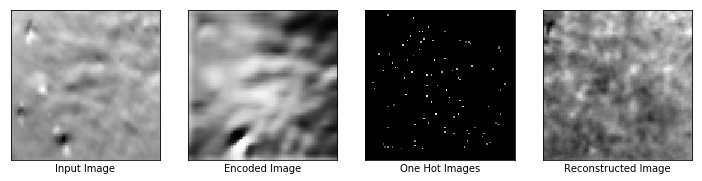

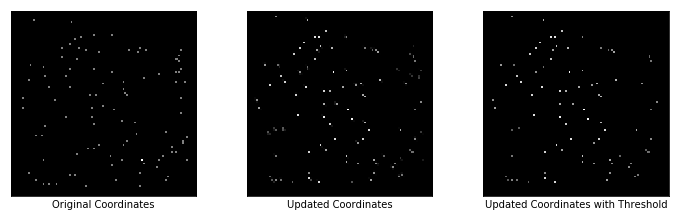

Reconstruction Loss: 0.007102987729012966
Regularizer Loss: 445698.4375, Total Loss: 445698.4375
Encoder Loss: 5.7109293937683105
Max Similarity scores: 0.9816545844078064
Updated Coordinates: [[[0.53655434 0.7862875 ]]]



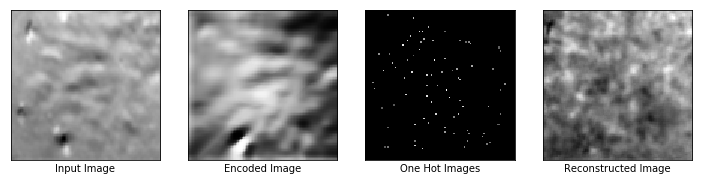

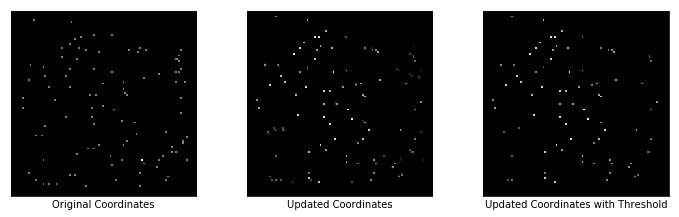

Reconstruction Loss: 0.007610845845192671
Regularizer Loss: 449193.1875, Total Loss: 449193.1875
Encoder Loss: 6.361315727233887
Max Similarity scores: 0.9774442315101624
Updated Coordinates: [[[0.5365925 0.7863088]]]



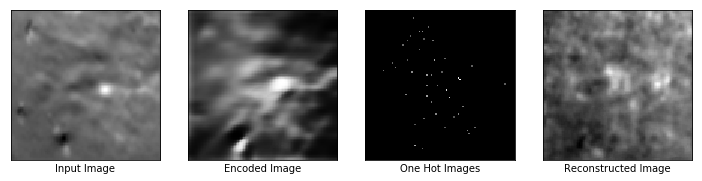

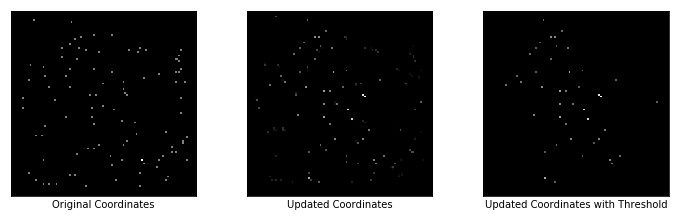

Reconstruction Loss: 0.008093016222119331
Regularizer Loss: 439225.71875, Total Loss: 439225.71875
Encoder Loss: 5.007260799407959
Max Similarity scores: 0.9404833912849426
Updated Coordinates: [[[0.5366049 0.7863456]]]



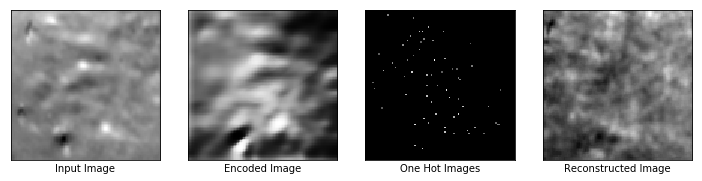

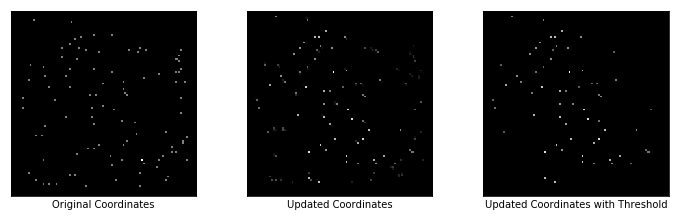

Reconstruction Loss: 0.009214420802891254
Regularizer Loss: 441566.78125, Total Loss: 441566.78125
Encoder Loss: 5.7212018966674805
Max Similarity scores: 0.9420002698898315
Updated Coordinates: [[[0.5366329  0.78638464]]]



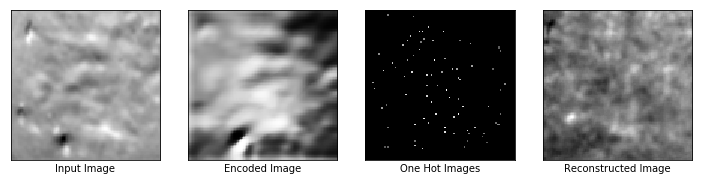

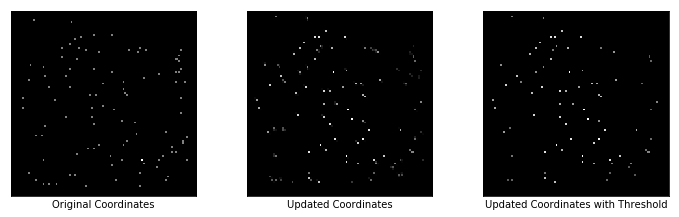

Reconstruction Loss: 0.008551211096346378
Regularizer Loss: 443469.5625, Total Loss: 443469.5625
Encoder Loss: 6.447599411010742
Max Similarity scores: 0.9807107448577881
Updated Coordinates: [[[0.536651   0.78643245]]]



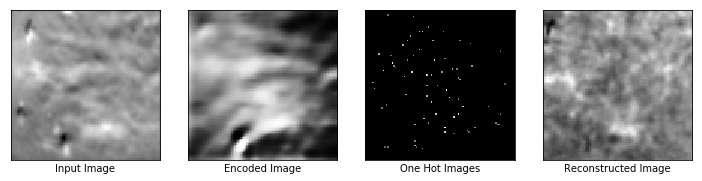

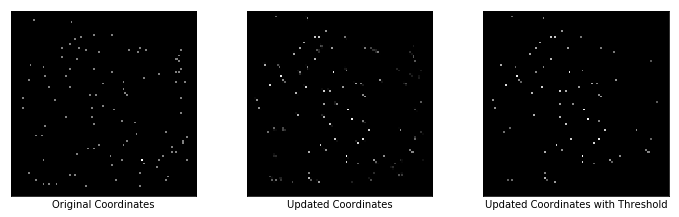

Reconstruction Loss: 0.010141771286725998
Regularizer Loss: 449905.84375, Total Loss: 449905.84375
Encoder Loss: 7.488349437713623
Max Similarity scores: 0.9683282375335693
Updated Coordinates: [[[0.5366631 0.7864763]]]



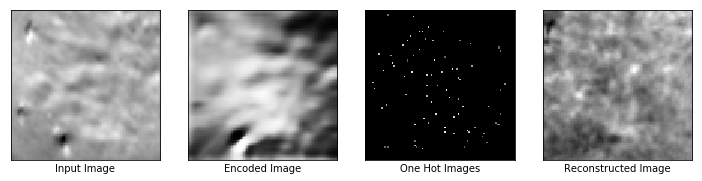

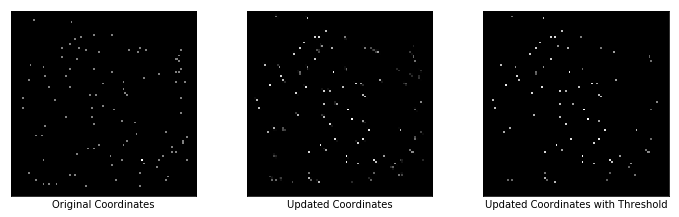

Reconstruction Loss: 0.00974326767027378
Regularizer Loss: 447650.03125, Total Loss: 447650.03125
Encoder Loss: 7.265920162200928
Max Similarity scores: 0.9817284941673279
Updated Coordinates: [[[0.53666323 0.7865237 ]]]



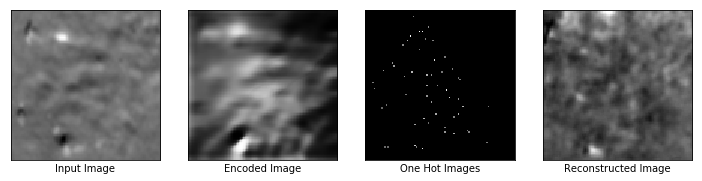

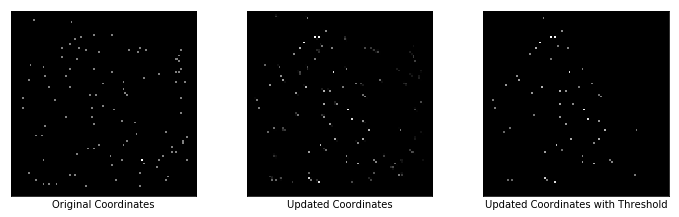

Reconstruction Loss: 0.008020912297070026
Regularizer Loss: 441726.25, Total Loss: 441726.25
Encoder Loss: 5.212682723999023
Max Similarity scores: 0.9471427202224731
Updated Coordinates: [[[0.53664786 0.7865808 ]]]



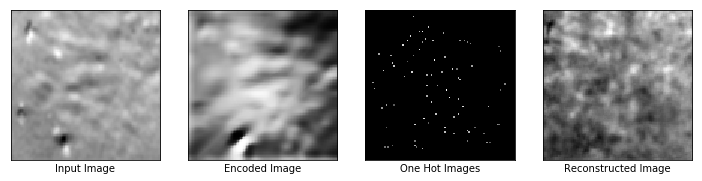

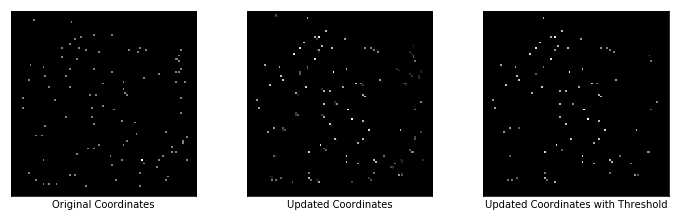

Reconstruction Loss: 0.00974439736455679
Regularizer Loss: 451068.9375, Total Loss: 451068.9375
Encoder Loss: 8.540901184082031
Max Similarity scores: 0.9786209464073181
Updated Coordinates: [[[0.53668153 0.7866263 ]]]



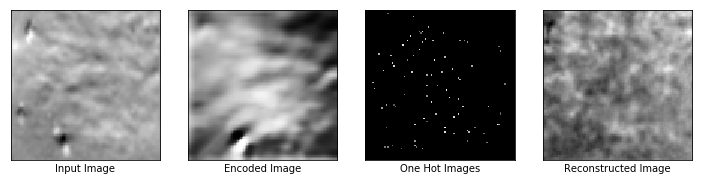

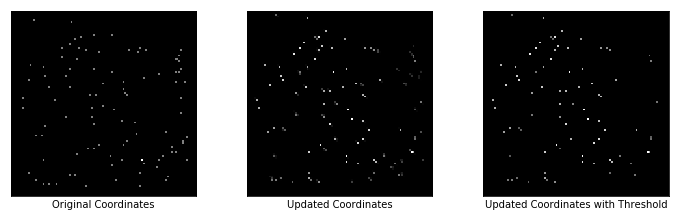

Reconstruction Loss: 0.009456586092710495
Regularizer Loss: 449706.71875, Total Loss: 449706.71875
Encoder Loss: 8.231731414794922
Max Similarity scores: 0.9778367877006531
Updated Coordinates: [[[0.5366994  0.78666246]]]



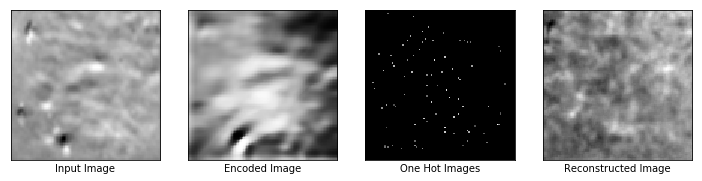

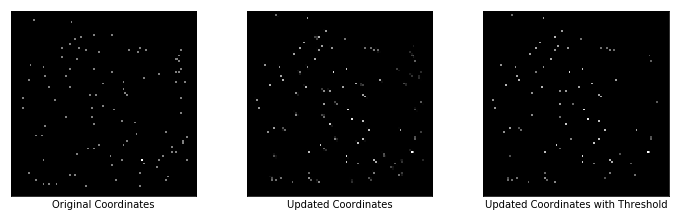

Reconstruction Loss: 0.009328234940767288
Regularizer Loss: 448970.5625, Total Loss: 448970.5625
Encoder Loss: 8.033550262451172
Max Similarity scores: 0.9662330150604248
Updated Coordinates: [[[0.53667396 0.78670555]]]



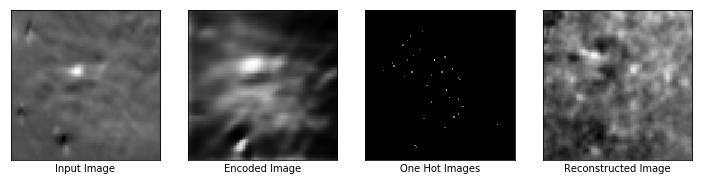

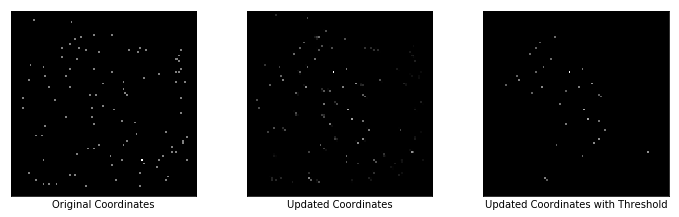

Reconstruction Loss: 0.00844944640994072
Regularizer Loss: 439023.28125, Total Loss: 439023.28125
Encoder Loss: 5.384336948394775
Max Similarity scores: 0.8612092137336731
Updated Coordinates: [[[0.5366262  0.78674495]]]



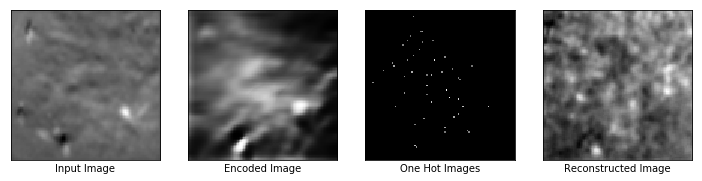

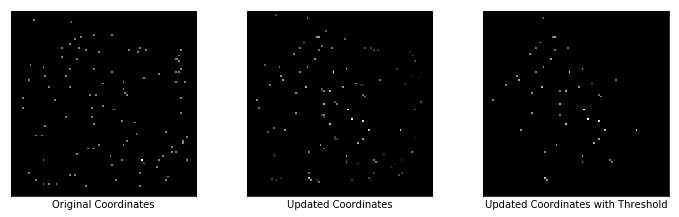

Reconstruction Loss: 0.008090050891041756
Regularizer Loss: 439775.34375, Total Loss: 439775.34375
Encoder Loss: 5.286052703857422
Max Similarity scores: 0.9026166796684265
Updated Coordinates: [[[0.5364633  0.78683186]]]



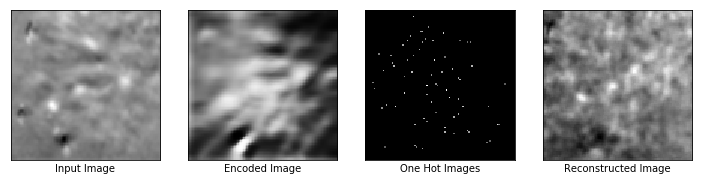

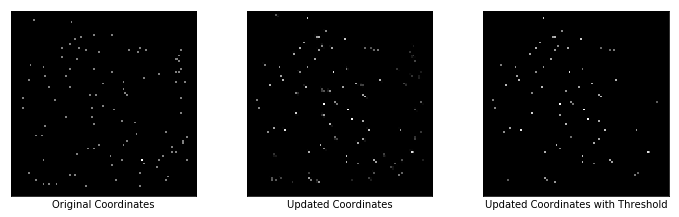

Reconstruction Loss: 0.008291390724480152
Regularizer Loss: 443038.53125, Total Loss: 443038.53125
Encoder Loss: 5.435003757476807
Max Similarity scores: 0.9320467710494995
Updated Coordinates: [[[0.53625643 0.7869276 ]]]



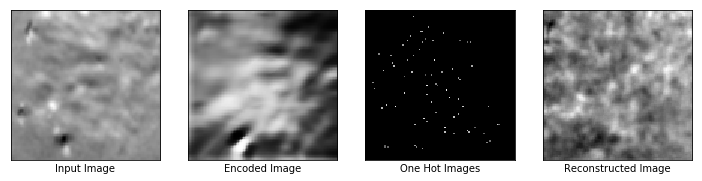

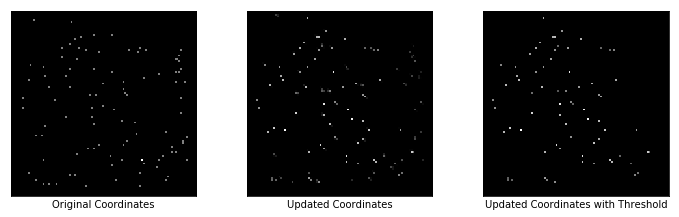

Reconstruction Loss: 0.0075975204817950726
Regularizer Loss: 441947.28125, Total Loss: 441947.28125
Encoder Loss: 5.246431827545166
Max Similarity scores: 0.9713643193244934
Updated Coordinates: [[[0.53610206 0.78699416]]]



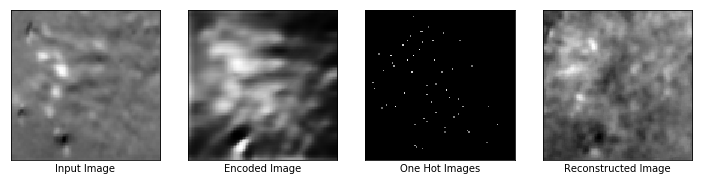

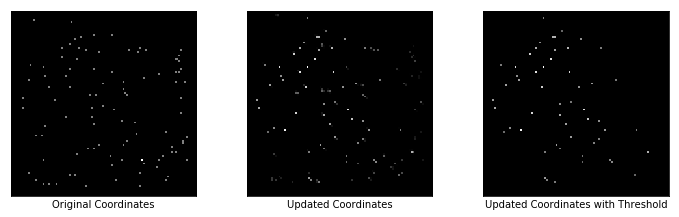

Reconstruction Loss: 0.007528547663241625
Regularizer Loss: 440802.46875, Total Loss: 440802.46875
Encoder Loss: 3.408961772918701
Max Similarity scores: 0.8387119174003601
Updated Coordinates: [[[0.5359746 0.7870407]]]



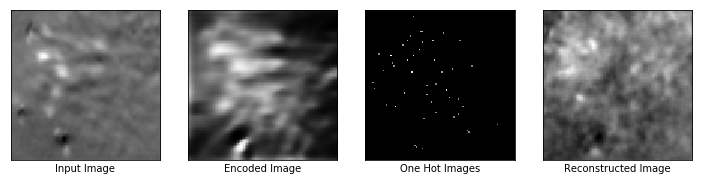

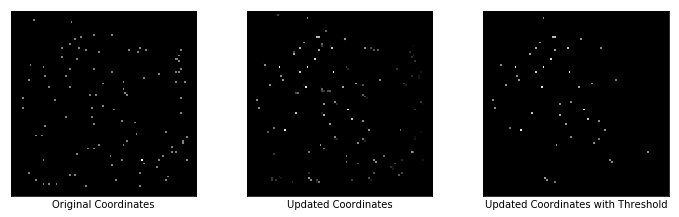

Reconstruction Loss: 0.007408731151372194
Regularizer Loss: 442156.0625, Total Loss: 442156.0625
Encoder Loss: 3.703325033187866
Max Similarity scores: 0.7883370518684387
Updated Coordinates: [[[0.53590137 0.7870573 ]]]



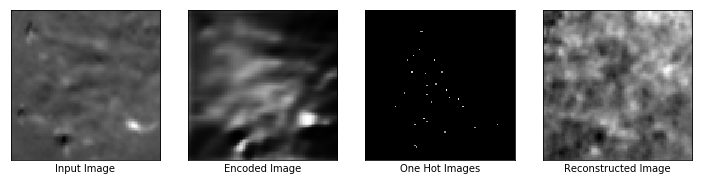

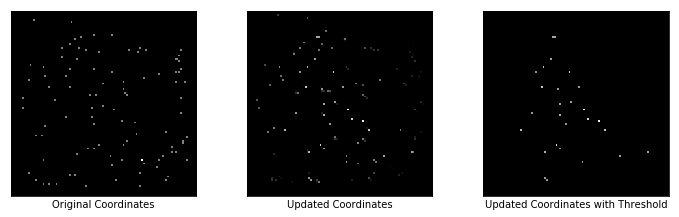

Reconstruction Loss: 0.008995083160698414
Regularizer Loss: 435366.4375, Total Loss: 435366.4375
Encoder Loss: 4.312473297119141
Max Similarity scores: 0.645293653011322
Updated Coordinates: [[[0.5358213  0.78708196]]]



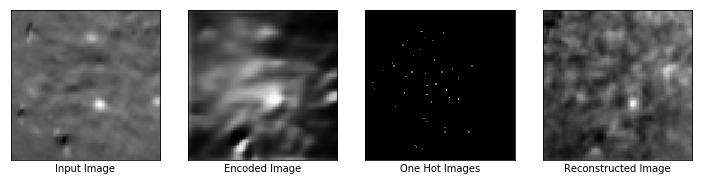

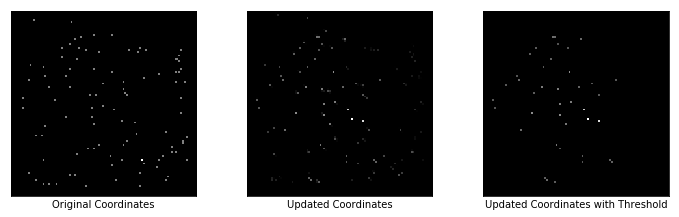

Reconstruction Loss: 0.006575056351721287
Regularizer Loss: 435089.125, Total Loss: 435089.125
Encoder Loss: 4.220332145690918
Max Similarity scores: 0.9316015243530273
Updated Coordinates: [[[0.53575754 0.7871226 ]]]



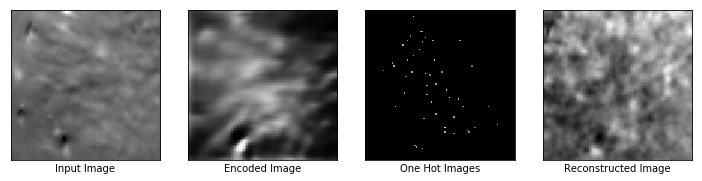

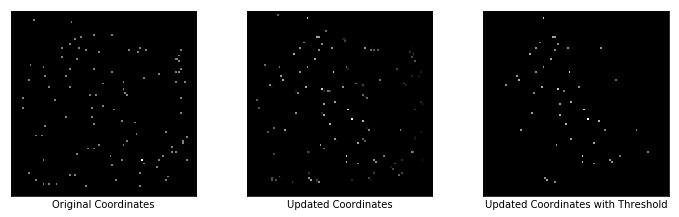

Reconstruction Loss: 0.007399037014693022
Regularizer Loss: 436792.3125, Total Loss: 436792.3125
Encoder Loss: 5.112560749053955
Max Similarity scores: 0.8228516578674316
Updated Coordinates: [[[0.5356996  0.78716654]]]



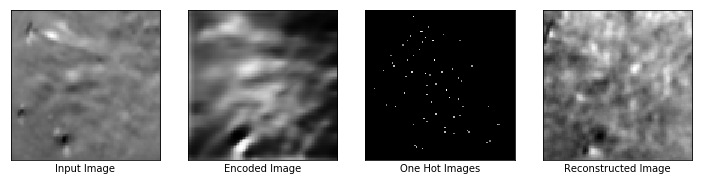

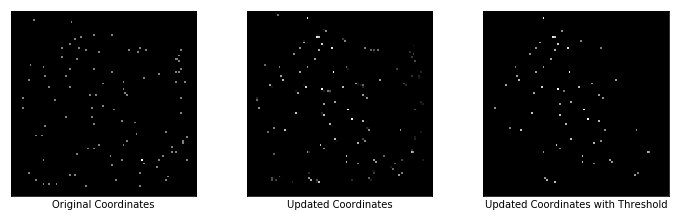

Reconstruction Loss: 0.008076522499322891
Regularizer Loss: 441345.96875, Total Loss: 441345.96875
Encoder Loss: 6.204619884490967
Max Similarity scores: 0.8756698369979858
Updated Coordinates: [[[0.5356242 0.787207 ]]]



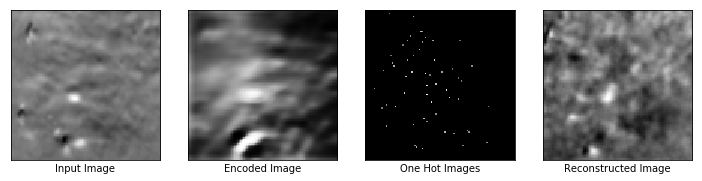

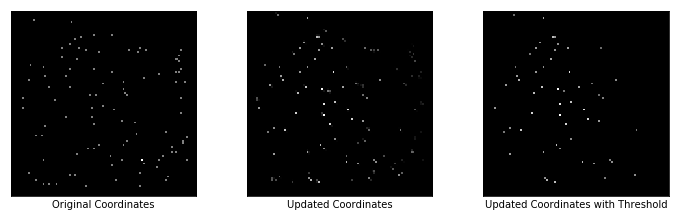

Reconstruction Loss: 0.006560867186635733
Regularizer Loss: 439217.96875, Total Loss: 439217.96875
Encoder Loss: 4.085247039794922
Max Similarity scores: 0.9492976069450378
Updated Coordinates: [[[0.5355538 0.7872441]]]



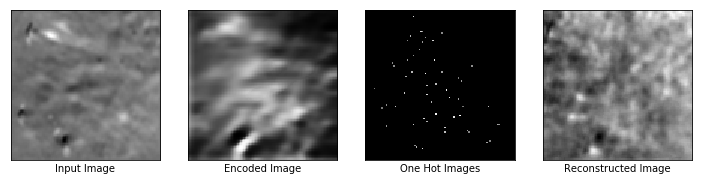

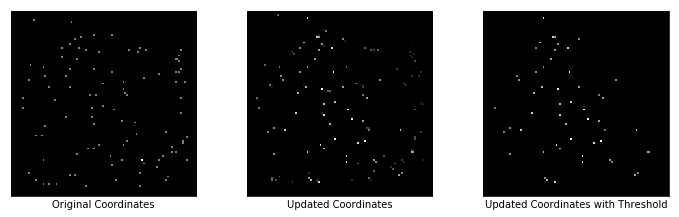

Reconstruction Loss: 0.00850671622902155
Regularizer Loss: 437610.0, Total Loss: 437610.0
Encoder Loss: 6.577251434326172
Max Similarity scores: 0.8380229473114014
Updated Coordinates: [[[0.53550935 0.7872782 ]]]



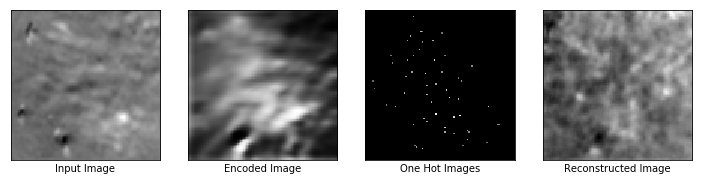

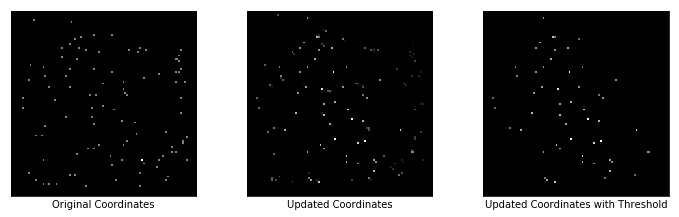

Reconstruction Loss: 0.007458941545337439
Regularizer Loss: 437084.375, Total Loss: 437084.375
Encoder Loss: 5.475420951843262
Max Similarity scores: 0.8453913331031799
Updated Coordinates: [[[0.53545856 0.7873176 ]]]



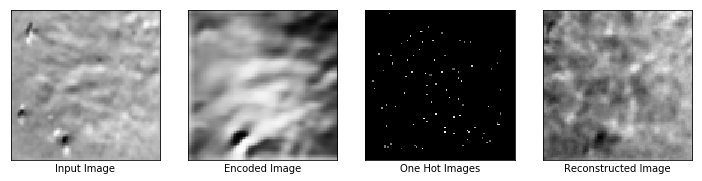

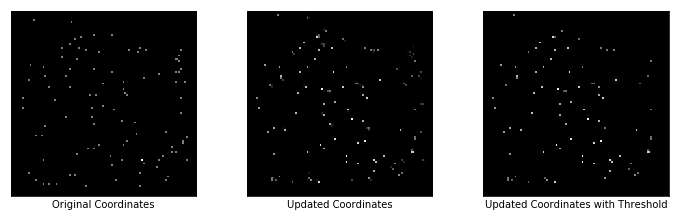

Reconstruction Loss: 0.008022426627576351
Regularizer Loss: 440682.15625, Total Loss: 440682.15625
Encoder Loss: 6.9612250328063965
Max Similarity scores: 0.9313650131225586
Updated Coordinates: [[[0.53542084 0.787362  ]]]



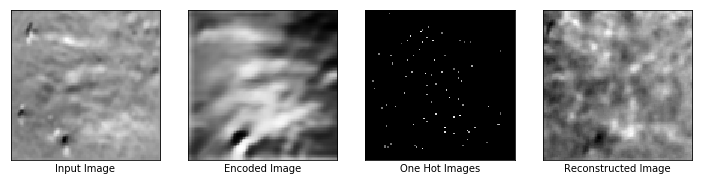

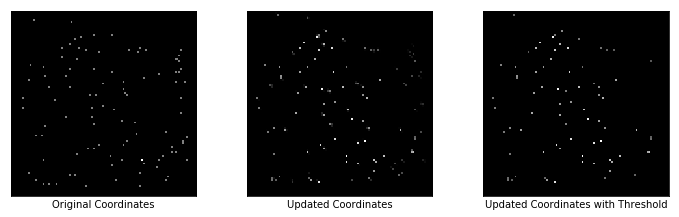

Reconstruction Loss: 0.008793245069682598
Regularizer Loss: 438312.5, Total Loss: 438312.5
Encoder Loss: 4.968878746032715
Max Similarity scores: 0.9175505042076111
Updated Coordinates: [[[0.5353757  0.78741026]]]



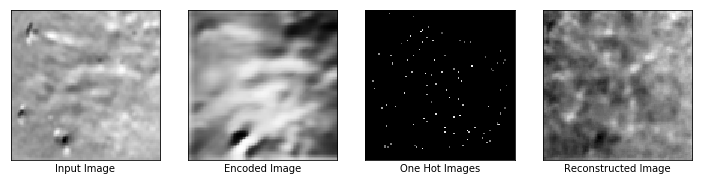

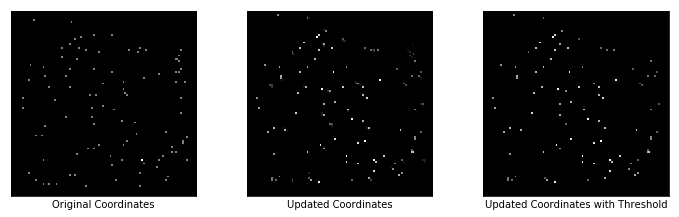

Reconstruction Loss: 0.008299045264720917
Regularizer Loss: 440043.0625, Total Loss: 440043.0625
Encoder Loss: 6.590414047241211
Max Similarity scores: 0.9306088089942932
Updated Coordinates: [[[0.5353337 0.7875192]]]



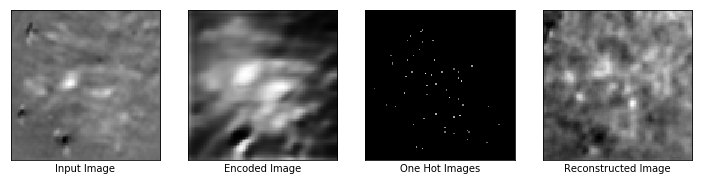

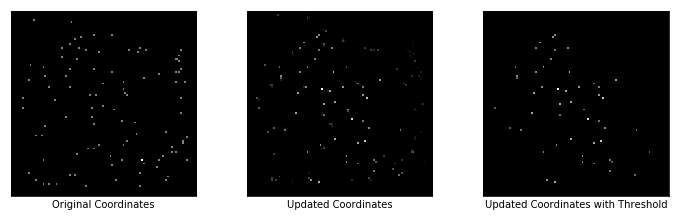

Reconstruction Loss: 0.007498370483517647
Regularizer Loss: 439467.71875, Total Loss: 439467.71875
Encoder Loss: 6.178317546844482
Max Similarity scores: 0.9280335903167725
Updated Coordinates: [[[0.5353034  0.78765315]]]



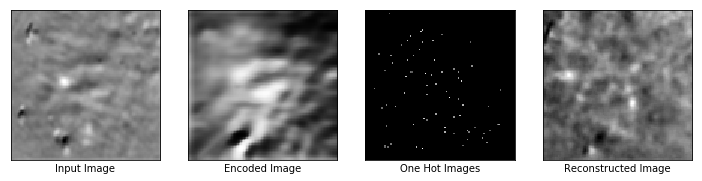

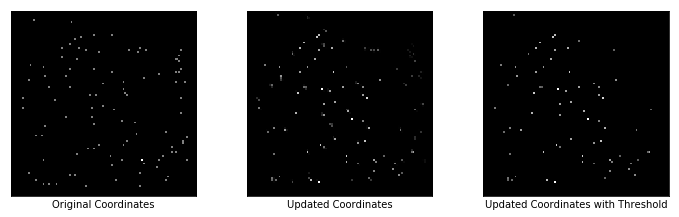

Reconstruction Loss: 0.006569691468030214
Regularizer Loss: 435802.875, Total Loss: 435802.875
Encoder Loss: 5.162979602813721
Max Similarity scores: 0.9468342065811157
Updated Coordinates: [[[0.53528035 0.7877811 ]]]



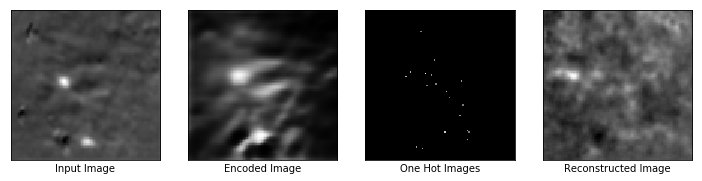

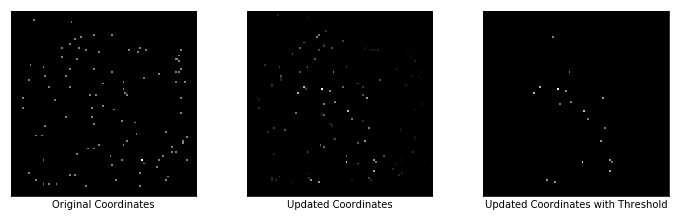

Reconstruction Loss: 0.00786969717592001
Regularizer Loss: 440827.8125, Total Loss: 440827.8125
Encoder Loss: 6.512115955352783
Max Similarity scores: 0.7204128503799438
Updated Coordinates: [[[0.53526455 0.7879116 ]]]



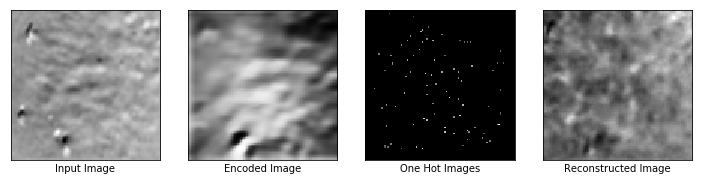

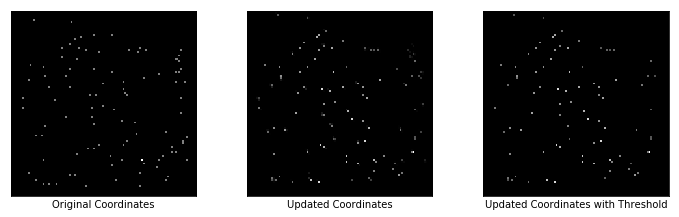

Reconstruction Loss: 0.008840754628181458
Regularizer Loss: 446737.125, Total Loss: 446737.125
Encoder Loss: 8.48243236541748
Max Similarity scores: 0.9389534592628479
Updated Coordinates: [[[0.5352717  0.78804225]]]



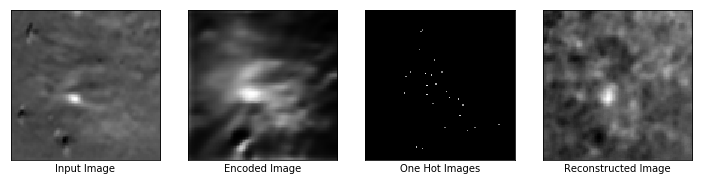

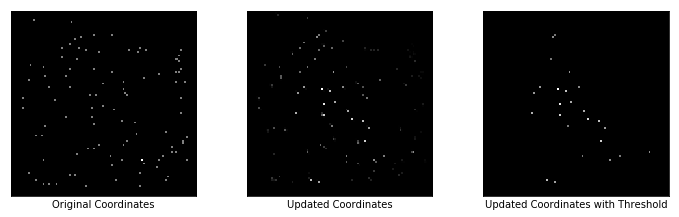

Reconstruction Loss: 0.00705804442986846
Regularizer Loss: 440000.96875, Total Loss: 440000.96875
Encoder Loss: 6.518880367279053
Max Similarity scores: 0.921142041683197
Updated Coordinates: [[[0.53528243 0.78816056]]]



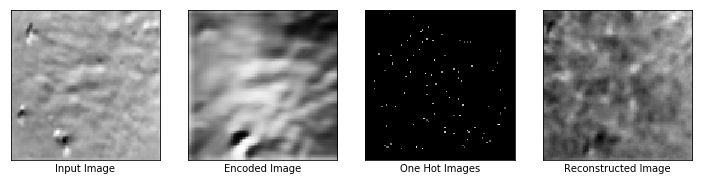

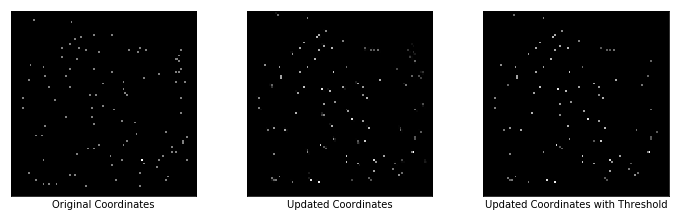

Reconstruction Loss: 0.010271395556628704
Regularizer Loss: 441901.28125, Total Loss: 441901.28125
Encoder Loss: 6.209456920623779
Max Similarity scores: 0.9531406760215759
Updated Coordinates: [[[0.53528565 0.78827226]]]



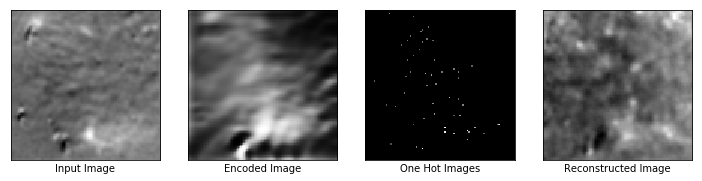

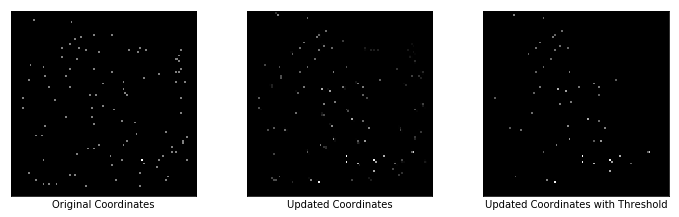

Reconstruction Loss: 0.010870695114135742
Regularizer Loss: 434693.84375, Total Loss: 434693.84375
Encoder Loss: 5.657387733459473
Max Similarity scores: 0.9464800953865051
Updated Coordinates: [[[0.53524065 0.78839475]]]



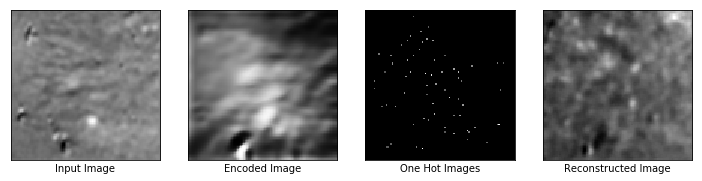

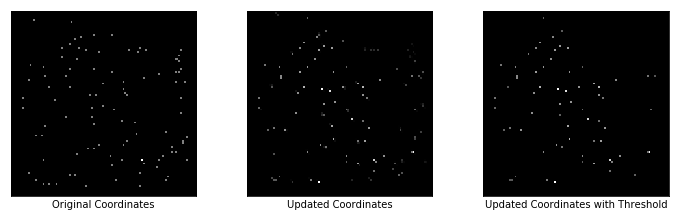

Reconstruction Loss: 0.008728803135454655
Regularizer Loss: 437948.6875, Total Loss: 437948.6875
Encoder Loss: 4.078122615814209
Max Similarity scores: 0.9121787548065186
Updated Coordinates: [[[0.53511345 0.7885537 ]]]



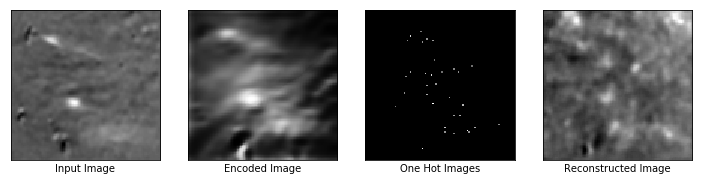

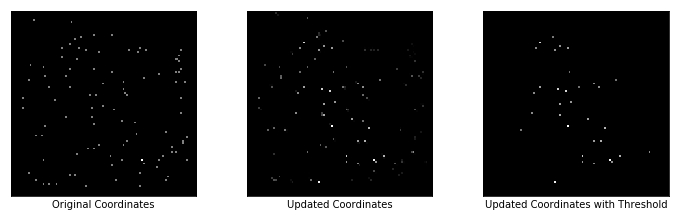

Reconstruction Loss: 0.009199410676956177
Regularizer Loss: 435219.03125, Total Loss: 435219.03125
Encoder Loss: 4.689465045928955
Max Similarity scores: 0.8566302061080933
Updated Coordinates: [[[0.53477764 0.78882015]]]



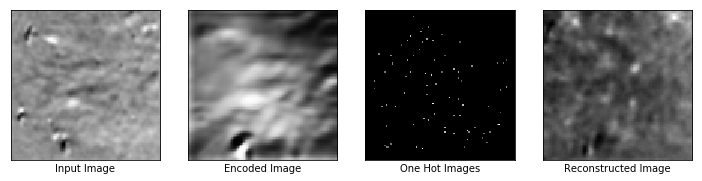

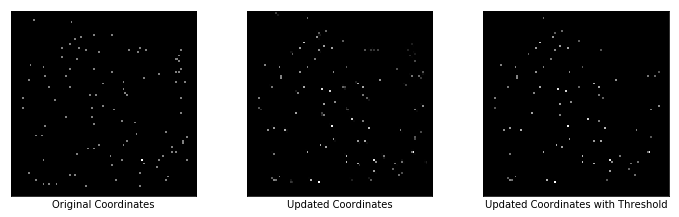

Reconstruction Loss: 0.00970609113574028
Regularizer Loss: 434124.375, Total Loss: 434124.375
Encoder Loss: 4.711132049560547
Max Similarity scores: 0.95230633020401
Updated Coordinates: [[[0.5343714 0.7891498]]]



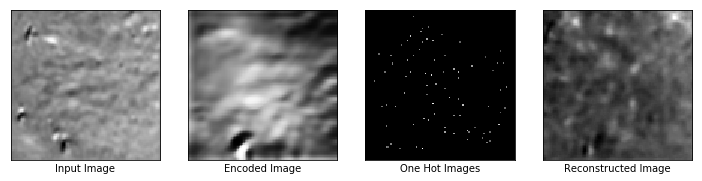

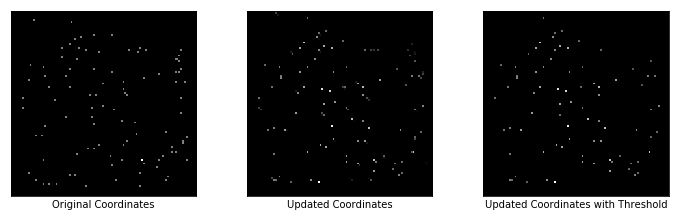

Reconstruction Loss: 0.011014190502464771
Regularizer Loss: 433924.78125, Total Loss: 433924.78125
Encoder Loss: 5.857072830200195
Max Similarity scores: 0.9603878855705261
Updated Coordinates: [[[0.5334573 0.7899077]]]



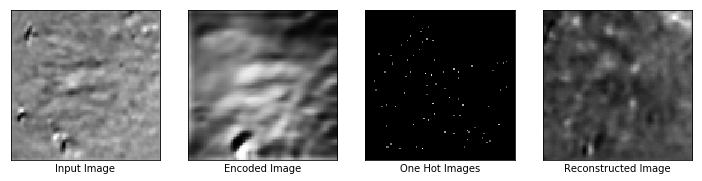

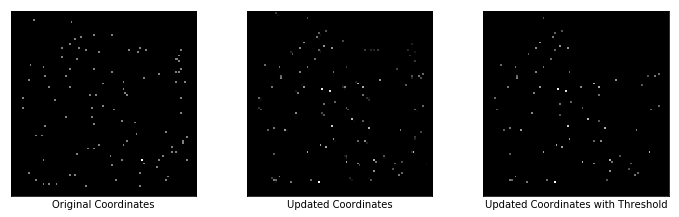

Reconstruction Loss: 0.014078018255531788
Regularizer Loss: 432876.09375, Total Loss: 432876.09375
Encoder Loss: 5.930429458618164
Max Similarity scores: 0.9925633668899536
Updated Coordinates: [[[0.5326557  0.79053885]]]



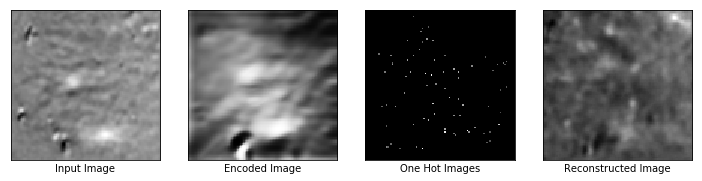

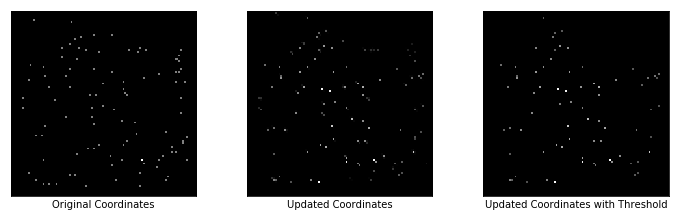

Reconstruction Loss: 0.012102525681257248
Regularizer Loss: 438974.75, Total Loss: 438974.75
Encoder Loss: 7.324706077575684
Max Similarity scores: 0.9489898085594177
Updated Coordinates: [[[0.53167075 0.7913824 ]]]



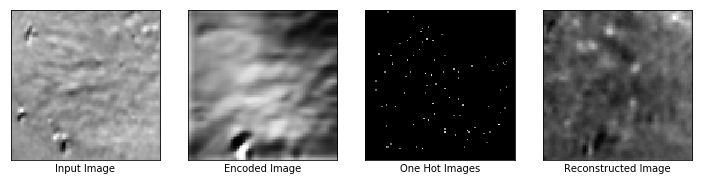

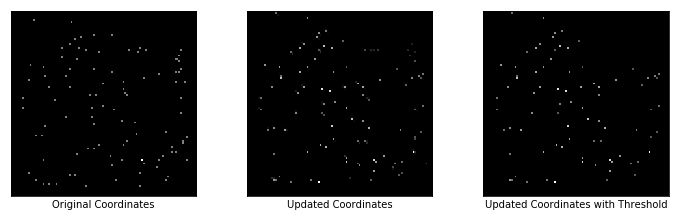

Reconstruction Loss: 0.012252021580934525
Regularizer Loss: 440851.15625, Total Loss: 440851.15625
Encoder Loss: 7.154426574707031
Max Similarity scores: 0.9635743498802185
Updated Coordinates: [[[0.5307417  0.79200643]]]



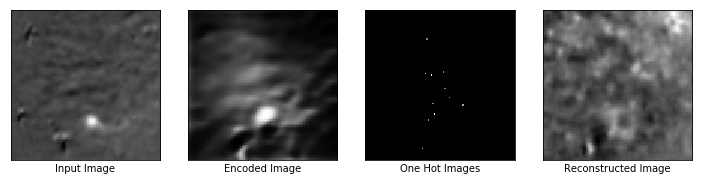

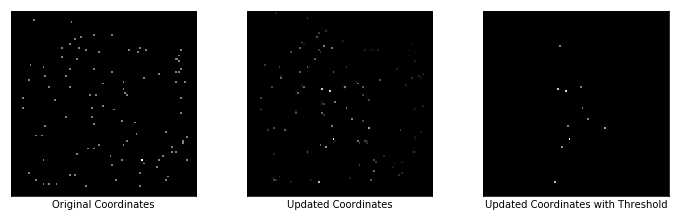

Reconstruction Loss: 0.009924934245646
Regularizer Loss: 437629.75, Total Loss: 437629.75
Encoder Loss: 5.045108318328857
Max Similarity scores: 0.6790328621864319
Updated Coordinates: [[[0.5300962 0.7925476]]]



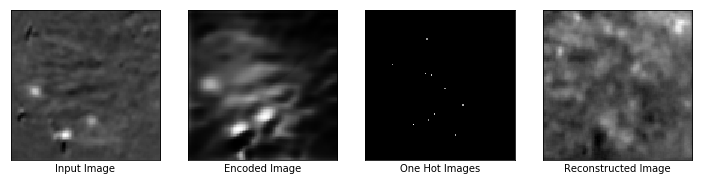

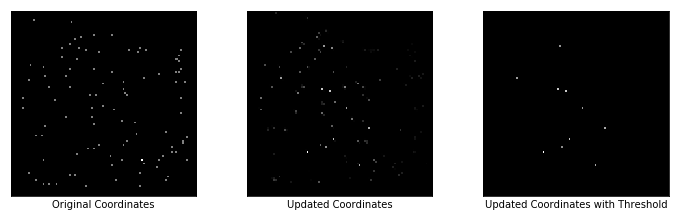

Reconstruction Loss: 0.010411403141915798
Regularizer Loss: 437811.25, Total Loss: 437811.25
Encoder Loss: 4.614281177520752
Max Similarity scores: 0.5764918327331543
Updated Coordinates: [[[0.5290746  0.79361707]]]



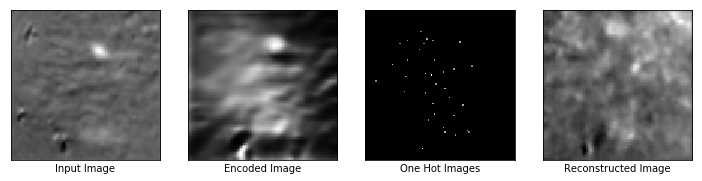

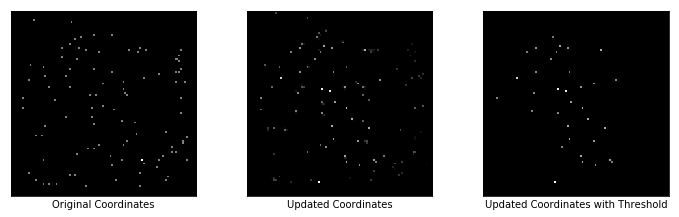

Reconstruction Loss: 0.007069035433232784
Regularizer Loss: 439421.4375, Total Loss: 439421.4375
Encoder Loss: 2.827256917953491
Max Similarity scores: 0.6698976159095764
Updated Coordinates: [[[0.52812797 0.79383135]]]



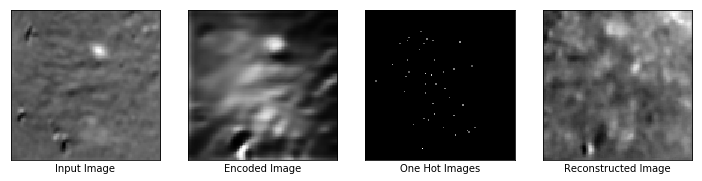

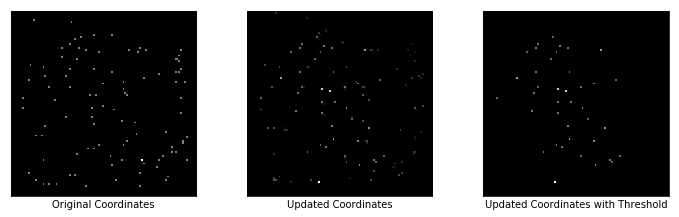

Reconstruction Loss: 0.010000812821090221
Regularizer Loss: 435461.15625, Total Loss: 435461.15625
Encoder Loss: 4.141083240509033
Max Similarity scores: 0.8156014680862427
Updated Coordinates: [[[0.5273149  0.79350996]]]



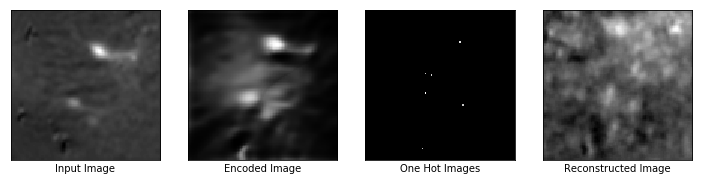

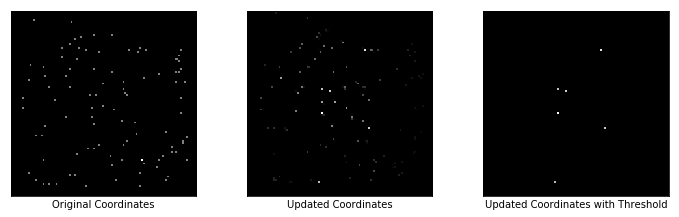

Reconstruction Loss: 0.009565530344843864
Regularizer Loss: 435878.125, Total Loss: 435878.125
Encoder Loss: 4.783658504486084
Max Similarity scores: 0.5902734398841858
Updated Coordinates: [[[0.5268749 0.792502 ]]]



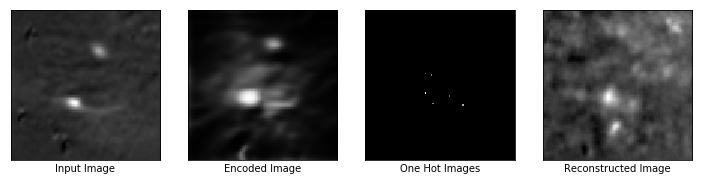

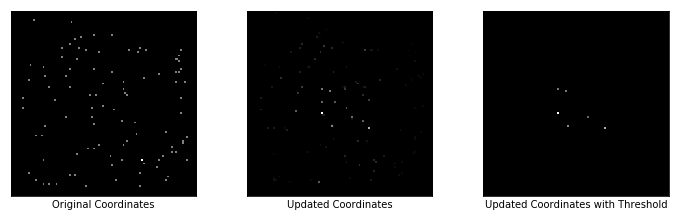

Reconstruction Loss: 0.00646777031943202
Regularizer Loss: 440471.5, Total Loss: 440471.5
Encoder Loss: 2.3321127891540527
Max Similarity scores: 0.866896390914917
Updated Coordinates: [[[0.526514   0.79132783]]]



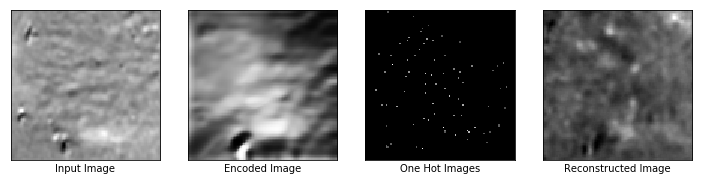

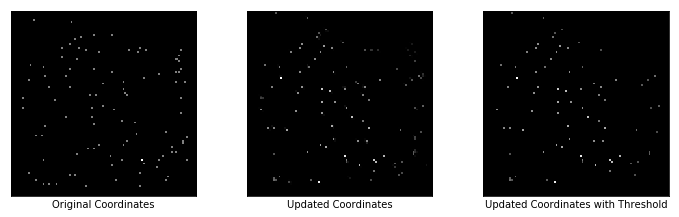

Reconstruction Loss: 0.011898740194737911
Regularizer Loss: 438488.5625, Total Loss: 438488.5625
Encoder Loss: 6.786831378936768
Max Similarity scores: 0.9565261602401733
Updated Coordinates: [[[0.5261851 0.790264 ]]]



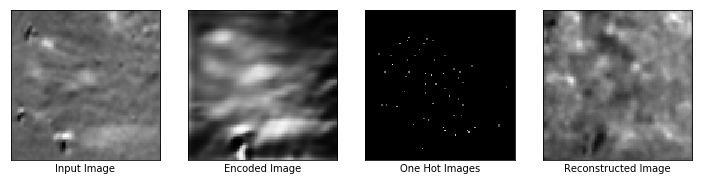

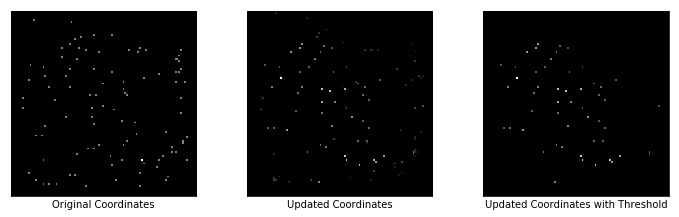

Reconstruction Loss: 0.011375135742127895
Regularizer Loss: 437474.1875, Total Loss: 437474.1875
Encoder Loss: 5.867990493774414
Max Similarity scores: 0.8282729387283325
Updated Coordinates: [[[0.52588594 0.7893033 ]]]



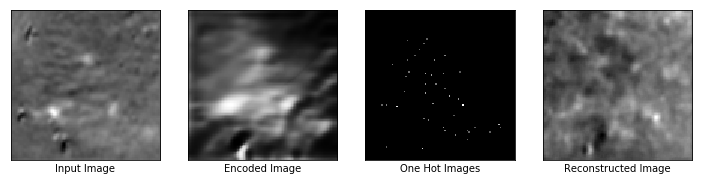

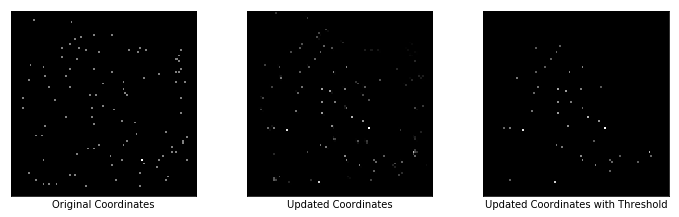

Reconstruction Loss: 0.01037681382149458
Regularizer Loss: 430711.34375, Total Loss: 430711.34375
Encoder Loss: 4.904460906982422
Max Similarity scores: 0.8915164470672607
Updated Coordinates: [[[0.5256151  0.78843707]]]



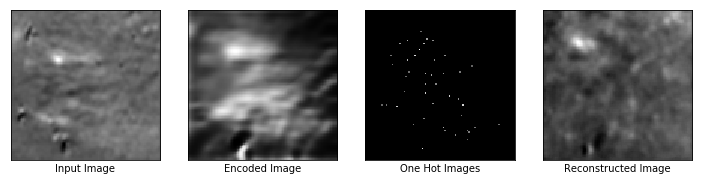

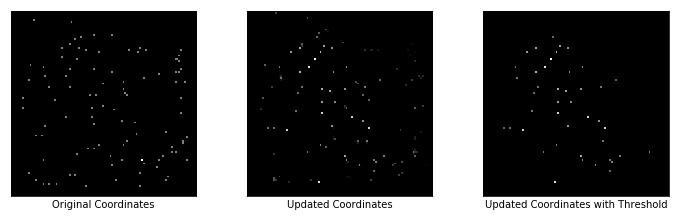

Reconstruction Loss: 0.011095843277871609
Regularizer Loss: 435610.0, Total Loss: 435610.0
Encoder Loss: 5.2756853103637695
Max Similarity scores: 0.7857386469841003
Updated Coordinates: [[[0.5253699  0.78765523]]]



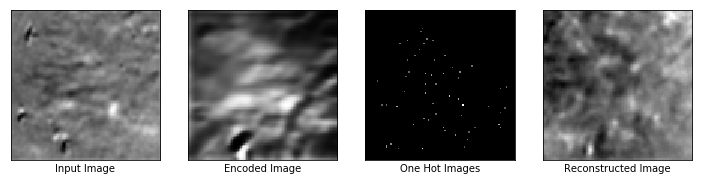

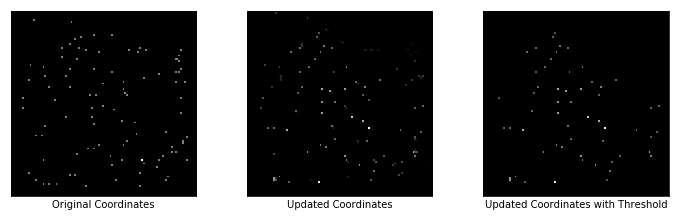

Reconstruction Loss: 0.014894530177116394
Regularizer Loss: 438944.25, Total Loss: 438944.25
Encoder Loss: 5.518184185028076
Max Similarity scores: 0.9686906933784485
Updated Coordinates: [[[0.5251471  0.78695077]]]



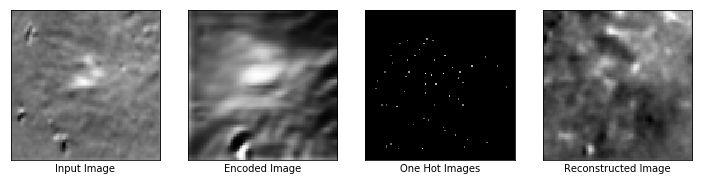

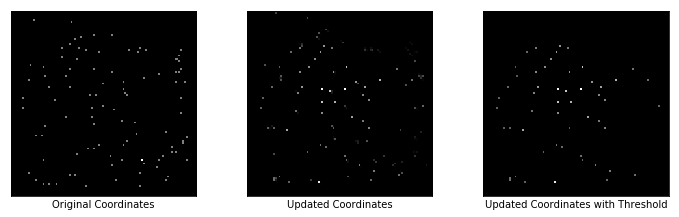

Reconstruction Loss: 0.013484404422342777
Regularizer Loss: 438053.90625, Total Loss: 438053.90625
Encoder Loss: 4.792046070098877
Max Similarity scores: 0.9544227719306946
Updated Coordinates: [[[0.5249433 0.7863151]]]



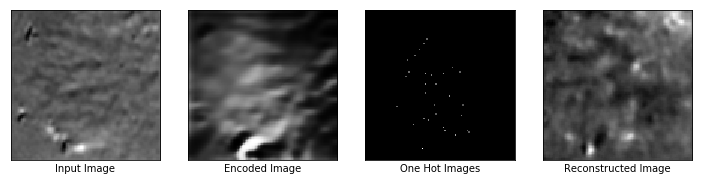

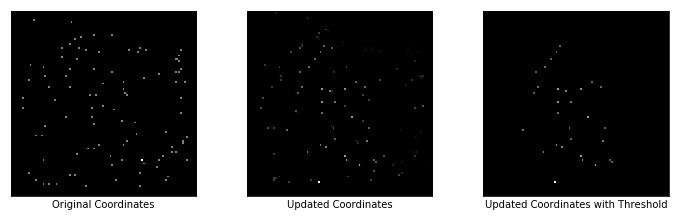

Reconstruction Loss: 0.011369411833584309
Regularizer Loss: 431927.28125, Total Loss: 431927.28125
Encoder Loss: 4.1891303062438965
Max Similarity scores: 0.976154088973999
Updated Coordinates: [[[0.52475816 0.7857422 ]]]



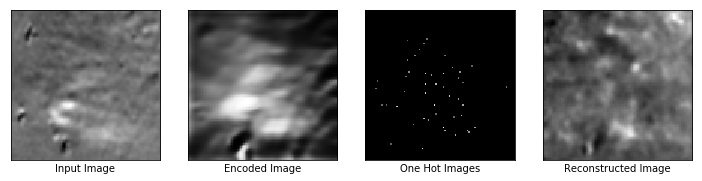

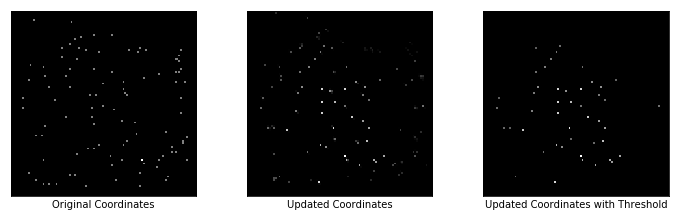

Reconstruction Loss: 0.012473967857658863
Regularizer Loss: 427484.375, Total Loss: 427484.375
Encoder Loss: 4.213955402374268
Max Similarity scores: 0.8620786666870117
Updated Coordinates: [[[0.52459455 0.7852302 ]]]



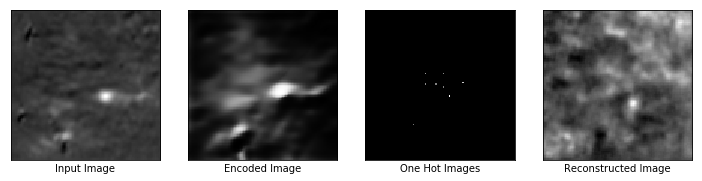

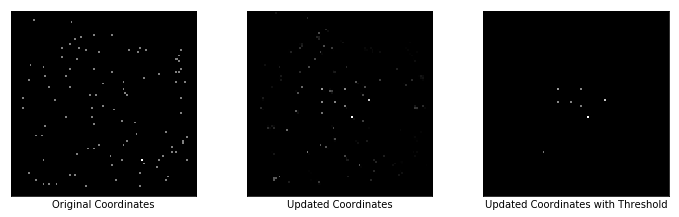

Reconstruction Loss: 0.014052377082407475
Regularizer Loss: 431056.59375, Total Loss: 431056.59375
Encoder Loss: 4.606431007385254
Max Similarity scores: 0.6930655241012573
Updated Coordinates: [[[0.5244411 0.7847683]]]



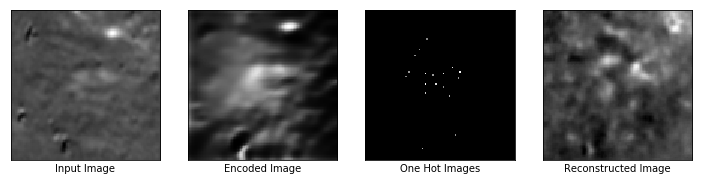

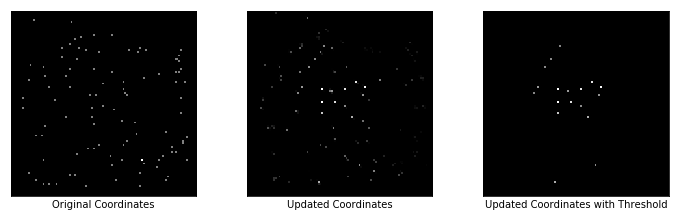

Reconstruction Loss: 0.011726935394108295
Regularizer Loss: 434864.6875, Total Loss: 434864.6875
Encoder Loss: 3.940235137939453
Max Similarity scores: 0.7213084697723389
Updated Coordinates: [[[0.5243031  0.78435546]]]



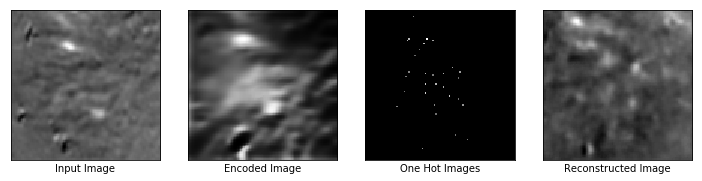

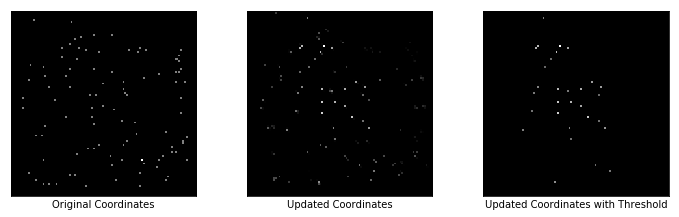

Reconstruction Loss: 0.012307940982282162
Regularizer Loss: 435790.6875, Total Loss: 435790.6875
Encoder Loss: 4.160594463348389
Max Similarity scores: 0.7624082565307617
Updated Coordinates: [[[0.52418053 0.7839894 ]]]



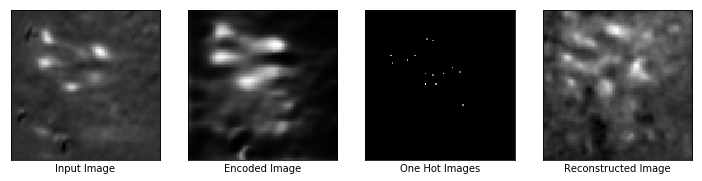

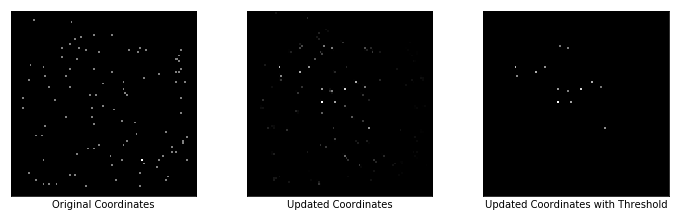

Reconstruction Loss: 0.008752323687076569
Regularizer Loss: 444176.78125, Total Loss: 444176.78125
Encoder Loss: 2.586838722229004
Max Similarity scores: 0.752748429775238
Updated Coordinates: [[[0.52406776 0.7837115 ]]]



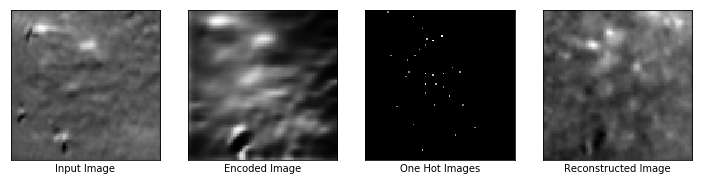

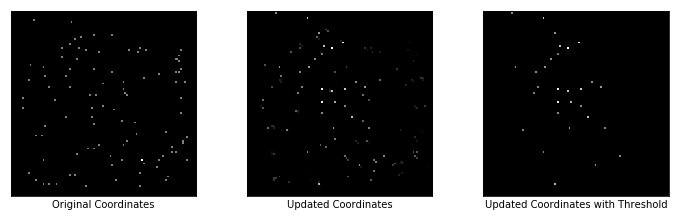

Reconstruction Loss: 0.012036646716296673
Regularizer Loss: 439238.78125, Total Loss: 439238.78125
Encoder Loss: 3.115926504135132
Max Similarity scores: 0.6879662871360779
Updated Coordinates: [[[0.5239642  0.78347427]]]



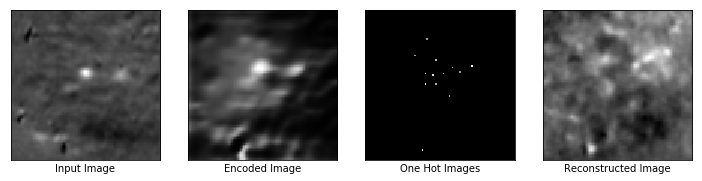

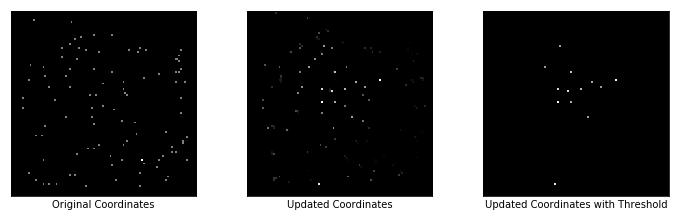

Reconstruction Loss: 0.009938191622495651
Regularizer Loss: 443247.96875, Total Loss: 443247.96875
Encoder Loss: 2.4010910987854004
Max Similarity scores: 0.5942657589912415
Updated Coordinates: [[[0.5238698  0.78327626]]]



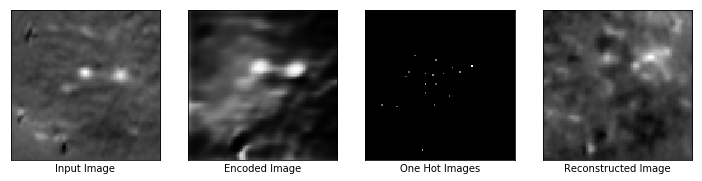

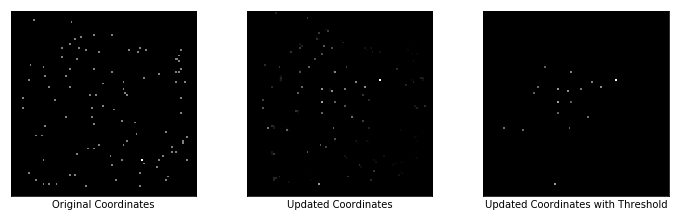

Reconstruction Loss: 0.013837317004799843
Regularizer Loss: 438310.25, Total Loss: 438310.25
Encoder Loss: 3.6455395221710205
Max Similarity scores: 0.8204423189163208
Updated Coordinates: [[[0.5237856 0.7830945]]]



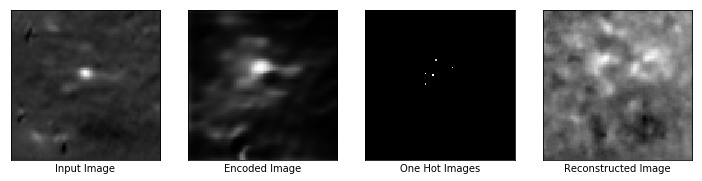

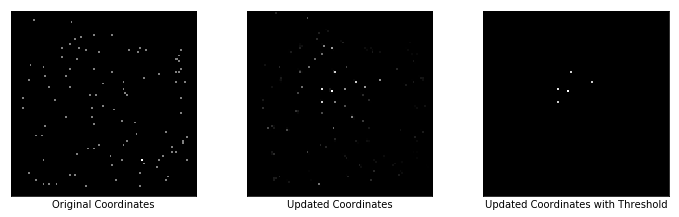

Reconstruction Loss: 0.010893085040152073
Regularizer Loss: 443794.0625, Total Loss: 443794.0625
Encoder Loss: 2.769716739654541
Max Similarity scores: 0.5246175527572632
Updated Coordinates: [[[0.5237099 0.7829455]]]



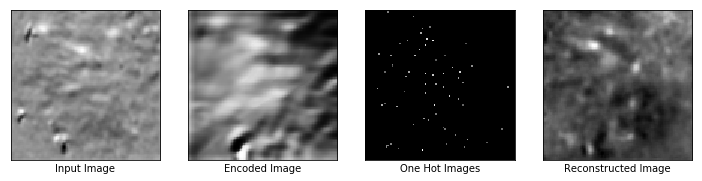

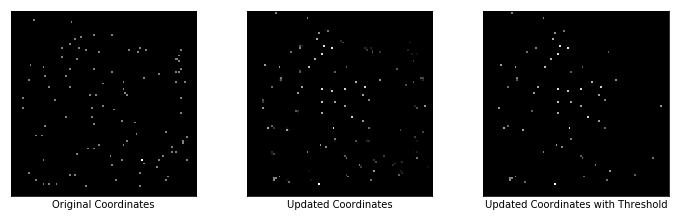

Reconstruction Loss: 0.012391394004225731
Regularizer Loss: 443333.96875, Total Loss: 443333.96875
Encoder Loss: 4.52426815032959
Max Similarity scores: 0.924366295337677
Updated Coordinates: [[[0.52363396 0.78282714]]]



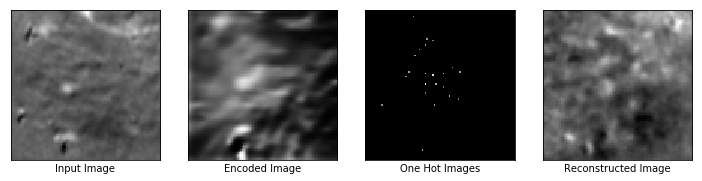

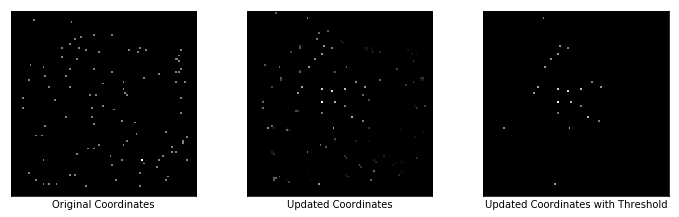

Reconstruction Loss: 0.01307959109544754
Regularizer Loss: 439729.40625, Total Loss: 439729.40625
Encoder Loss: 4.359843730926514
Max Similarity scores: 0.685839831829071
Updated Coordinates: [[[0.52356267 0.7827522 ]]]



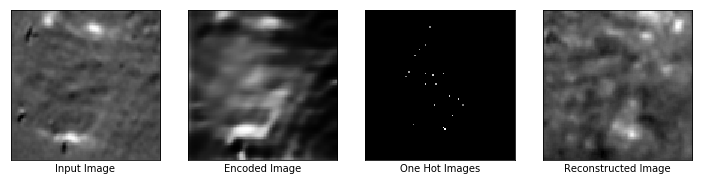

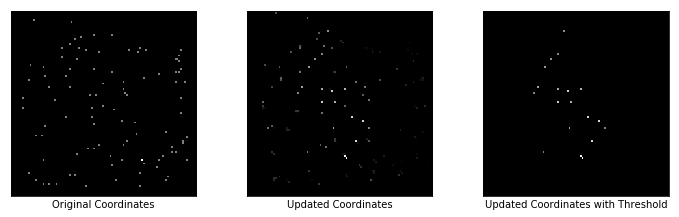

Reconstruction Loss: 0.01071105431765318
Regularizer Loss: 444011.6875, Total Loss: 444011.6875
Encoder Loss: 4.118866443634033
Max Similarity scores: 0.7071806192398071
Updated Coordinates: [[[0.52348626 0.7827387 ]]]



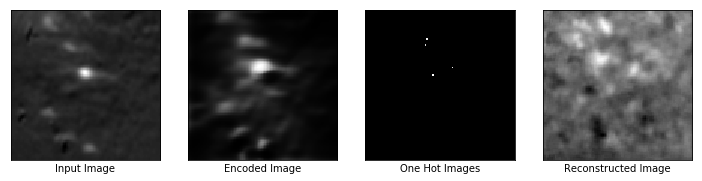

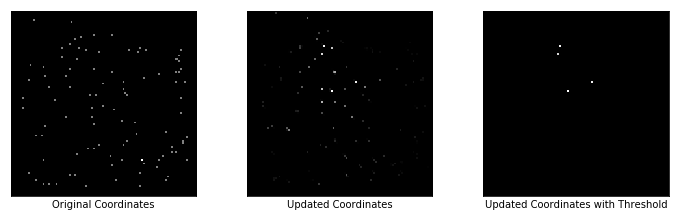

Reconstruction Loss: 0.007306127808988094
Regularizer Loss: 447892.1875, Total Loss: 447892.1875
Encoder Loss: 1.825893759727478
Max Similarity scores: 0.4949447214603424
Updated Coordinates: [[[0.52342206 0.78275776]]]



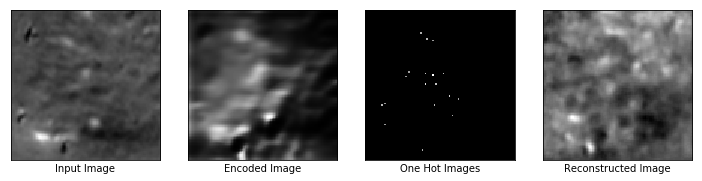

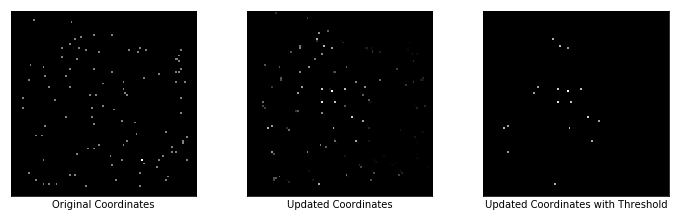

Reconstruction Loss: 0.011639604344964027
Regularizer Loss: 436787.875, Total Loss: 436787.875
Encoder Loss: 3.0293827056884766
Max Similarity scores: 0.6092613339424133
Updated Coordinates: [[[0.52335966 0.7827956 ]]]



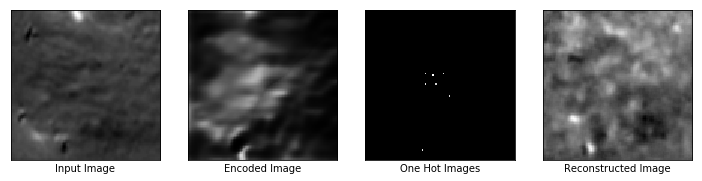

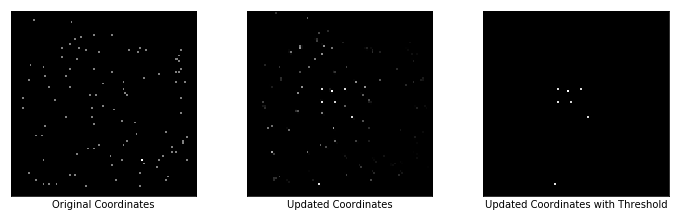

Reconstruction Loss: 0.010508543811738491
Regularizer Loss: 440063.6875, Total Loss: 440063.6875
Encoder Loss: 3.409374237060547
Max Similarity scores: 0.4770691990852356
Updated Coordinates: [[[0.5233168 0.7826854]]]



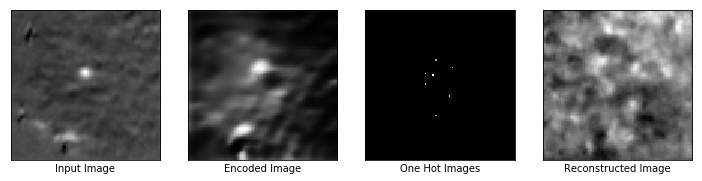

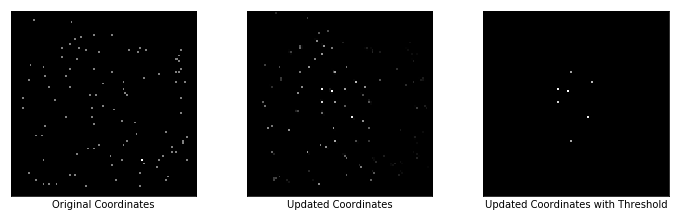

Reconstruction Loss: 0.00722105847671628
Regularizer Loss: 442680.65625, Total Loss: 442680.65625
Encoder Loss: 2.3635284900665283
Max Similarity scores: 0.5650761723518372
Updated Coordinates: [[[0.5232761 0.782584 ]]]



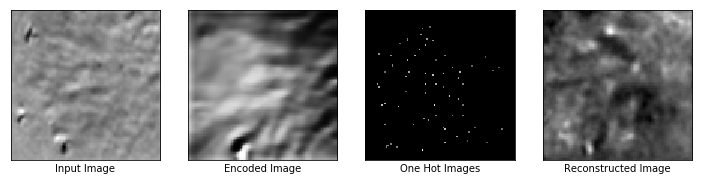

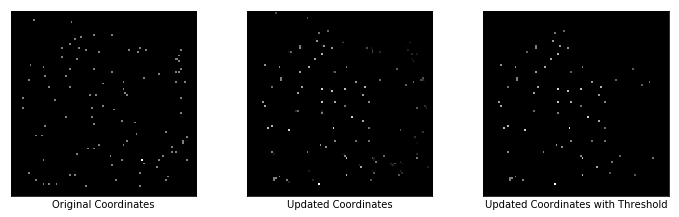

Reconstruction Loss: 0.012683836743235588
Regularizer Loss: 436512.46875, Total Loss: 436512.46875
Encoder Loss: 5.489663600921631
Max Similarity scores: 0.921989381313324
Updated Coordinates: [[[0.5232299 0.7825236]]]



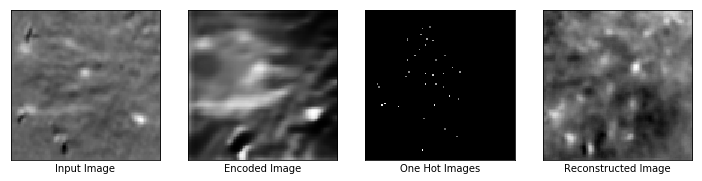

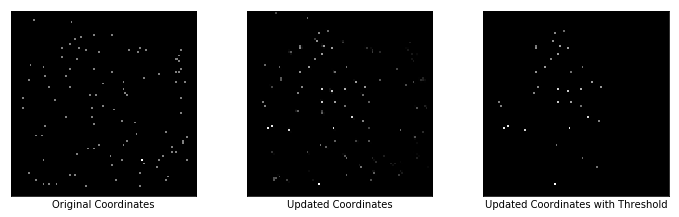

Reconstruction Loss: 0.011183769442141056
Regularizer Loss: 438847.6875, Total Loss: 438847.6875
Encoder Loss: 4.218654632568359
Max Similarity scores: 0.7320846915245056
Updated Coordinates: [[[0.52315754 0.7826133 ]]]



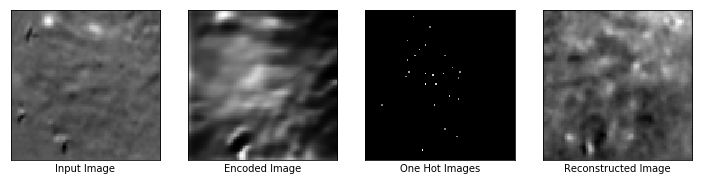

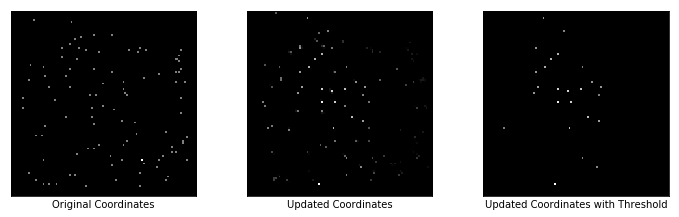

Reconstruction Loss: 0.01172725111246109
Regularizer Loss: 441893.78125, Total Loss: 441893.78125
Encoder Loss: 5.109737873077393
Max Similarity scores: 0.6573087573051453
Updated Coordinates: [[[0.5230955  0.78276193]]]



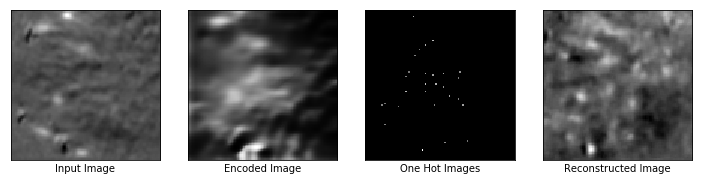

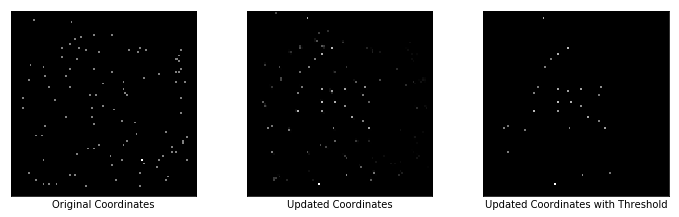

Reconstruction Loss: 0.00839110929518938
Regularizer Loss: 439803.28125, Total Loss: 439803.28125
Encoder Loss: 3.3562257289886475
Max Similarity scores: 0.6930524110794067
Updated Coordinates: [[[0.5230359 0.7829466]]]



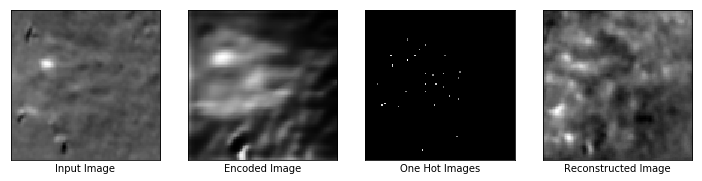

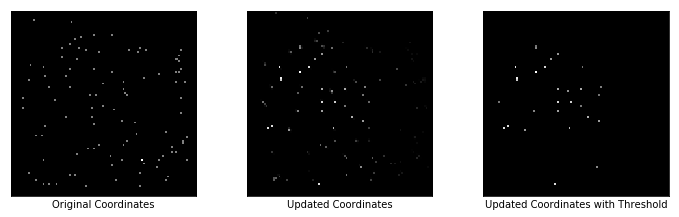

Reconstruction Loss: 0.008421544916927814
Regularizer Loss: 437949.6875, Total Loss: 437949.6875
Encoder Loss: 4.113451957702637
Max Similarity scores: 0.6900689601898193
Updated Coordinates: [[[0.52297777 0.78313553]]]



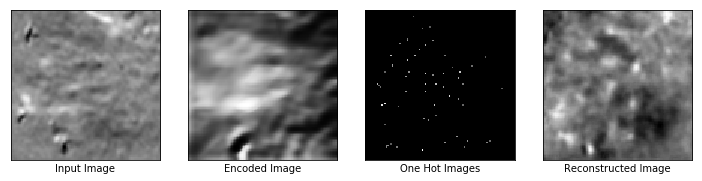

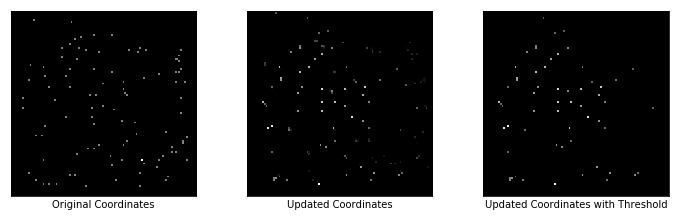

Reconstruction Loss: 0.011766372248530388
Regularizer Loss: 439835.5, Total Loss: 439835.5
Encoder Loss: 4.818363666534424
Max Similarity scores: 0.8620362877845764
Updated Coordinates: [[[0.52293086 0.78333545]]]



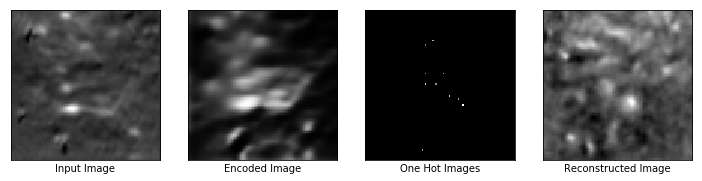

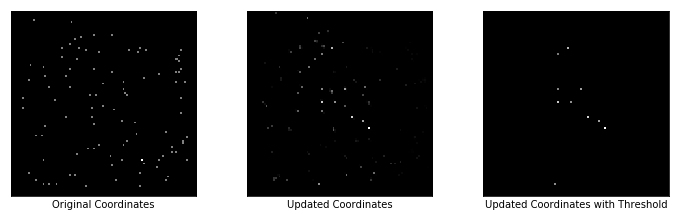

Reconstruction Loss: 0.010035795159637928
Regularizer Loss: 434740.5, Total Loss: 434740.5
Encoder Loss: 3.0963406562805176
Max Similarity scores: 0.6603158116340637
Updated Coordinates: [[[0.5228894 0.7835454]]]



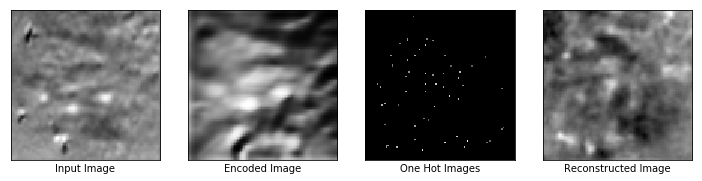

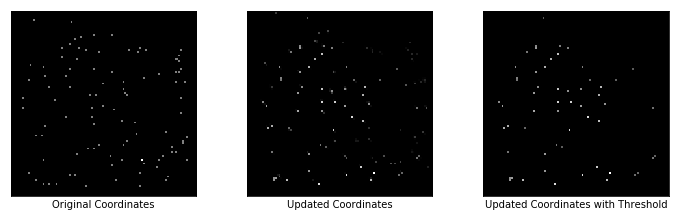

Reconstruction Loss: 0.011577081866562366
Regularizer Loss: 434897.75, Total Loss: 434897.75
Encoder Loss: 4.161685943603516
Max Similarity scores: 0.8655384182929993
Updated Coordinates: [[[0.5228513  0.78374636]]]



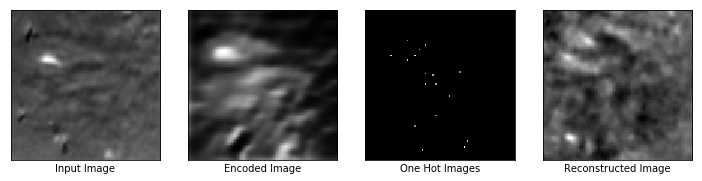

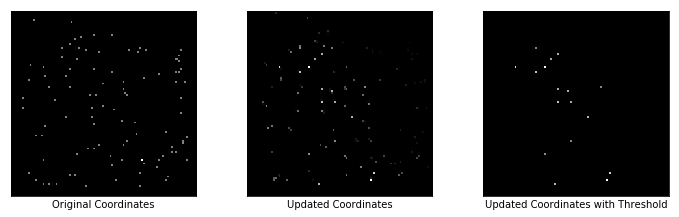

Reconstruction Loss: 0.006837443448603153
Regularizer Loss: 435618.40625, Total Loss: 435618.40625
Encoder Loss: 2.5943610668182373
Max Similarity scores: 0.7278714776039124
Updated Coordinates: [[[0.52281785 0.7839359 ]]]



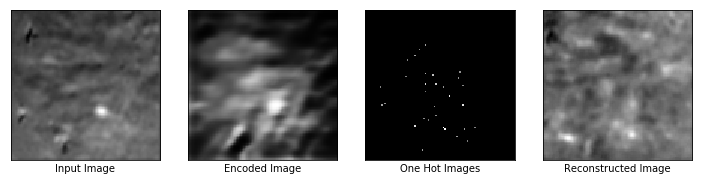

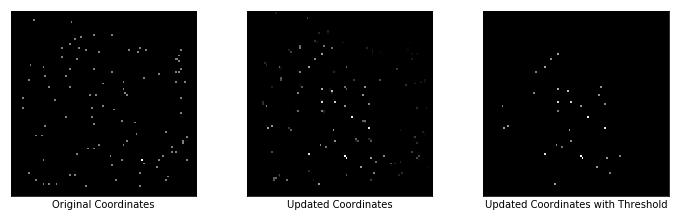

Reconstruction Loss: 0.012640942819416523
Regularizer Loss: 425869.25, Total Loss: 425869.25
Encoder Loss: 5.4712629318237305
Max Similarity scores: 0.6970080733299255
Updated Coordinates: [[[0.52278763 0.7841056 ]]]



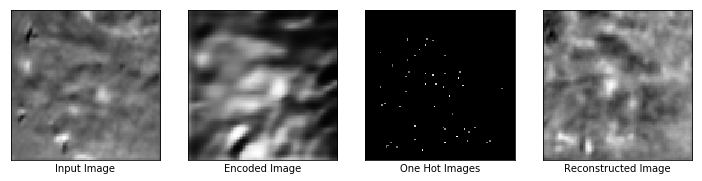

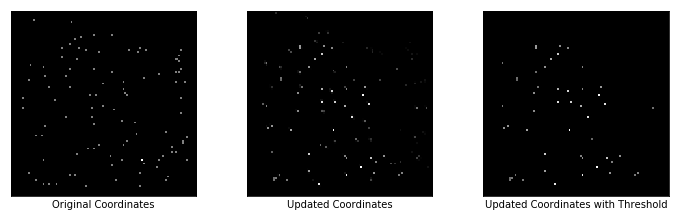

Reconstruction Loss: 0.011196932755410671
Regularizer Loss: 427003.71875, Total Loss: 427003.71875
Encoder Loss: 4.174043655395508
Max Similarity scores: 0.7874505519866943
Updated Coordinates: [[[0.52276  0.784262]]]



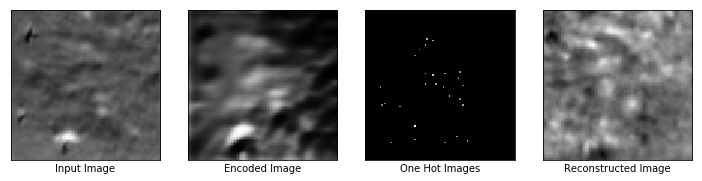

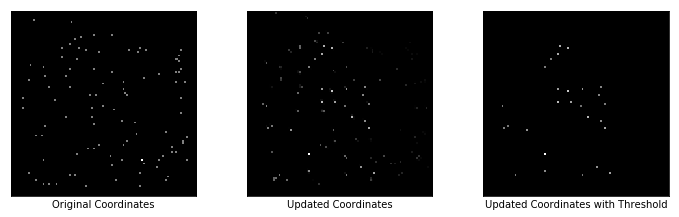

Reconstruction Loss: 0.01100511197000742
Regularizer Loss: 433550.0, Total Loss: 433550.0
Encoder Loss: 3.980742931365967
Max Similarity scores: 0.6963150501251221
Updated Coordinates: [[[0.5227361  0.78441197]]]



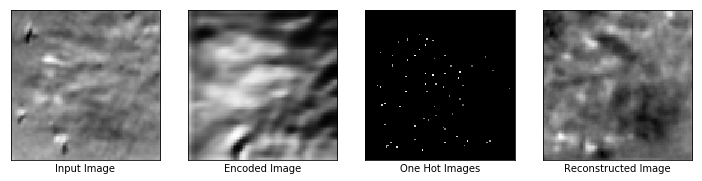

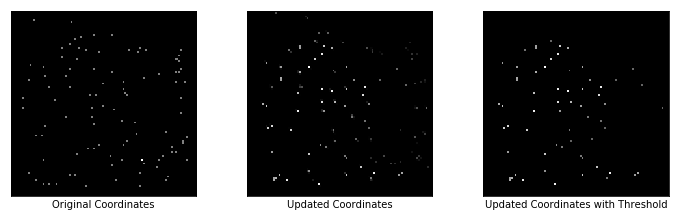

Reconstruction Loss: 0.011102032847702503
Regularizer Loss: 436261.5625, Total Loss: 436261.5625
Encoder Loss: 4.736126899719238
Max Similarity scores: 0.8539784550666809
Updated Coordinates: [[[0.52271616 0.7845504 ]]]



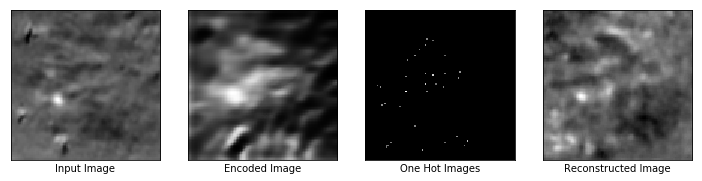

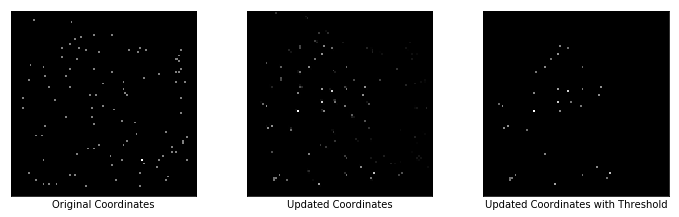

Reconstruction Loss: 0.008276402950286865
Regularizer Loss: 437465.3125, Total Loss: 437465.3125
Encoder Loss: 3.6199772357940674
Max Similarity scores: 0.8228972554206848
Updated Coordinates: [[[0.5227173 0.7846708]]]



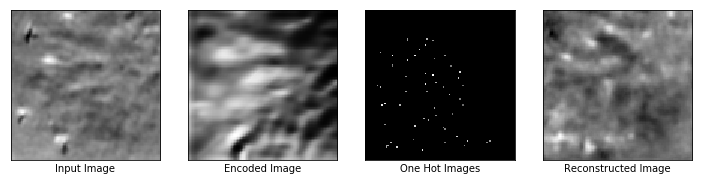

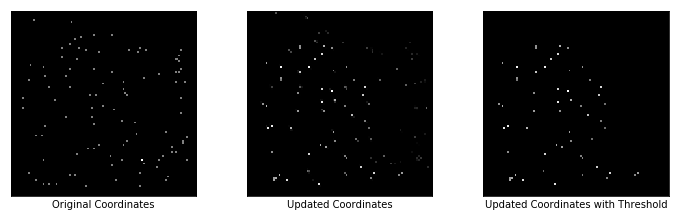

Reconstruction Loss: 0.011041847057640553
Regularizer Loss: 434465.5, Total Loss: 434465.5
Encoder Loss: 5.23668909072876
Max Similarity scores: 0.8142768740653992
Updated Coordinates: [[[0.52273786 0.7847727 ]]]



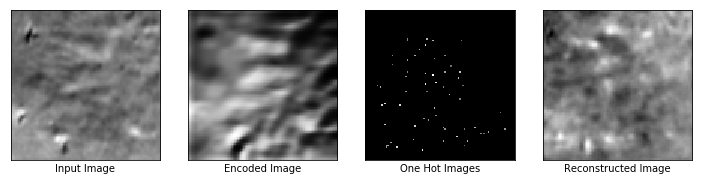

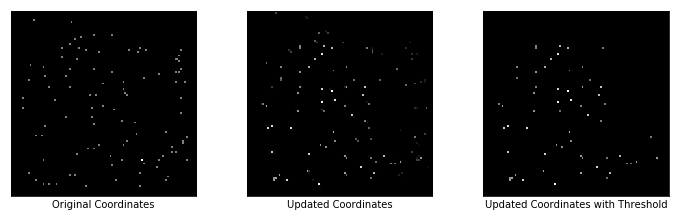

Reconstruction Loss: 0.011159779503941536
Regularizer Loss: 434868.625, Total Loss: 434868.625
Encoder Loss: 5.1252031326293945
Max Similarity scores: 0.8152705430984497
Updated Coordinates: [[[0.5227772  0.78485703]]]



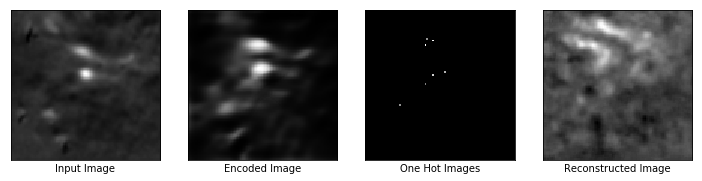

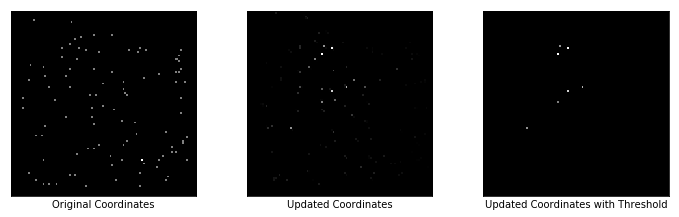

Reconstruction Loss: 0.008625728078186512
Regularizer Loss: 443755.1875, Total Loss: 443755.1875
Encoder Loss: 2.126399278640747
Max Similarity scores: 0.6435992121696472
Updated Coordinates: [[[0.52282524 0.78492904]]]



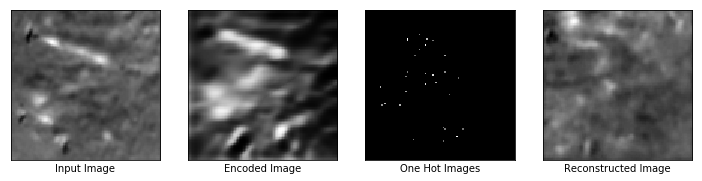

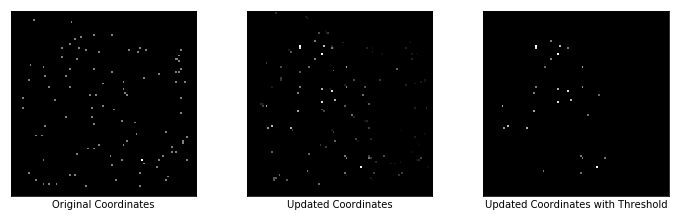

Reconstruction Loss: 0.010046858340501785
Regularizer Loss: 437224.875, Total Loss: 437224.875
Encoder Loss: 2.9934215545654297
Max Similarity scores: 0.7679654359817505
Updated Coordinates: [[[0.52287555 0.7849911 ]]]



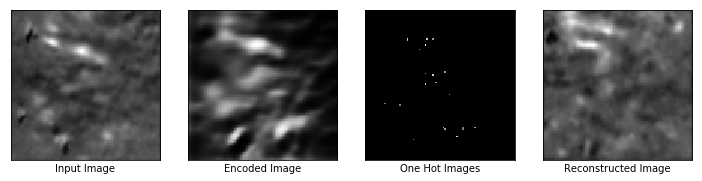

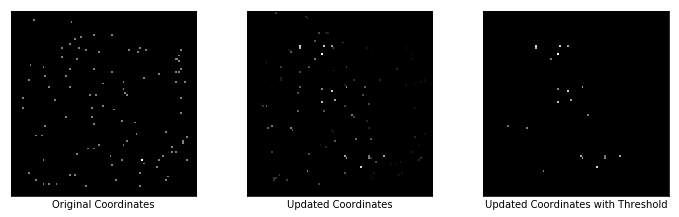

Reconstruction Loss: 0.010122206062078476
Regularizer Loss: 437825.65625, Total Loss: 437825.65625
Encoder Loss: 3.420600414276123
Max Similarity scores: 0.8166323304176331
Updated Coordinates: [[[0.52293   0.7850491]]]



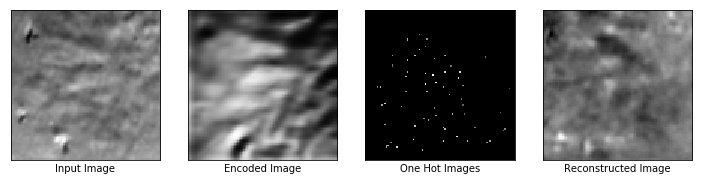

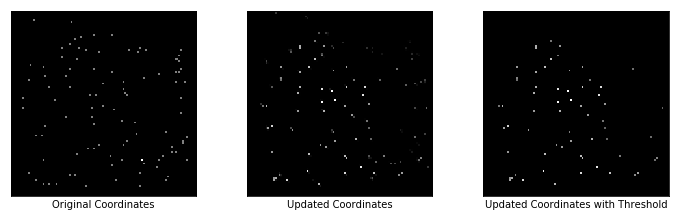

Reconstruction Loss: 0.012735010124742985
Regularizer Loss: 429894.0, Total Loss: 429894.0
Encoder Loss: 6.281842231750488
Max Similarity scores: 0.8598238825798035
Updated Coordinates: [[[0.5229837  0.78510076]]]



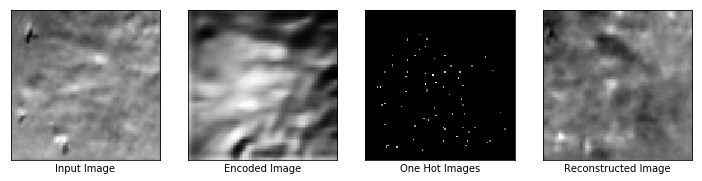

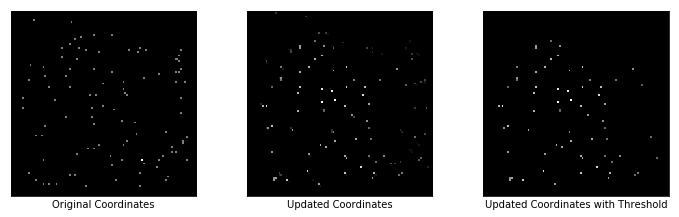

Reconstruction Loss: 0.011880031786859035
Regularizer Loss: 429264.59375, Total Loss: 429264.59375
Encoder Loss: 6.108194351196289
Max Similarity scores: 0.8828520178794861
Updated Coordinates: [[[0.52303225 0.78515095]]]



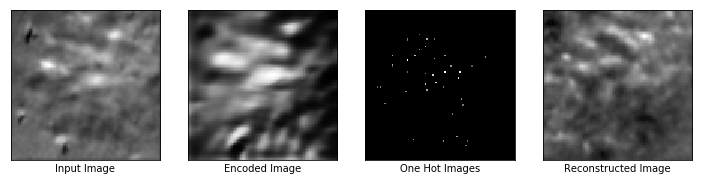

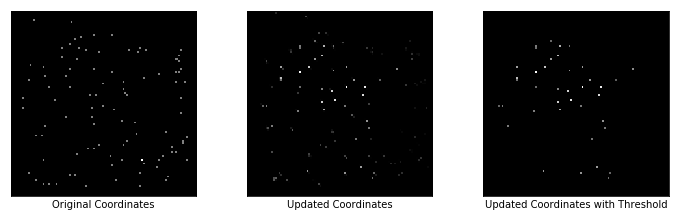

Reconstruction Loss: 0.01202730555087328
Regularizer Loss: 435963.5, Total Loss: 435963.5
Encoder Loss: 4.824146270751953
Max Similarity scores: 0.8454887866973877
Updated Coordinates: [[[0.5230803 0.7851991]]]



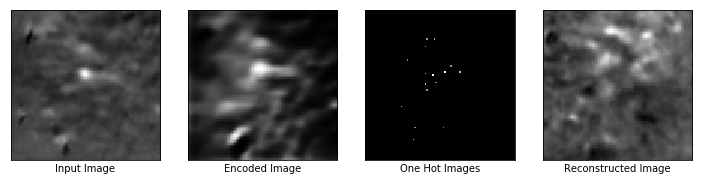

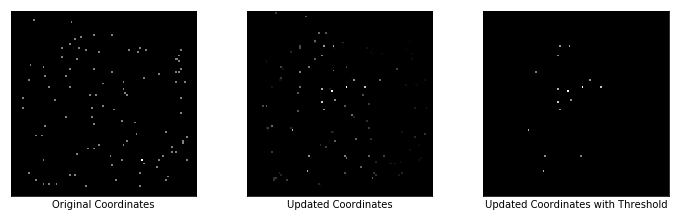

Reconstruction Loss: 0.01188454870134592
Regularizer Loss: 438169.96875, Total Loss: 438169.96875
Encoder Loss: 3.450291395187378
Max Similarity scores: 0.6635810732841492
Updated Coordinates: [[[0.5231393 0.7852398]]]



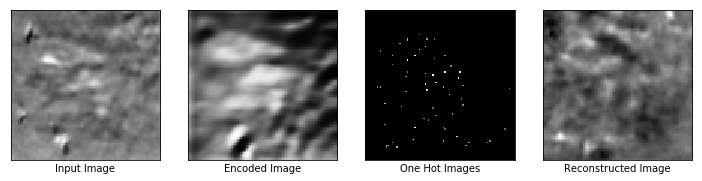

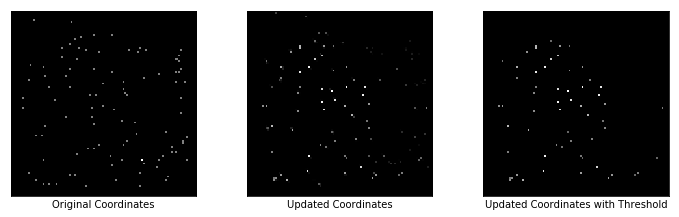

Reconstruction Loss: 0.014464681968092918
Regularizer Loss: 431215.40625, Total Loss: 431215.40625
Encoder Loss: 6.002589225769043
Max Similarity scores: 0.8623563647270203
Updated Coordinates: [[[0.5231945  0.78527653]]]



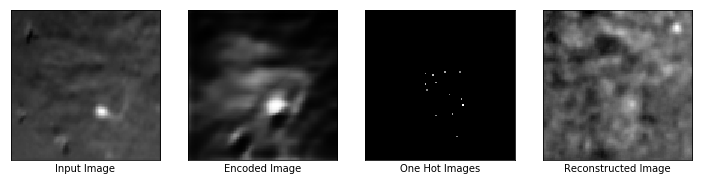

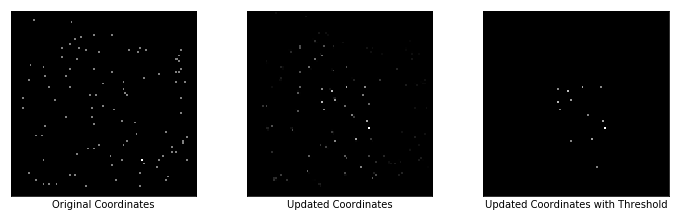

Reconstruction Loss: 0.010496011935174465
Regularizer Loss: 428078.25, Total Loss: 428078.25
Encoder Loss: 4.619253158569336
Max Similarity scores: 0.6099411249160767
Updated Coordinates: [[[0.52324224 0.7853143 ]]]



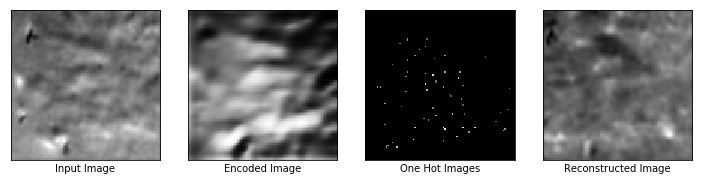

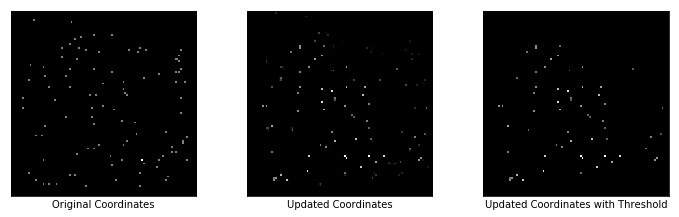

Reconstruction Loss: 0.012664029374718666
Regularizer Loss: 426577.8125, Total Loss: 426577.8125
Encoder Loss: 5.314563751220703
Max Similarity scores: 0.9208118915557861
Updated Coordinates: [[[0.5232787 0.7853527]]]



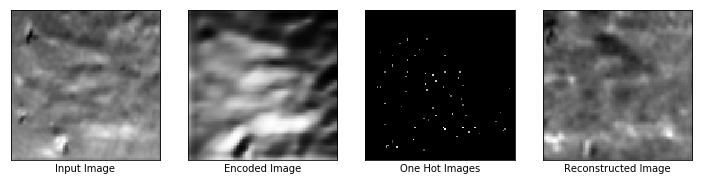

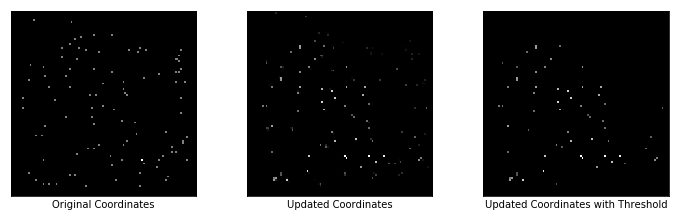

Reconstruction Loss: 0.012532941065728664
Regularizer Loss: 425703.40625, Total Loss: 425703.40625
Encoder Loss: 4.777846813201904
Max Similarity scores: 0.9437204003334045
Updated Coordinates: [[[0.52330804 0.7853933 ]]]



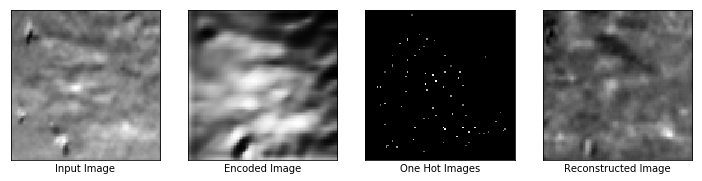

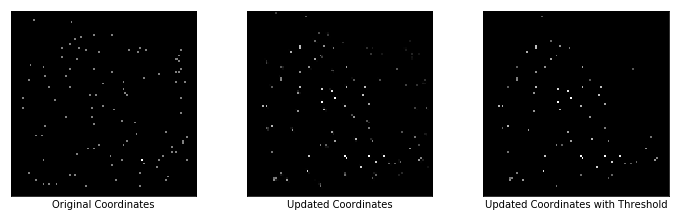

Reconstruction Loss: 0.009698654524981976
Regularizer Loss: 430365.0, Total Loss: 430365.0
Encoder Loss: 3.929591417312622
Max Similarity scores: 0.9261224865913391
Updated Coordinates: [[[0.52334577 0.7854344 ]]]



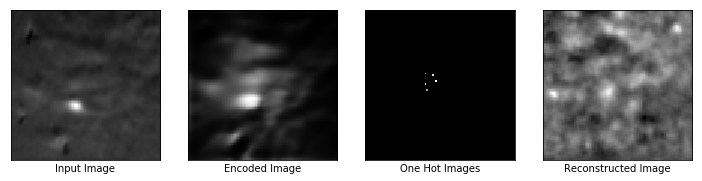

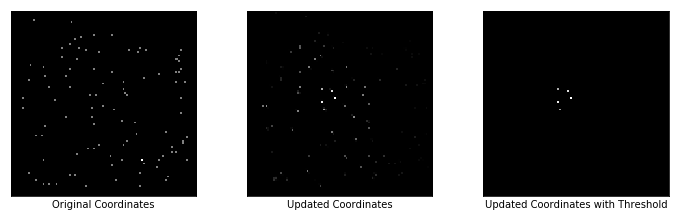

Reconstruction Loss: 0.007323371712118387
Regularizer Loss: 430472.09375, Total Loss: 430472.09375
Encoder Loss: 3.2258660793304443
Max Similarity scores: 0.5281115770339966
Updated Coordinates: [[[0.52338076 0.78547615]]]



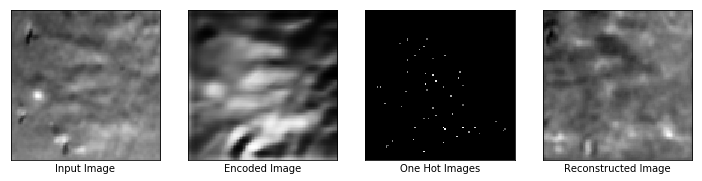

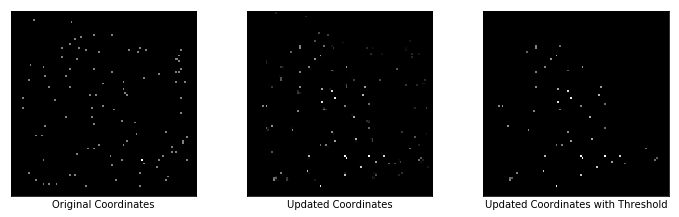

Reconstruction Loss: 0.006809938699007034
Regularizer Loss: 432269.8125, Total Loss: 432269.8125
Encoder Loss: 3.0085957050323486
Max Similarity scores: 0.869567334651947
Updated Coordinates: [[[0.5234136  0.78551465]]]



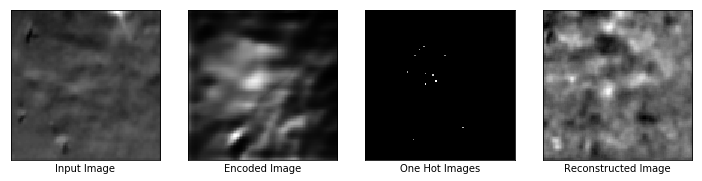

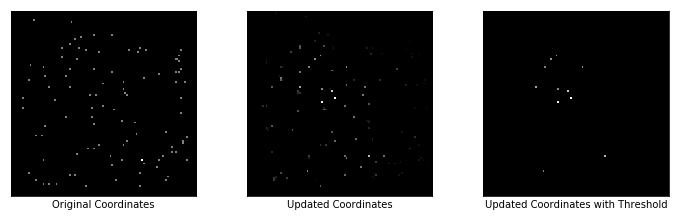

Reconstruction Loss: 0.0113533241674304
Regularizer Loss: 428468.6875, Total Loss: 428468.6875
Encoder Loss: 4.915462493896484
Max Similarity scores: 0.6457856297492981
Updated Coordinates: [[[0.5234384  0.78555137]]]



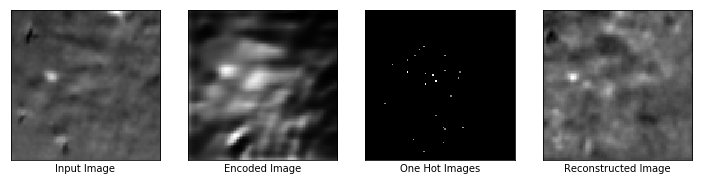

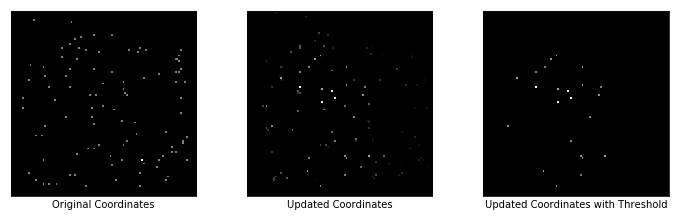

Reconstruction Loss: 0.006887932773679495
Regularizer Loss: 433354.5, Total Loss: 433354.5
Encoder Loss: 3.2472574710845947
Max Similarity scores: 0.6694627404212952
Updated Coordinates: [[[0.5234689  0.78558856]]]



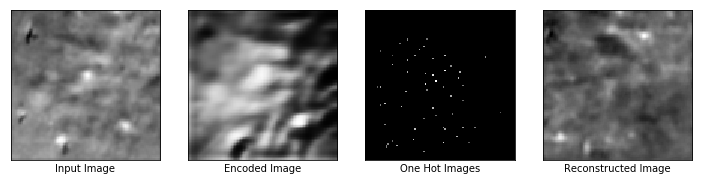

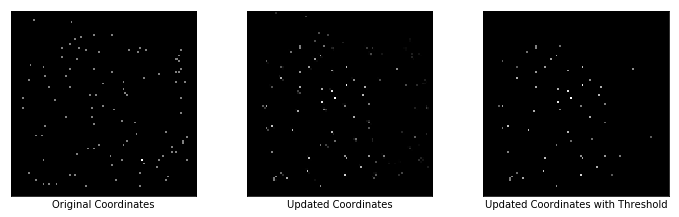

Reconstruction Loss: 0.011786619201302528
Regularizer Loss: 430760.84375, Total Loss: 430760.84375
Encoder Loss: 5.15187406539917
Max Similarity scores: 0.8887590765953064
Updated Coordinates: [[[0.5235016 0.7856211]]]



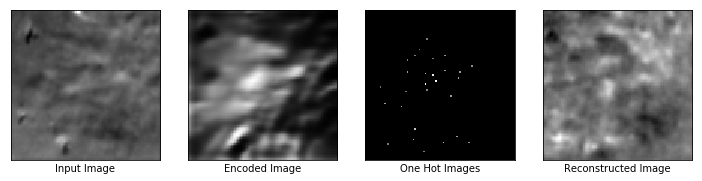

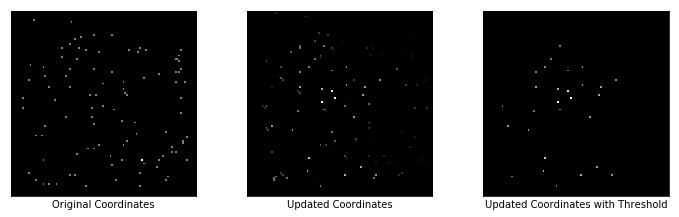

Reconstruction Loss: 0.009119371883571148
Regularizer Loss: 437012.21875, Total Loss: 437012.21875
Encoder Loss: 3.5426859855651855
Max Similarity scores: 0.7229445576667786
Updated Coordinates: [[[0.52353823 0.7856508 ]]]



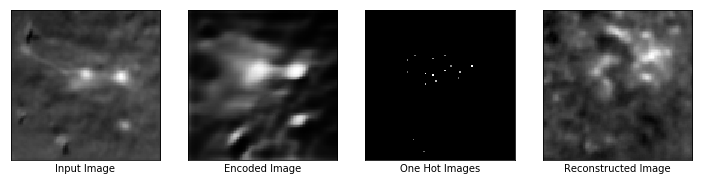

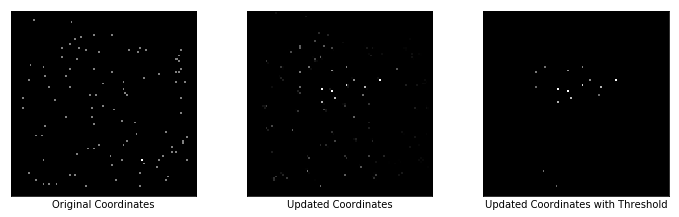

Reconstruction Loss: 0.010779260657727718
Regularizer Loss: 435107.75, Total Loss: 435107.75
Encoder Loss: 3.6755621433258057
Max Similarity scores: 0.8265764713287354
Updated Coordinates: [[[0.5235738 0.7856759]]]



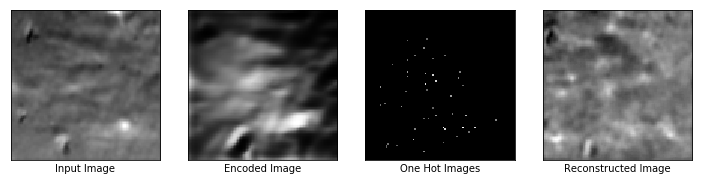

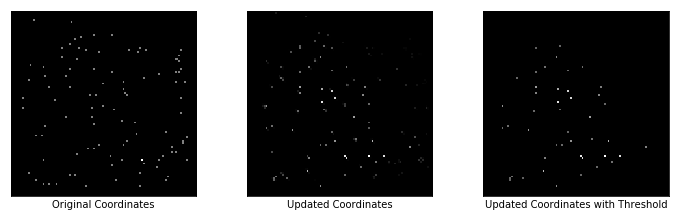

Reconstruction Loss: 0.007968728430569172
Regularizer Loss: 429538.03125, Total Loss: 429538.03125
Encoder Loss: 3.642369508743286
Max Similarity scores: 0.8258273601531982
Updated Coordinates: [[[0.5236086  0.78569645]]]



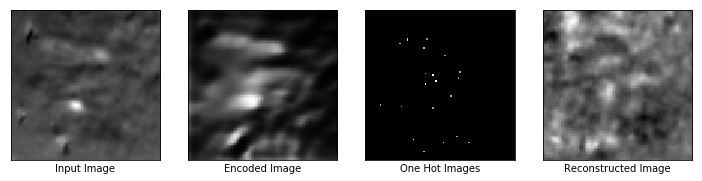

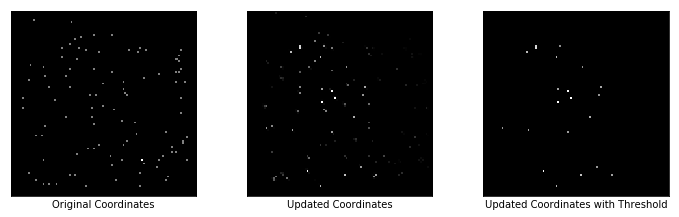

Reconstruction Loss: 0.007023881655186415
Regularizer Loss: 434232.09375, Total Loss: 434232.09375
Encoder Loss: 2.5647711753845215
Max Similarity scores: 0.6347743272781372
Updated Coordinates: [[[0.5236394  0.78571653]]]



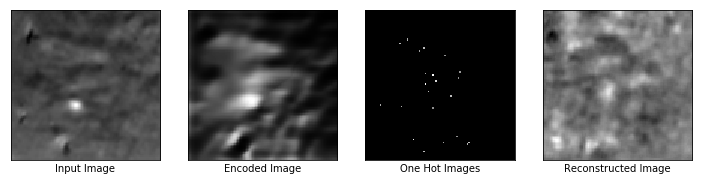

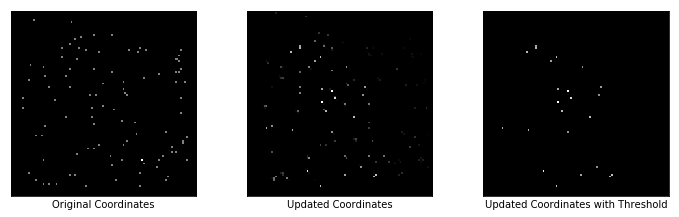

Reconstruction Loss: 0.007148716598749161
Regularizer Loss: 434144.375, Total Loss: 434144.375
Encoder Loss: 2.8365235328674316
Max Similarity scores: 0.6296750903129578
Updated Coordinates: [[[0.52366483 0.78573537]]]



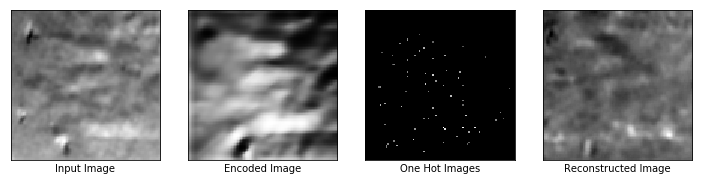

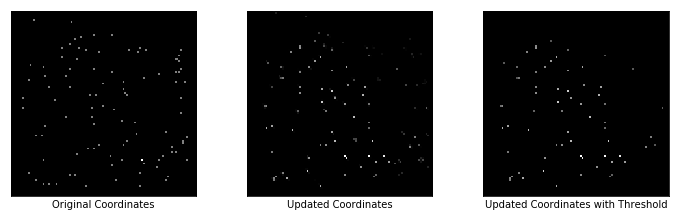

Reconstruction Loss: 0.011923424899578094
Regularizer Loss: 426317.46875, Total Loss: 426317.46875
Encoder Loss: 6.110593795776367
Max Similarity scores: 0.9475411176681519
Updated Coordinates: [[[0.5236789  0.78574246]]]



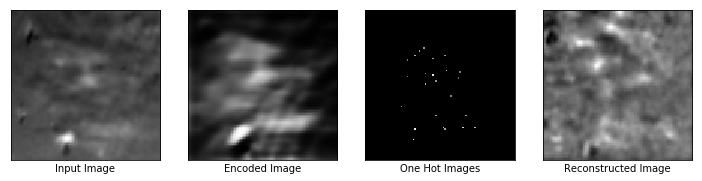

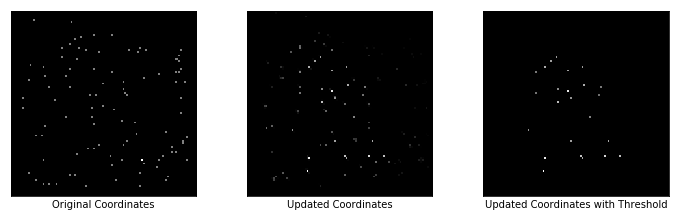

Reconstruction Loss: 0.010618646629154682
Regularizer Loss: 424366.6875, Total Loss: 424366.6875
Encoder Loss: 4.453609466552734
Max Similarity scores: 0.8291552662849426
Updated Coordinates: [[[0.5236898 0.7857467]]]



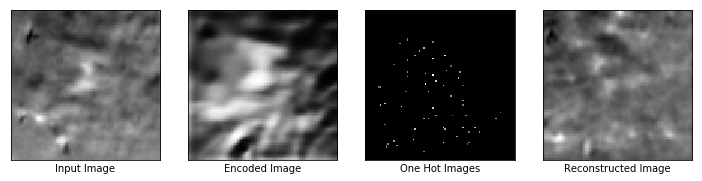

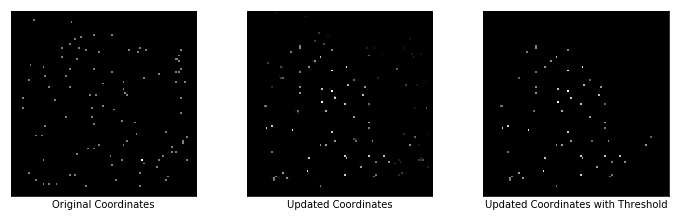

Reconstruction Loss: 0.014003152027726173
Regularizer Loss: 426407.125, Total Loss: 426407.125
Encoder Loss: 5.110541343688965
Max Similarity scores: 0.9350902438163757
Updated Coordinates: [[[0.52370304 0.7857535 ]]]



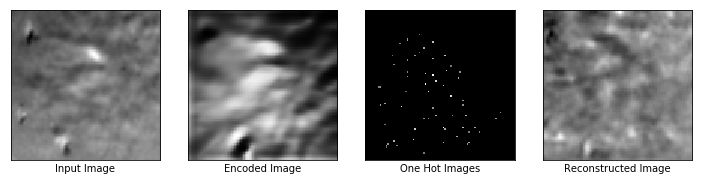

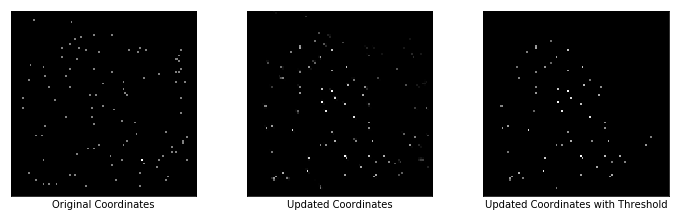

Reconstruction Loss: 0.014480918645858765
Regularizer Loss: 425206.78125, Total Loss: 425206.78125
Encoder Loss: 5.092089653015137
Max Similarity scores: 0.8414618968963623
Updated Coordinates: [[[0.5237201 0.7857619]]]



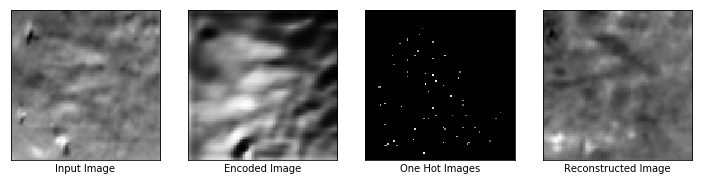

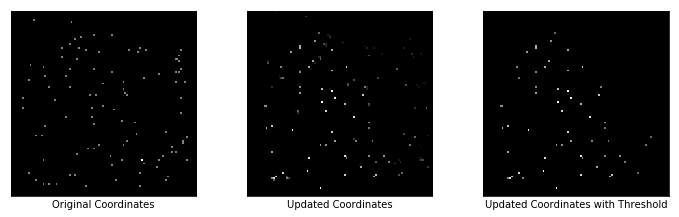

Reconstruction Loss: 0.014730865135788918
Regularizer Loss: 426191.3125, Total Loss: 426191.3125
Encoder Loss: 5.98585319519043
Max Similarity scores: 0.9015386700630188
Updated Coordinates: [[[0.52374    0.78577536]]]



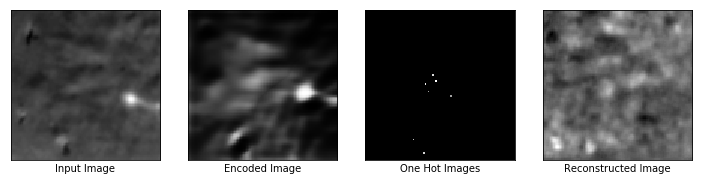

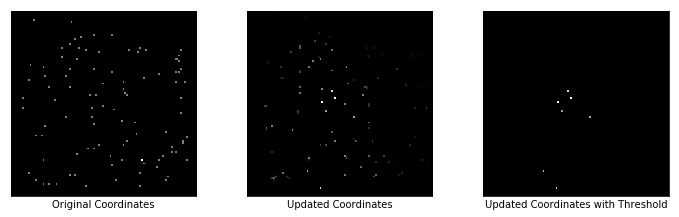

Reconstruction Loss: 0.007515010889619589
Regularizer Loss: 432004.6875, Total Loss: 432004.6875
Encoder Loss: 2.7449028491973877
Max Similarity scores: 0.5884686708450317
Updated Coordinates: [[[0.5237604 0.7857913]]]



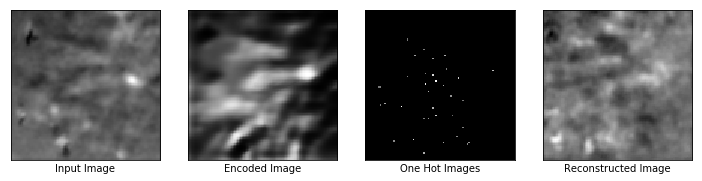

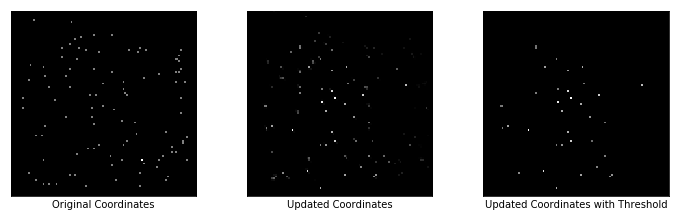

Reconstruction Loss: 0.012471048161387444
Regularizer Loss: 431181.9375, Total Loss: 431181.9375
Encoder Loss: 4.9083685874938965
Max Similarity scores: 0.7478352189064026
Updated Coordinates: [[[0.52377737 0.78579867]]]



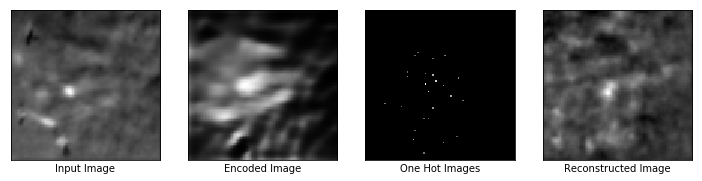

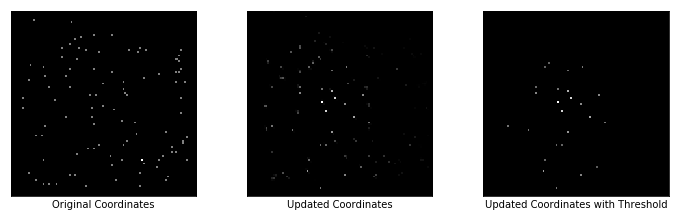

Reconstruction Loss: 0.010382245294749737
Regularizer Loss: 430893.1875, Total Loss: 430893.1875
Encoder Loss: 4.8728437423706055
Max Similarity scores: 0.9082018136978149
Updated Coordinates: [[[0.52379465 0.78580195]]]



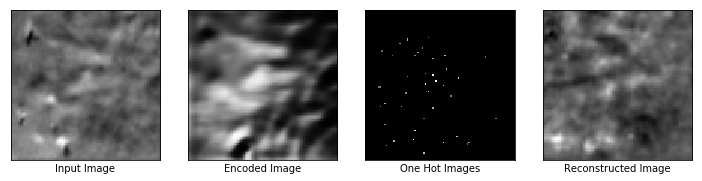

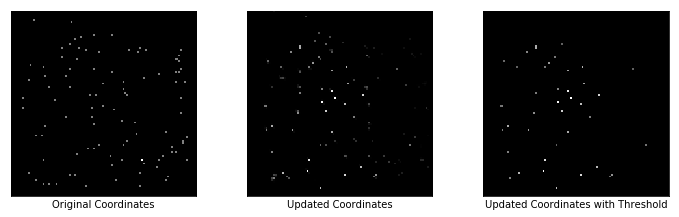

Reconstruction Loss: 0.01060421485453844
Regularizer Loss: 432303.78125, Total Loss: 432303.78125
Encoder Loss: 4.936323642730713
Max Similarity scores: 0.8707423210144043
Updated Coordinates: [[[0.52381164 0.7858092 ]]]



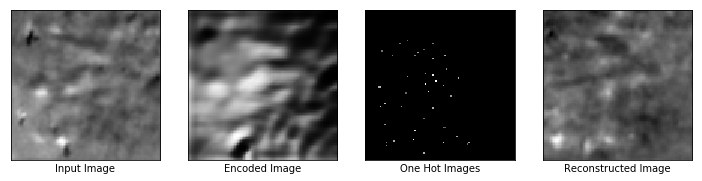

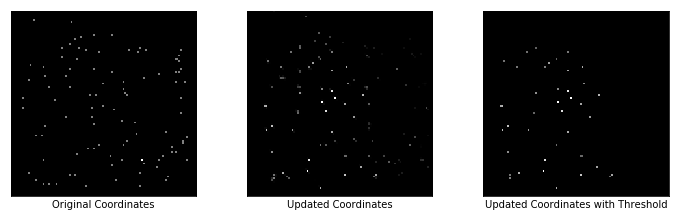

Reconstruction Loss: 0.010251148603856564
Regularizer Loss: 431538.9375, Total Loss: 431538.9375
Encoder Loss: 5.153880596160889
Max Similarity scores: 0.8685922026634216
Updated Coordinates: [[[0.523828 0.785816]]]



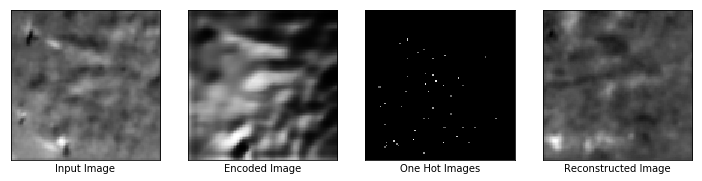

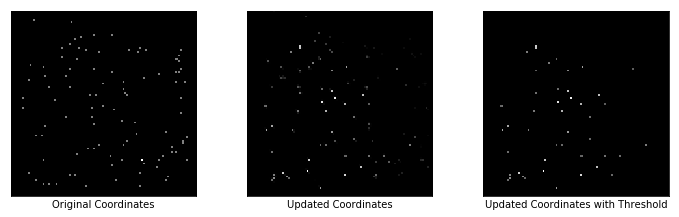

Reconstruction Loss: 0.012228869833052158
Regularizer Loss: 427788.78125, Total Loss: 427788.78125
Encoder Loss: 5.271569728851318
Max Similarity scores: 0.9164251089096069
Updated Coordinates: [[[0.52384377 0.7858258 ]]]



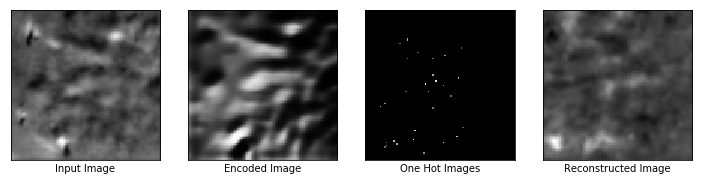

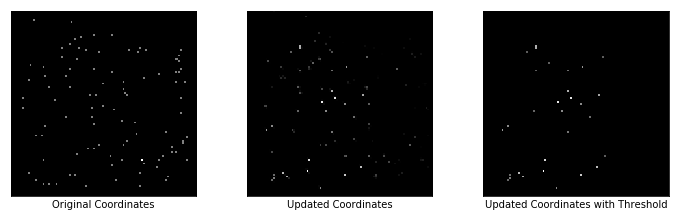

Reconstruction Loss: 0.00995076633989811
Regularizer Loss: 431217.65625, Total Loss: 431217.65625
Encoder Loss: 4.125435829162598
Max Similarity scores: 0.9329506754875183
Updated Coordinates: [[[0.5238623 0.7858432]]]



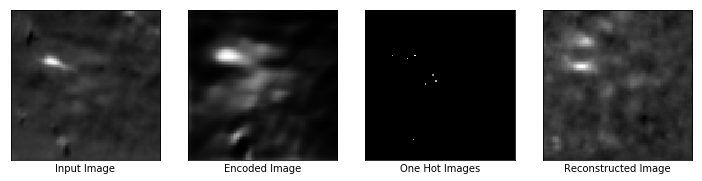

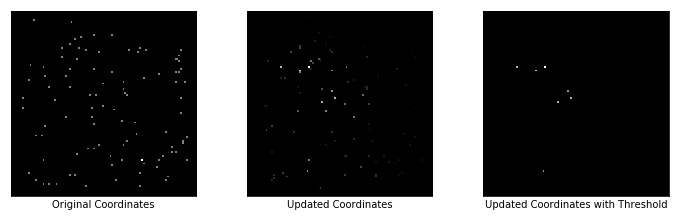

Reconstruction Loss: 0.007616427727043629
Regularizer Loss: 435742.5625, Total Loss: 435742.5625
Encoder Loss: 2.9731709957122803
Max Similarity scores: 0.7872687578201294
Updated Coordinates: [[[0.5238814 0.785858 ]]]



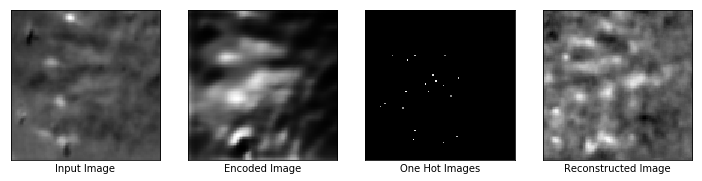

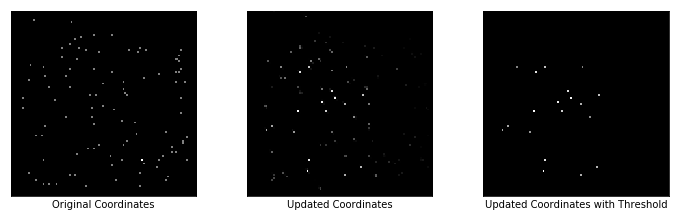

Reconstruction Loss: 0.009409378282725811
Regularizer Loss: 431665.5625, Total Loss: 431665.5625
Encoder Loss: 4.304107189178467
Max Similarity scores: 0.7218369245529175
Updated Coordinates: [[[0.5238975 0.78587  ]]]



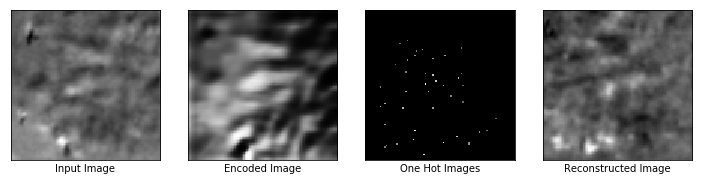

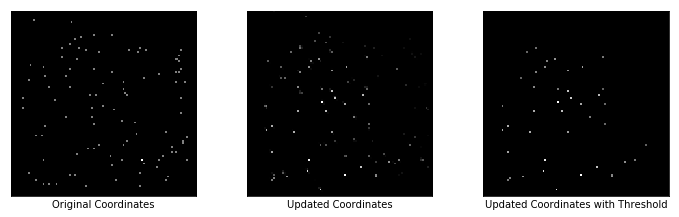

Reconstruction Loss: 0.00963678676635027
Regularizer Loss: 428070.1875, Total Loss: 428070.1875
Encoder Loss: 5.113100051879883
Max Similarity scores: 0.8890368938446045
Updated Coordinates: [[[0.5239106  0.78587914]]]



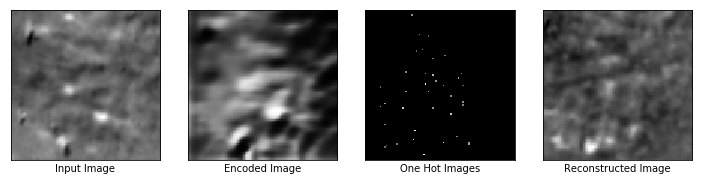

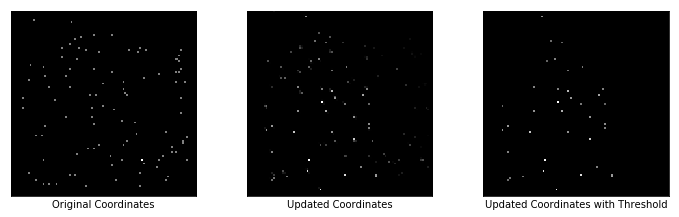

Reconstruction Loss: 0.008722673170268536
Regularizer Loss: 439026.1875, Total Loss: 439026.1875
Encoder Loss: 2.853032112121582
Max Similarity scores: 0.9516300559043884
Updated Coordinates: [[[0.5239231  0.78588843]]]



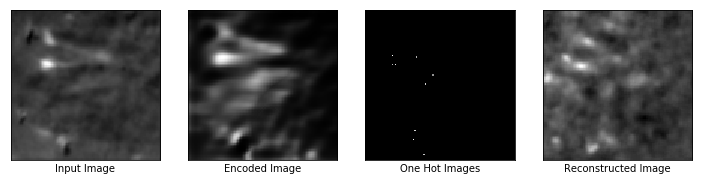

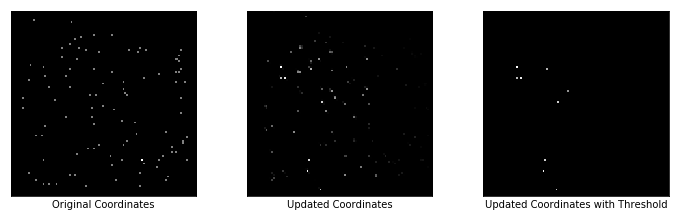

Reconstruction Loss: 0.007162244524806738
Regularizer Loss: 435296.34375, Total Loss: 435296.34375
Encoder Loss: 2.9118294715881348
Max Similarity scores: 0.7039706110954285
Updated Coordinates: [[[0.52393323 0.785895  ]]]



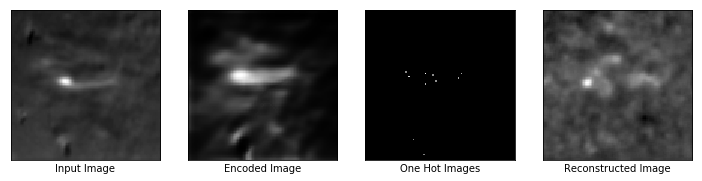

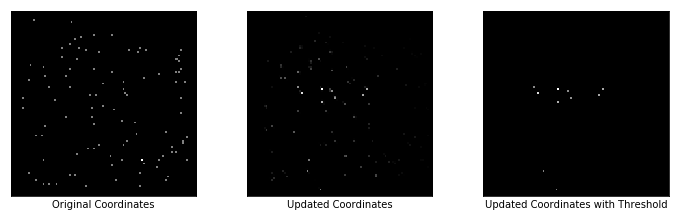

Reconstruction Loss: 0.005220593418926001
Regularizer Loss: 436718.84375, Total Loss: 436718.84375
Encoder Loss: 2.5391502380371094
Max Similarity scores: 0.7085598111152649
Updated Coordinates: [[[0.5239442  0.78590137]]]



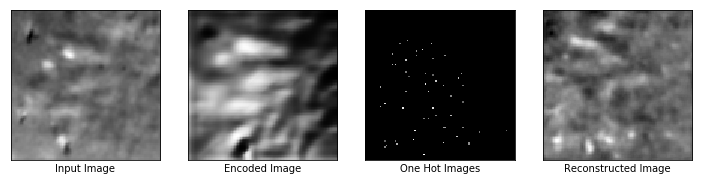

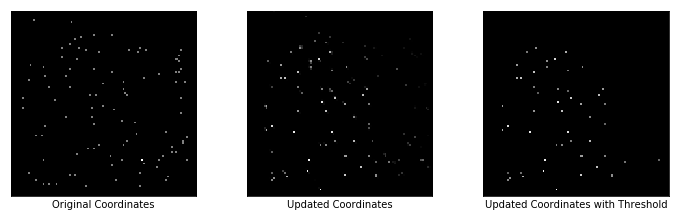

Reconstruction Loss: 0.009332307614386082
Regularizer Loss: 431580.375, Total Loss: 431580.375
Encoder Loss: 4.374311923980713
Max Similarity scores: 0.8866279125213623
Updated Coordinates: [[[0.5239546  0.78590655]]]



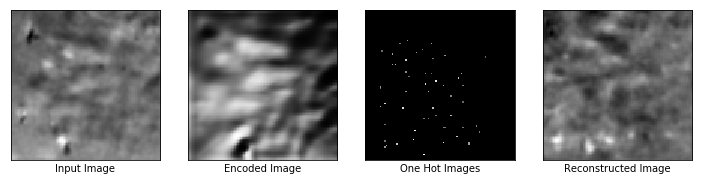

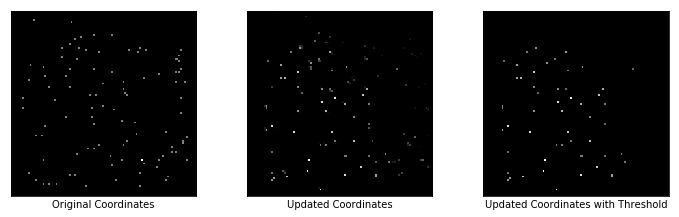

Reconstruction Loss: 0.0116673419252038
Regularizer Loss: 429449.90625, Total Loss: 429449.90625
Encoder Loss: 4.306044101715088
Max Similarity scores: 0.8653762340545654
Updated Coordinates: [[[0.52396744 0.7859128 ]]]



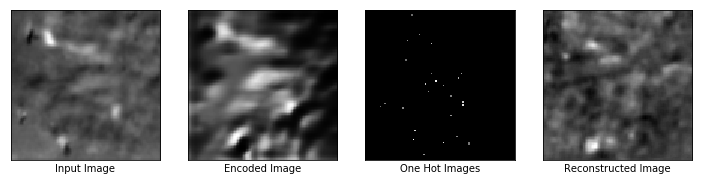

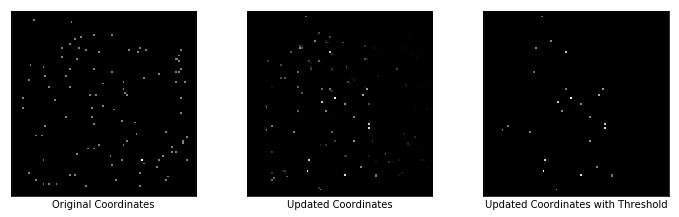

Reconstruction Loss: 0.009262260049581528
Regularizer Loss: 428907.8125, Total Loss: 428907.8125
Encoder Loss: 4.989884853363037
Max Similarity scores: 0.7605661749839783
Updated Coordinates: [[[0.5239762 0.7859236]]]



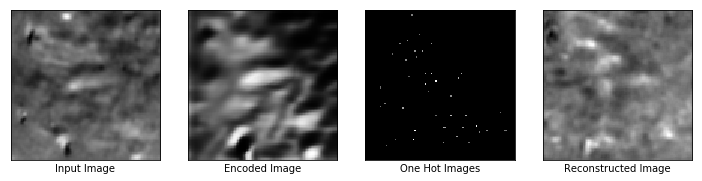

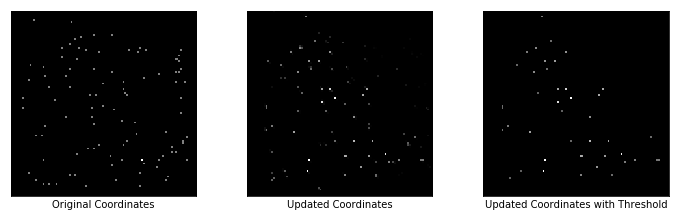

Reconstruction Loss: 0.00994597002863884
Regularizer Loss: 427962.125, Total Loss: 427962.125
Encoder Loss: 5.434032440185547
Max Similarity scores: 0.8409063816070557
Updated Coordinates: [[[0.5239822 0.7859358]]]



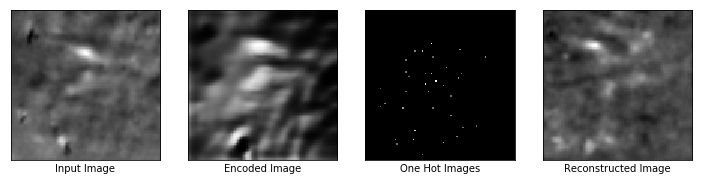

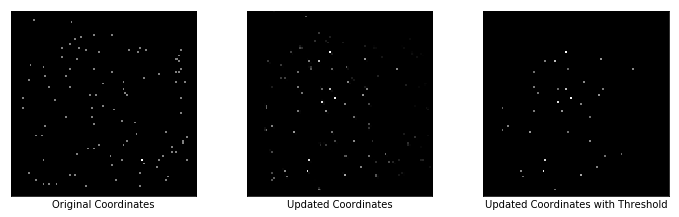

Reconstruction Loss: 0.010090925730764866
Regularizer Loss: 429577.875, Total Loss: 429577.875
Encoder Loss: 4.507824420928955
Max Similarity scores: 0.8827903866767883
Updated Coordinates: [[[0.52398896 0.78594583]]]



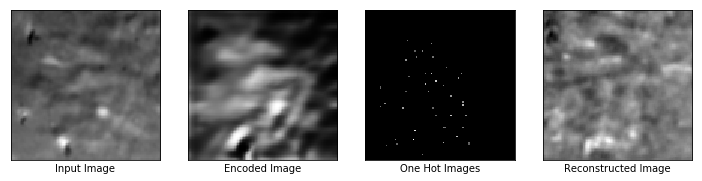

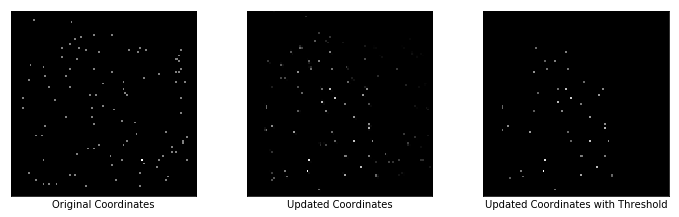

Reconstruction Loss: 0.009695703163743019
Regularizer Loss: 427180.84375, Total Loss: 427180.84375
Encoder Loss: 5.125365734100342
Max Similarity scores: 0.9174653887748718
Updated Coordinates: [[[0.52399784 0.7859552 ]]]



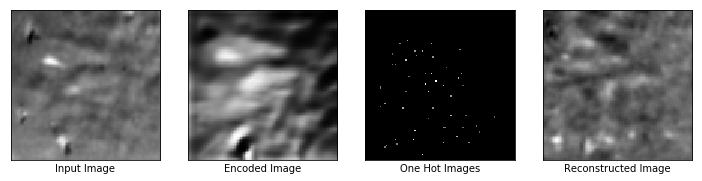

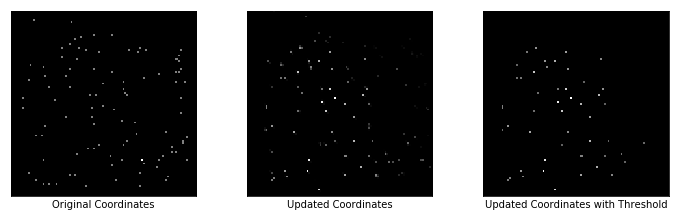

Reconstruction Loss: 0.008172198198735714
Regularizer Loss: 427842.46875, Total Loss: 427842.46875
Encoder Loss: 5.028720855712891
Max Similarity scores: 0.8519114255905151
Updated Coordinates: [[[0.5240054  0.78596306]]]



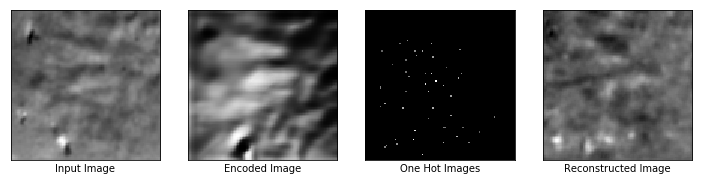

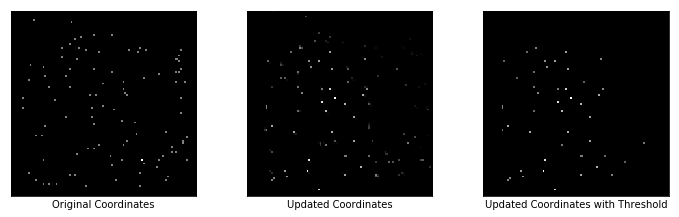

Reconstruction Loss: 0.007938789203763008
Regularizer Loss: 428498.0625, Total Loss: 428498.0625
Encoder Loss: 5.580599784851074
Max Similarity scores: 0.8869993686676025
Updated Coordinates: [[[0.5240131  0.78597075]]]



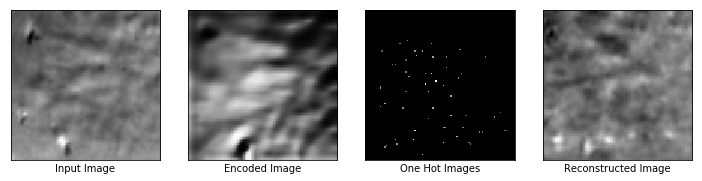

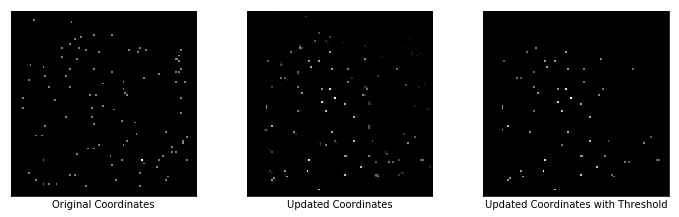

Reconstruction Loss: 0.0072547681629657745
Regularizer Loss: 428460.75, Total Loss: 428460.75
Encoder Loss: 4.967502117156982
Max Similarity scores: 0.9001131057739258
Updated Coordinates: [[[0.52402085 0.7859786 ]]]



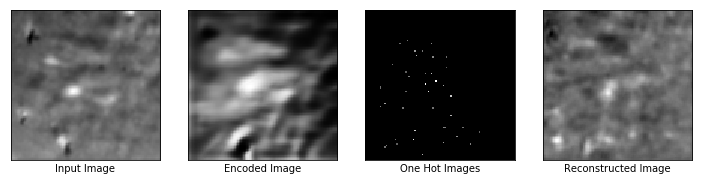

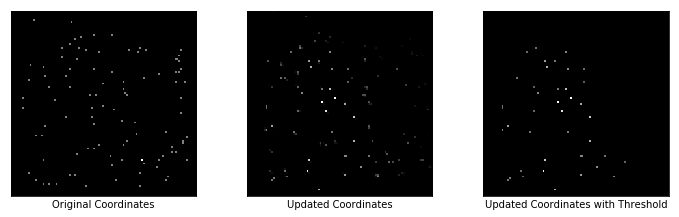

Reconstruction Loss: 0.006745466031134129
Regularizer Loss: 427193.84375, Total Loss: 427193.84375
Encoder Loss: 4.359765529632568
Max Similarity scores: 0.9446248412132263
Updated Coordinates: [[[0.5240275  0.78598624]]]



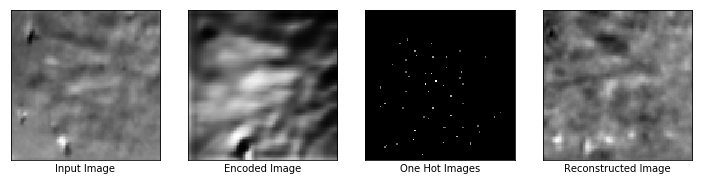

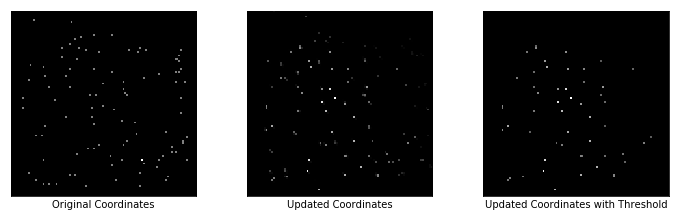

Reconstruction Loss: 0.007650173734873533
Regularizer Loss: 427121.65625, Total Loss: 427121.65625
Encoder Loss: 5.712835788726807
Max Similarity scores: 0.884854257106781
Updated Coordinates: [[[0.52403295 0.7859927 ]]]



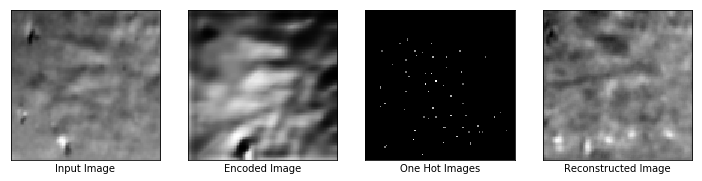

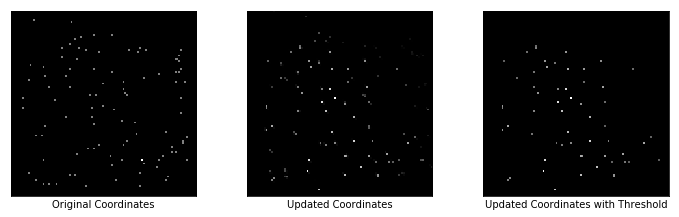

Reconstruction Loss: 0.007414163090288639
Regularizer Loss: 423792.0625, Total Loss: 423792.0625
Encoder Loss: 5.3186163902282715
Max Similarity scores: 0.8905711770057678
Updated Coordinates: [[[0.5240391 0.7859984]]]



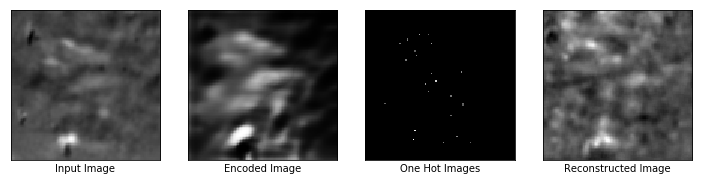

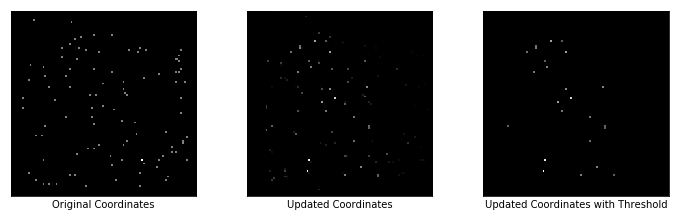

Reconstruction Loss: 0.008854505605995655
Regularizer Loss: 429698.78125, Total Loss: 429698.78125
Encoder Loss: 4.743721961975098
Max Similarity scores: 0.9080666303634644
Updated Coordinates: [[[0.5240465 0.7860049]]]



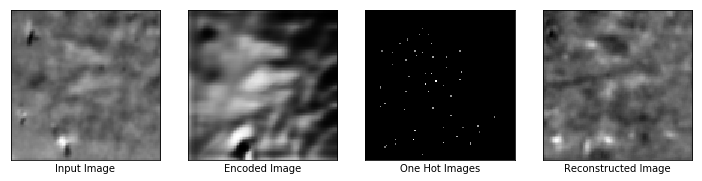

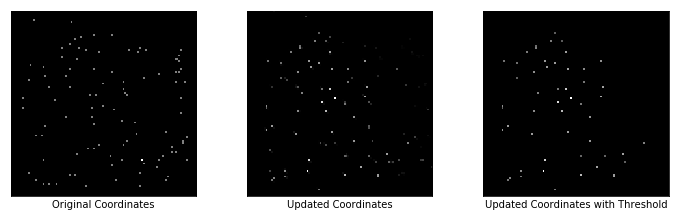

Reconstruction Loss: 0.007261589169502258
Regularizer Loss: 427779.6875, Total Loss: 427779.6875
Encoder Loss: 4.749558925628662
Max Similarity scores: 0.9265986084938049
Updated Coordinates: [[[0.5240536 0.7860128]]]



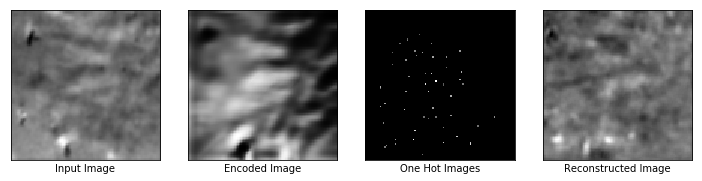

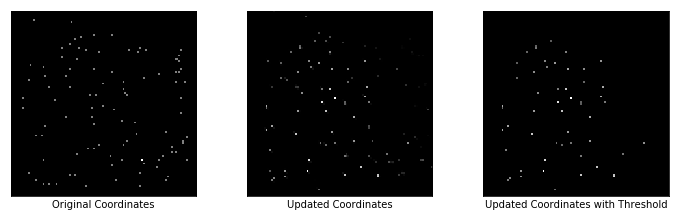

Reconstruction Loss: 0.009961169213056564
Regularizer Loss: 435168.875, Total Loss: 435168.875
Encoder Loss: 4.203437805175781
Max Similarity scores: 0.9278625249862671
Updated Coordinates: [[[0.5240606 0.7860193]]]



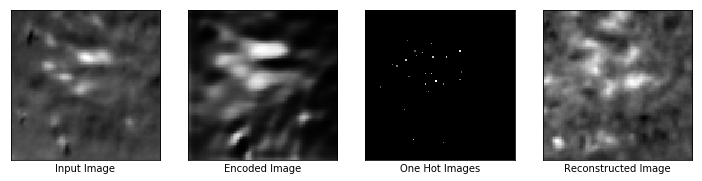

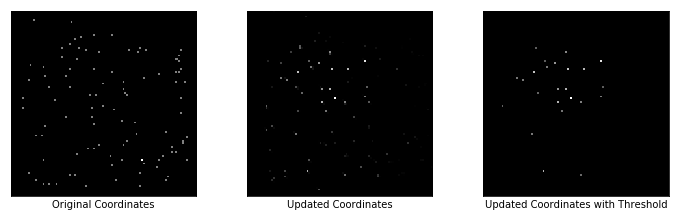

Reconstruction Loss: 0.0100038917735219
Regularizer Loss: 437956.75, Total Loss: 437956.75
Encoder Loss: 3.528895378112793
Max Similarity scores: 0.8618203401565552
Updated Coordinates: [[[0.52406895 0.7860254 ]]]



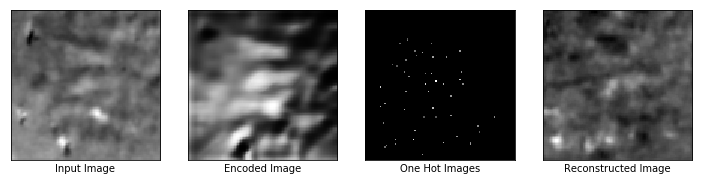

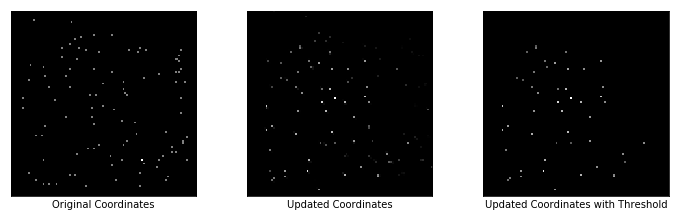

Reconstruction Loss: 0.009598962031304836
Regularizer Loss: 429955.5625, Total Loss: 429955.5625
Encoder Loss: 5.119959354400635
Max Similarity scores: 0.9007377624511719
Updated Coordinates: [[[0.5240789  0.78603077]]]



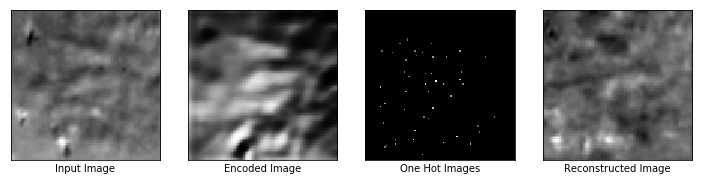

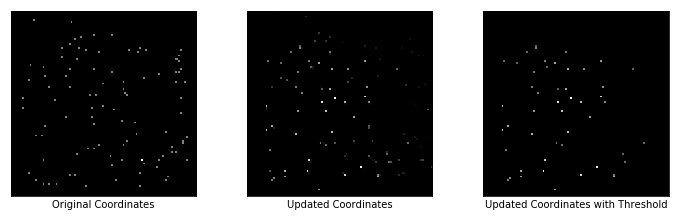

Reconstruction Loss: 0.00785586517304182
Regularizer Loss: 427023.03125, Total Loss: 427023.03125
Encoder Loss: 4.623627662658691
Max Similarity scores: 0.9257809519767761
Updated Coordinates: [[[0.52408916 0.7860357 ]]]



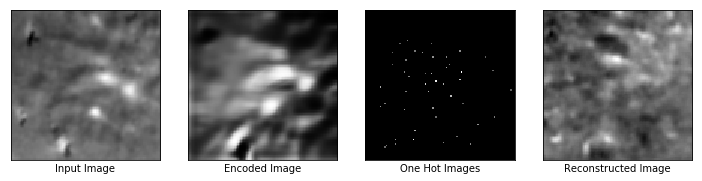

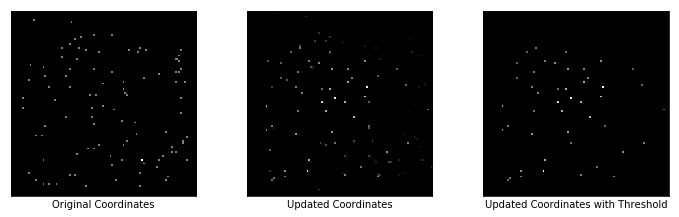

Reconstruction Loss: 0.009459556080400944
Regularizer Loss: 430449.375, Total Loss: 430449.375
Encoder Loss: 3.8417656421661377
Max Similarity scores: 0.93854820728302
Updated Coordinates: [[[0.5241003 0.7860389]]]



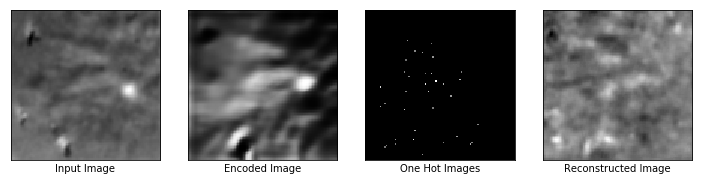

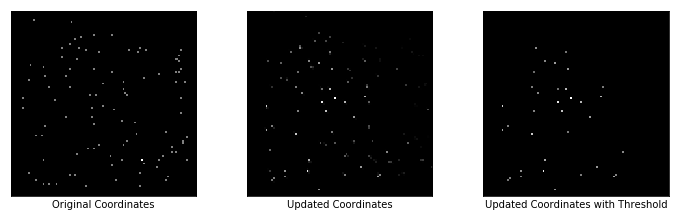

Reconstruction Loss: 0.008548286743462086
Regularizer Loss: 429628.5625, Total Loss: 429628.5625
Encoder Loss: 4.51389217376709
Max Similarity scores: 0.8495562076568604
Updated Coordinates: [[[0.5241145 0.7860397]]]



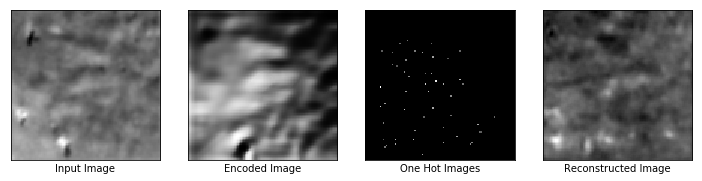

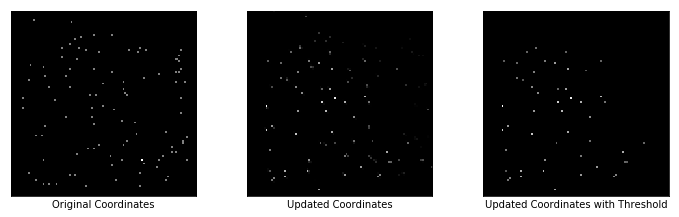

Reconstruction Loss: 0.008570287376642227
Regularizer Loss: 430191.125, Total Loss: 430191.125
Encoder Loss: 5.221529960632324
Max Similarity scores: 0.9162987470626831
Updated Coordinates: [[[0.524129   0.78603774]]]



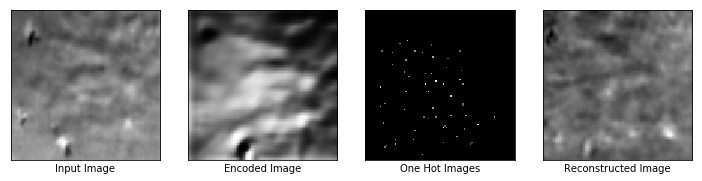

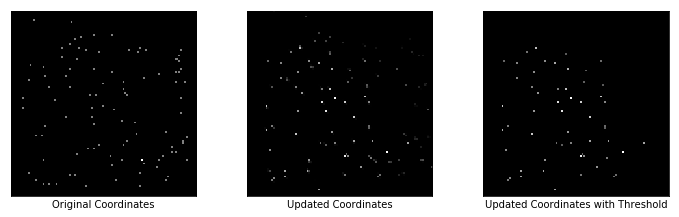

Reconstruction Loss: 0.008012453094124794
Regularizer Loss: 426933.25, Total Loss: 426933.25
Encoder Loss: 4.988195896148682
Max Similarity scores: 0.9206528663635254
Updated Coordinates: [[[0.5241429 0.7860338]]]



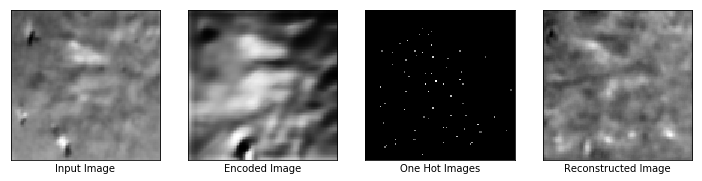

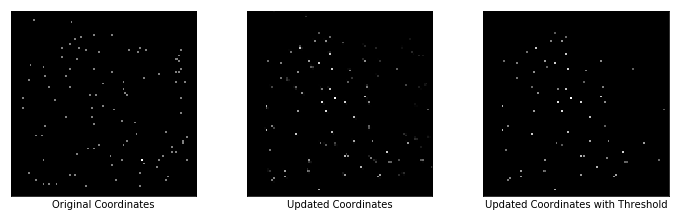

Reconstruction Loss: 0.008509215898811817
Regularizer Loss: 431463.75, Total Loss: 431463.75
Encoder Loss: 4.24798583984375
Max Similarity scores: 0.9231657981872559
Updated Coordinates: [[[0.5241572  0.78602934]]]



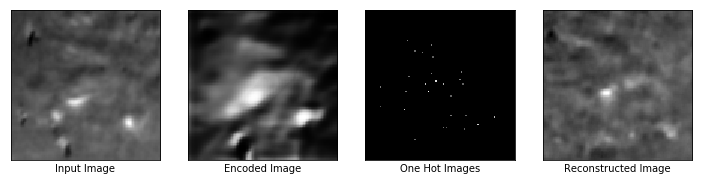

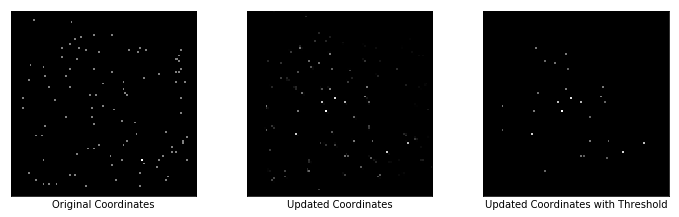

Reconstruction Loss: 0.007724625989794731
Regularizer Loss: 427648.375, Total Loss: 427648.375
Encoder Loss: 4.456656455993652
Max Similarity scores: 0.8833853602409363
Updated Coordinates: [[[0.52417123 0.78602624]]]



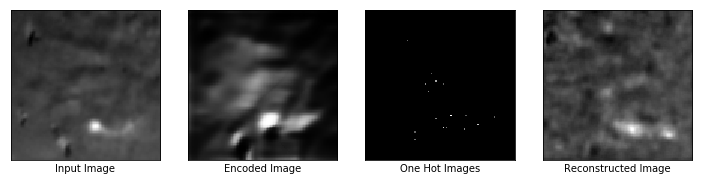

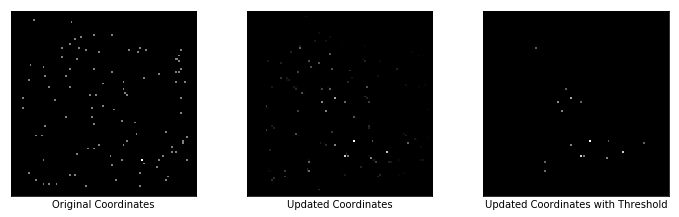

Reconstruction Loss: 0.007054800633341074
Regularizer Loss: 427341.78125, Total Loss: 427341.78125
Encoder Loss: 4.2444939613342285
Max Similarity scores: 0.9238119125366211
Updated Coordinates: [[[0.52418464 0.7860236 ]]]



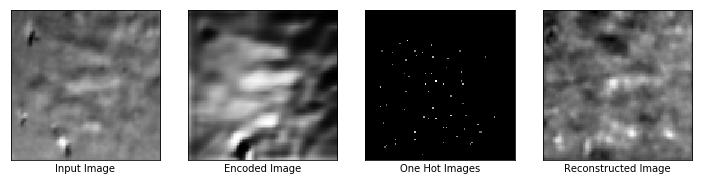

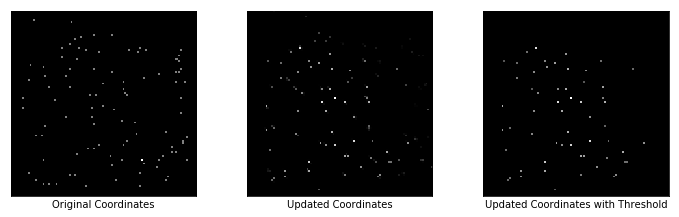

Reconstruction Loss: 0.007020707707852125
Regularizer Loss: 426874.71875, Total Loss: 426874.71875
Encoder Loss: 4.854213237762451
Max Similarity scores: 0.9206001162528992
Updated Coordinates: [[[0.52420044 0.7860221 ]]]



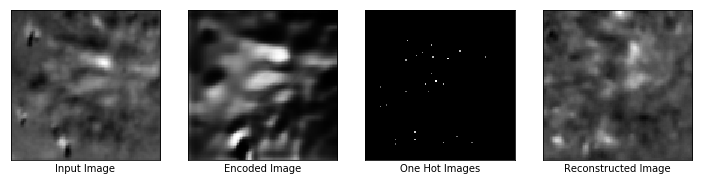

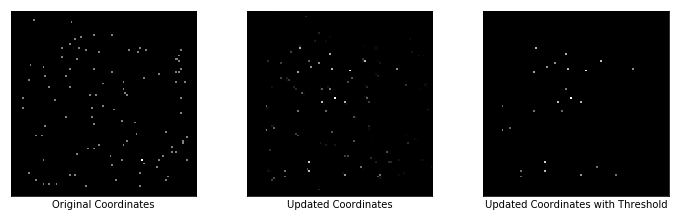

Reconstruction Loss: 0.009939822368323803
Regularizer Loss: 430526.9375, Total Loss: 430526.9375
Encoder Loss: 4.5387372970581055
Max Similarity scores: 0.8766886591911316
Updated Coordinates: [[[0.52421105 0.7860165 ]]]



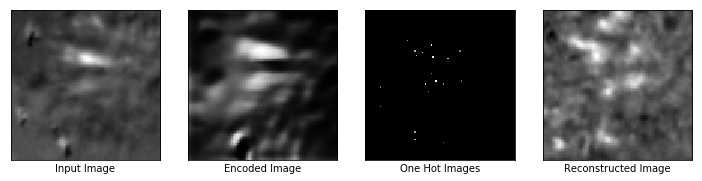

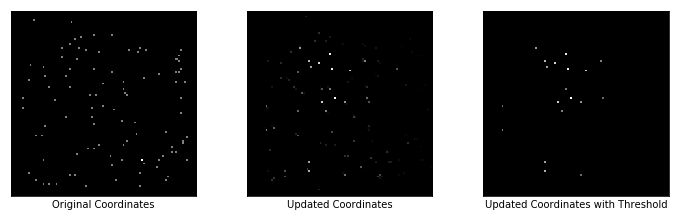

Reconstruction Loss: 0.009686978533864021
Regularizer Loss: 436136.75, Total Loss: 436136.75
Encoder Loss: 3.734971046447754
Max Similarity scores: 0.7760384678840637
Updated Coordinates: [[[0.5242222  0.78601235]]]



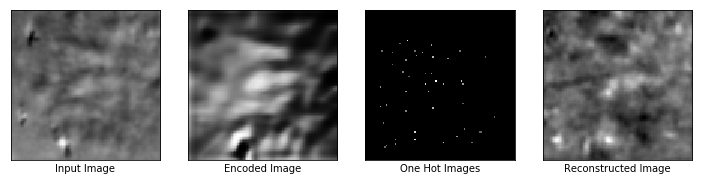

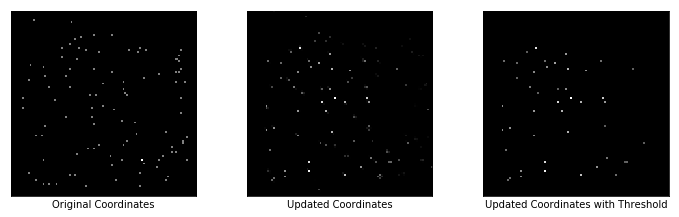

Reconstruction Loss: 0.009039807133376598
Regularizer Loss: 429896.4375, Total Loss: 429896.4375
Encoder Loss: 5.270139694213867
Max Similarity scores: 0.8961215615272522
Updated Coordinates: [[[0.524236  0.7860061]]]



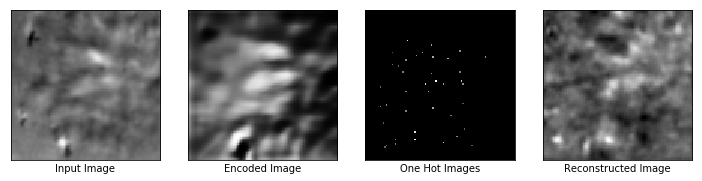

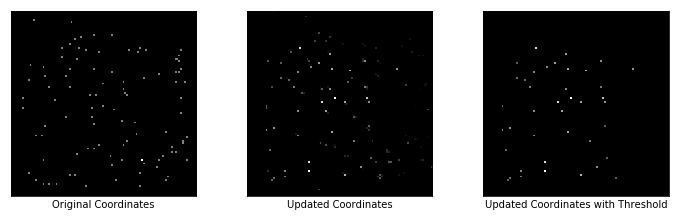

Reconstruction Loss: 0.010138757526874542
Regularizer Loss: 432401.375, Total Loss: 432401.375
Encoder Loss: 4.790005683898926
Max Similarity scores: 0.8999626636505127
Updated Coordinates: [[[0.5242505 0.7859981]]]



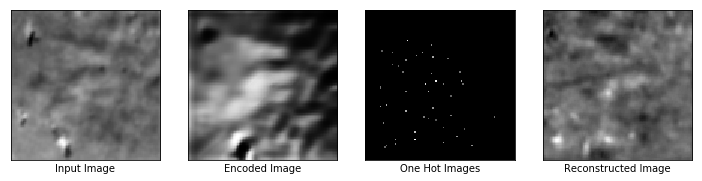

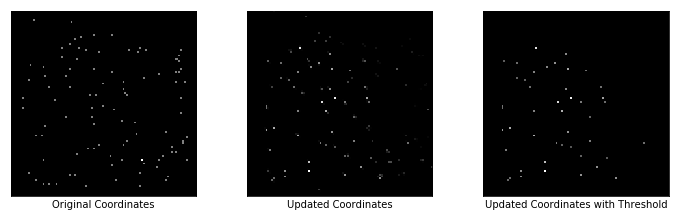

Reconstruction Loss: 0.008874654769897461
Regularizer Loss: 430266.21875, Total Loss: 430266.21875
Encoder Loss: 5.298526763916016
Max Similarity scores: 0.9078747034072876
Updated Coordinates: [[[0.5242686  0.78598887]]]



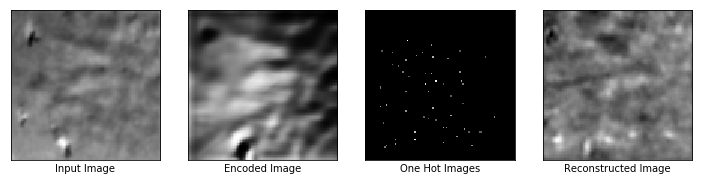

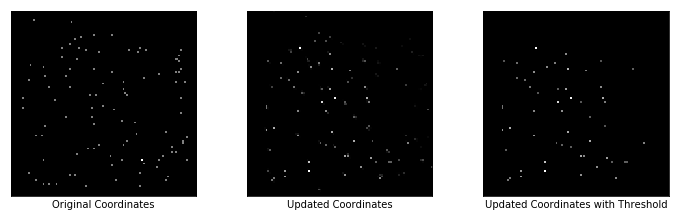

Reconstruction Loss: 0.007933657616376877
Regularizer Loss: 428004.375, Total Loss: 428004.375
Encoder Loss: 5.479363918304443
Max Similarity scores: 0.9218553900718689
Updated Coordinates: [[[0.52428627 0.78597766]]]



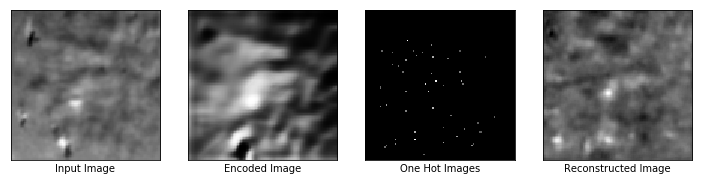

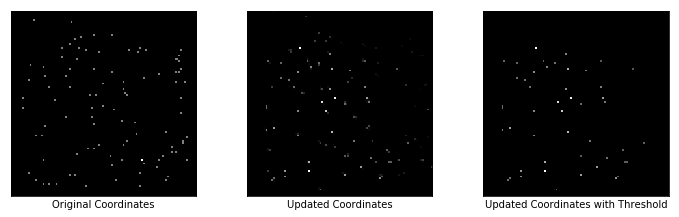

Reconstruction Loss: 0.008583452552556992
Regularizer Loss: 430223.625, Total Loss: 430223.625
Encoder Loss: 4.855688095092773
Max Similarity scores: 0.9169502854347229
Updated Coordinates: [[[0.52430296 0.7859676 ]]]



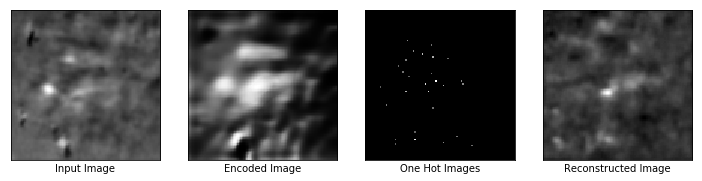

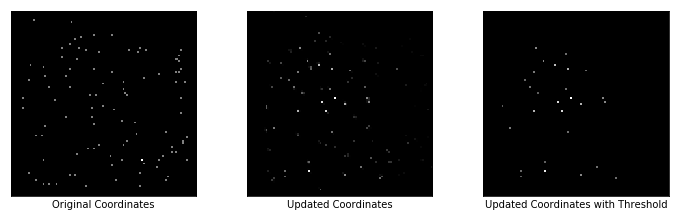

Reconstruction Loss: 0.006820071488618851
Regularizer Loss: 434971.0, Total Loss: 434971.0
Encoder Loss: 3.304490566253662
Max Similarity scores: 0.8398749828338623
Updated Coordinates: [[[0.52432054 0.78595793]]]



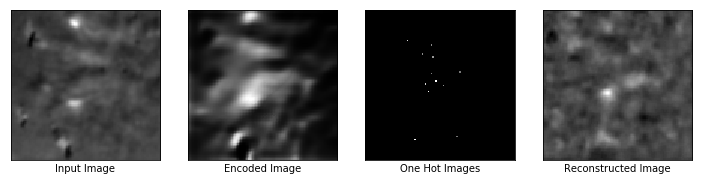

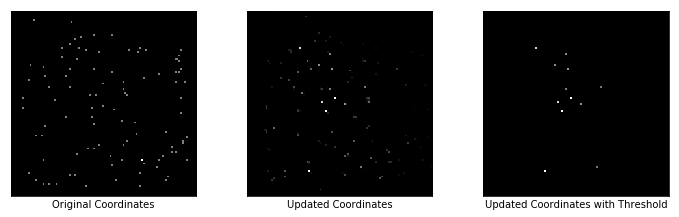

Reconstruction Loss: 0.006575247272849083
Regularizer Loss: 434425.0625, Total Loss: 434425.0625
Encoder Loss: 3.5380194187164307
Max Similarity scores: 0.7442532181739807
Updated Coordinates: [[[0.5243365  0.78594804]]]



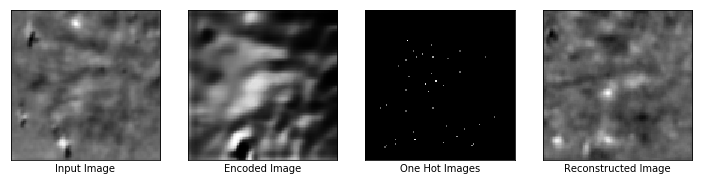

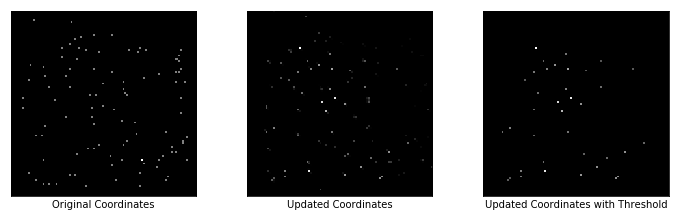

Reconstruction Loss: 0.008773262612521648
Regularizer Loss: 430317.6875, Total Loss: 430317.6875
Encoder Loss: 5.183760166168213
Max Similarity scores: 0.890030026435852
Updated Coordinates: [[[0.52435213 0.7859376 ]]]



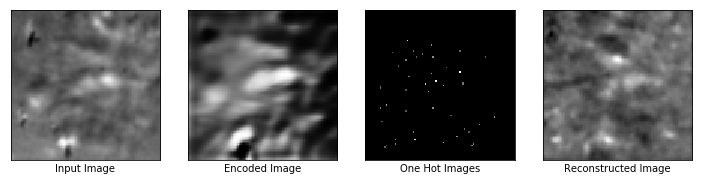

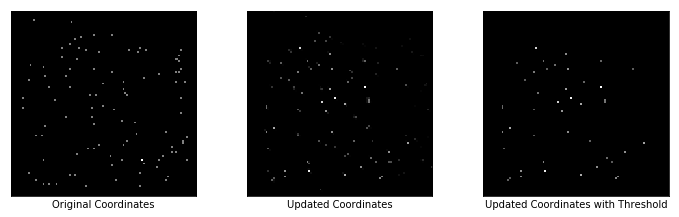

Reconstruction Loss: 0.00966702401638031
Regularizer Loss: 432570.5625, Total Loss: 432570.5625
Encoder Loss: 4.444809436798096
Max Similarity scores: 0.9321756362915039
Updated Coordinates: [[[0.5243696  0.78592646]]]



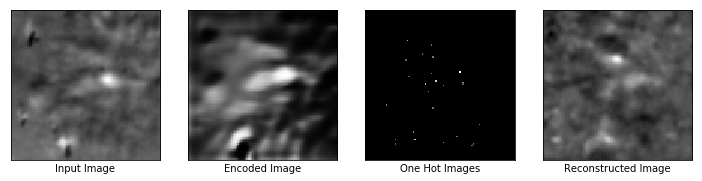

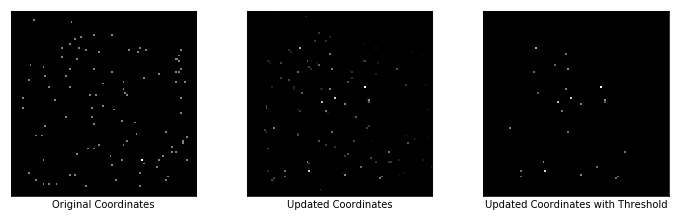

Reconstruction Loss: 0.008100034669041634
Regularizer Loss: 432319.46875, Total Loss: 432319.46875
Encoder Loss: 4.522737503051758
Max Similarity scores: 0.9381580948829651
Updated Coordinates: [[[0.5243921  0.78591526]]]



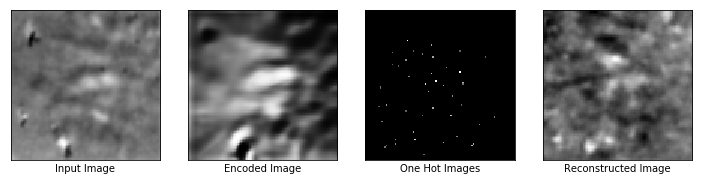

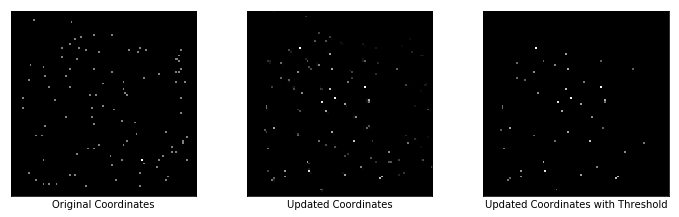

Reconstruction Loss: 0.009233685210347176
Regularizer Loss: 430095.6875, Total Loss: 430095.6875
Encoder Loss: 5.354659557342529
Max Similarity scores: 0.9269817471504211
Updated Coordinates: [[[0.5244162  0.78590244]]]



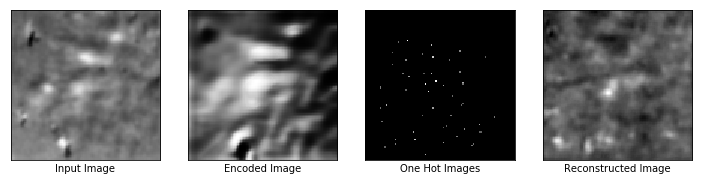

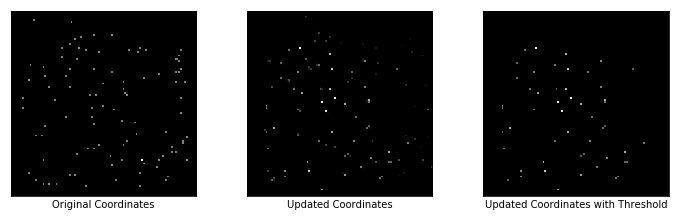

Reconstruction Loss: 0.008727128617465496
Regularizer Loss: 432769.375, Total Loss: 432769.375
Encoder Loss: 5.060914039611816
Max Similarity scores: 0.9352502226829529
Updated Coordinates: [[[0.5244386 0.7858886]]]



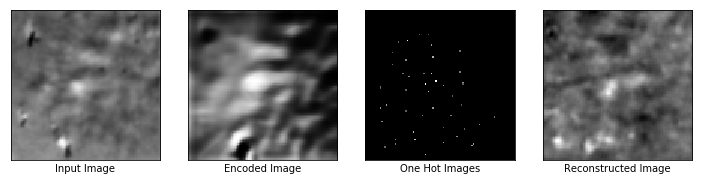

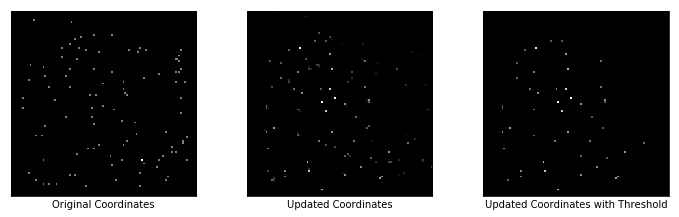

Reconstruction Loss: 0.007463236805051565
Regularizer Loss: 429379.71875, Total Loss: 429379.71875
Encoder Loss: 4.960808753967285
Max Similarity scores: 0.9297897815704346
Updated Coordinates: [[[0.52446014 0.7858738 ]]]



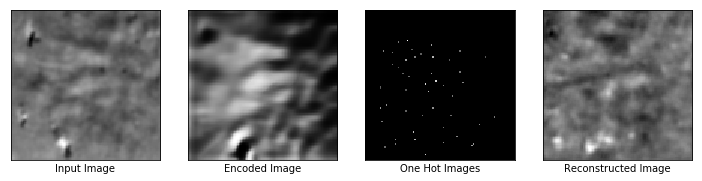

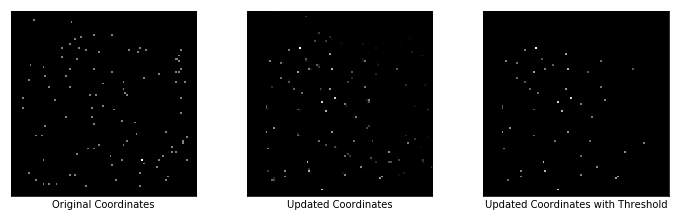

Reconstruction Loss: 0.00739595340564847
Regularizer Loss: 428657.34375, Total Loss: 428657.34375
Encoder Loss: 5.164795398712158
Max Similarity scores: 0.9275214076042175
Updated Coordinates: [[[0.5244807 0.7858576]]]



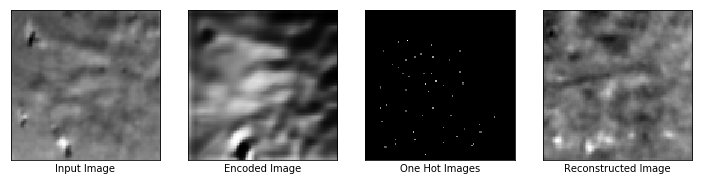

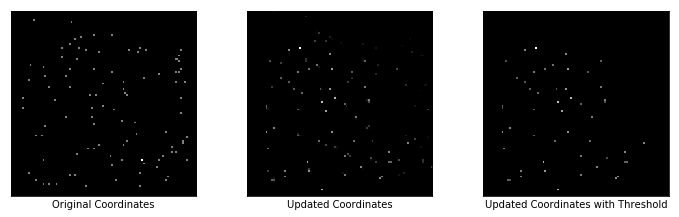

Reconstruction Loss: 0.007226223591715097
Regularizer Loss: 428181.3125, Total Loss: 428181.3125
Encoder Loss: 5.352888107299805
Max Similarity scores: 0.9380731582641602
Updated Coordinates: [[[0.52450126 0.7858432 ]]]



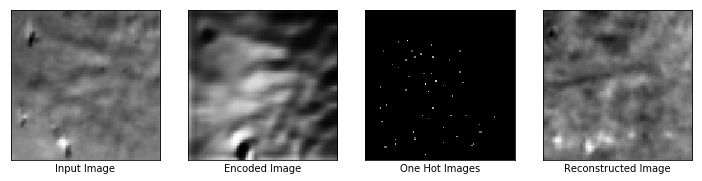

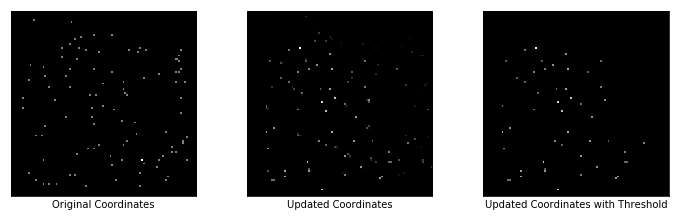

Reconstruction Loss: 0.007119309157133102
Regularizer Loss: 428400.1875, Total Loss: 428400.1875
Encoder Loss: 5.393761157989502
Max Similarity scores: 0.9387028813362122
Updated Coordinates: [[[0.5245215  0.78583133]]]



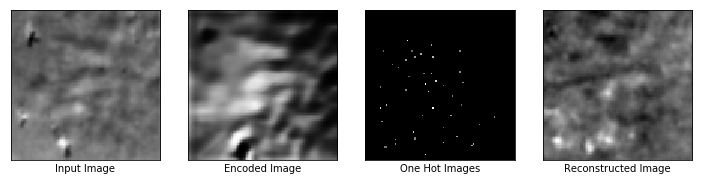

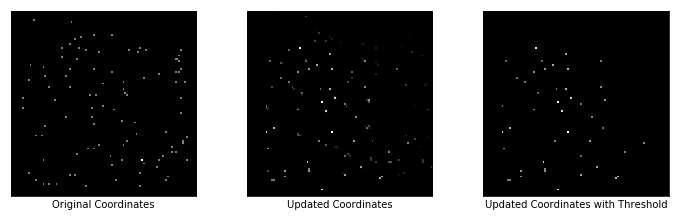

Reconstruction Loss: 0.007876504212617874
Regularizer Loss: 430201.65625, Total Loss: 430201.65625
Encoder Loss: 5.174710273742676
Max Similarity scores: 0.9150466322898865
Updated Coordinates: [[[0.524541  0.7858214]]]



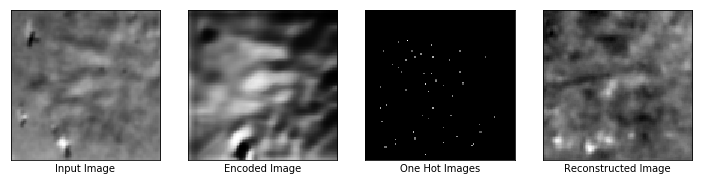

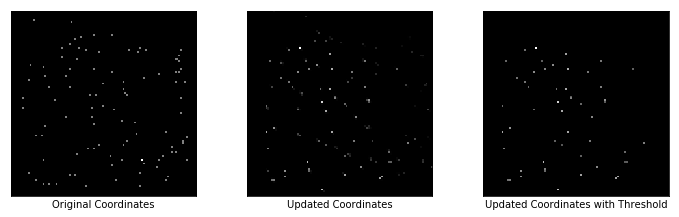

Reconstruction Loss: 0.007550056558102369
Regularizer Loss: 429943.1875, Total Loss: 429943.1875
Encoder Loss: 5.138147830963135
Max Similarity scores: 0.9358729124069214
Updated Coordinates: [[[0.5245585  0.78581107]]]



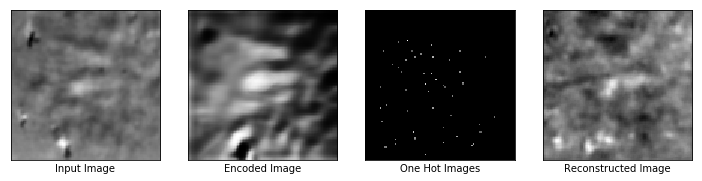

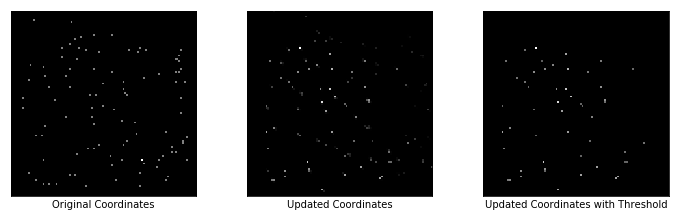

Reconstruction Loss: 0.007404667790979147
Regularizer Loss: 430721.875, Total Loss: 430721.875
Encoder Loss: 5.3814215660095215
Max Similarity scores: 0.9294939637184143
Updated Coordinates: [[[0.5245782 0.7857997]]]



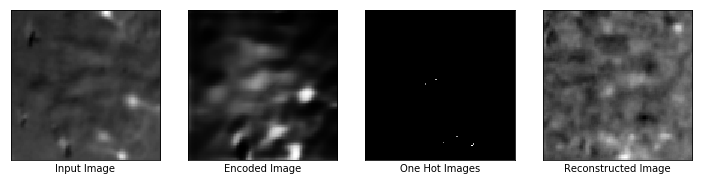

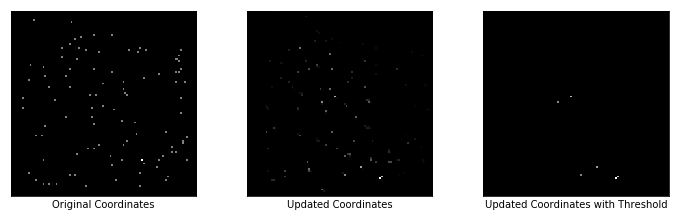

Reconstruction Loss: 0.007479219697415829
Regularizer Loss: 432801.5, Total Loss: 432801.5
Encoder Loss: 4.1821465492248535
Max Similarity scores: 0.6904828548431396
Updated Coordinates: [[[0.52459836 0.785788  ]]]



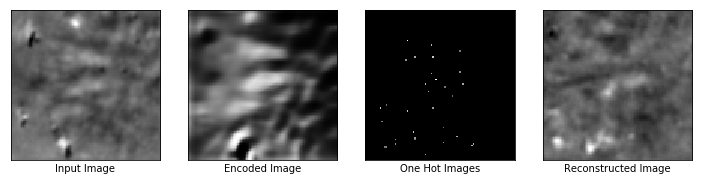

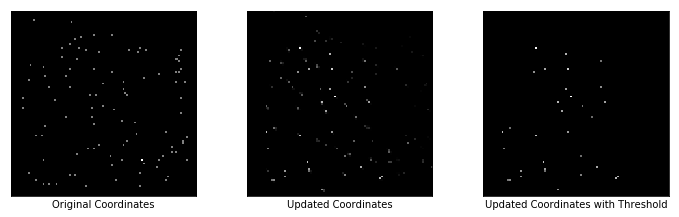

Reconstruction Loss: 0.00740137929096818
Regularizer Loss: 431635.28125, Total Loss: 431635.28125
Encoder Loss: 4.484818935394287
Max Similarity scores: 0.9015962481498718
Updated Coordinates: [[[0.5246204 0.785774 ]]]



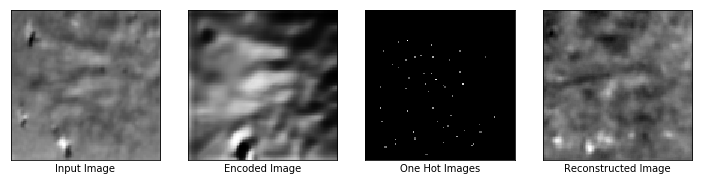

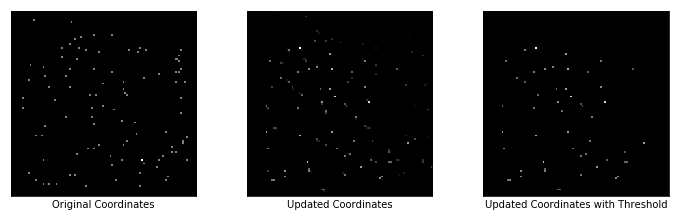

Reconstruction Loss: 0.007499038707464933
Regularizer Loss: 429357.0, Total Loss: 429357.0
Encoder Loss: 5.361525535583496
Max Similarity scores: 0.9337666630744934
Updated Coordinates: [[[0.52464616 0.78575695]]]



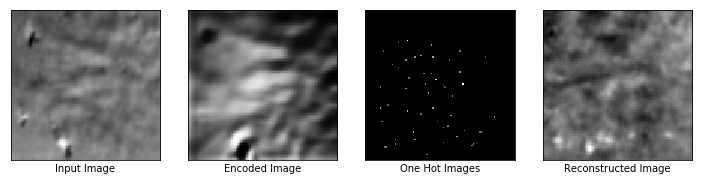

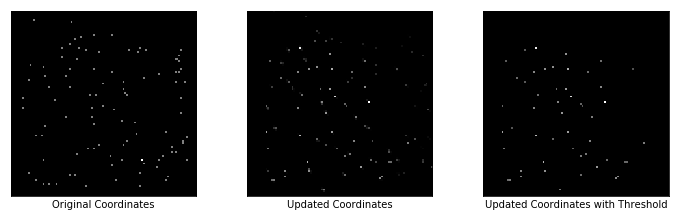

Reconstruction Loss: 0.007587638683617115
Regularizer Loss: 429485.8125, Total Loss: 429485.8125
Encoder Loss: 5.286208629608154
Max Similarity scores: 0.9314695596694946
Updated Coordinates: [[[0.5246725 0.7857401]]]



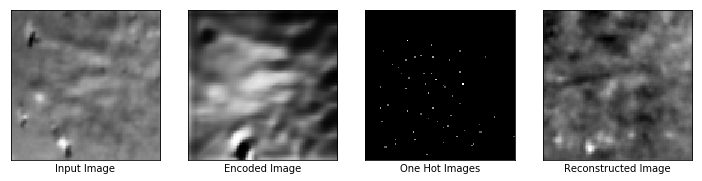

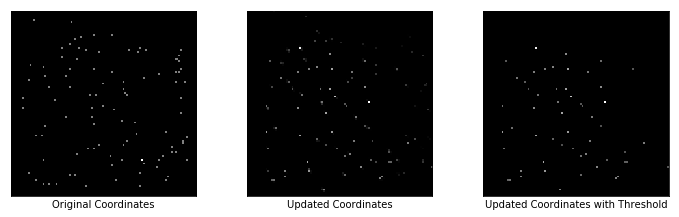

Reconstruction Loss: 0.007116890046745539
Regularizer Loss: 429875.3125, Total Loss: 429875.3125
Encoder Loss: 4.949696063995361
Max Similarity scores: 0.9377642273902893
Updated Coordinates: [[[0.52470094 0.7857266 ]]]



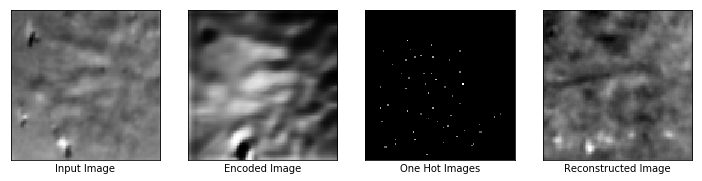

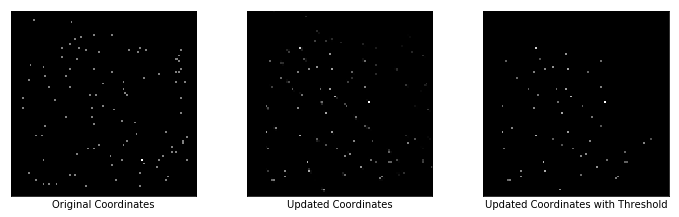

Reconstruction Loss: 0.00706773204728961
Regularizer Loss: 429221.125, Total Loss: 429221.125
Encoder Loss: 5.461783409118652
Max Similarity scores: 0.9314376711845398
Updated Coordinates: [[[0.524729  0.7857158]]]



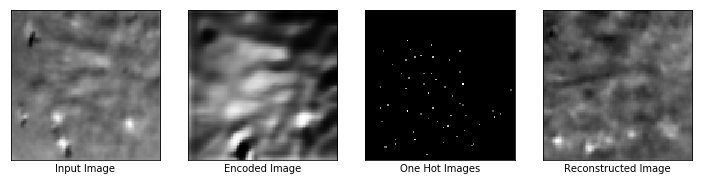

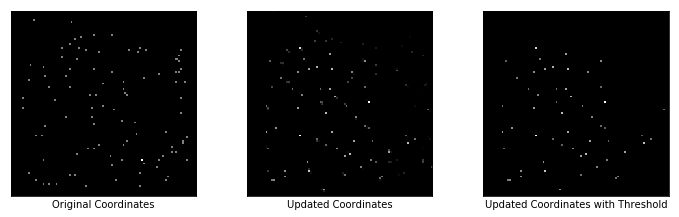

Reconstruction Loss: 0.007471355609595776
Regularizer Loss: 429089.03125, Total Loss: 429089.03125
Encoder Loss: 4.86922550201416
Max Similarity scores: 0.9222718477249146
Updated Coordinates: [[[0.5247572 0.7857061]]]



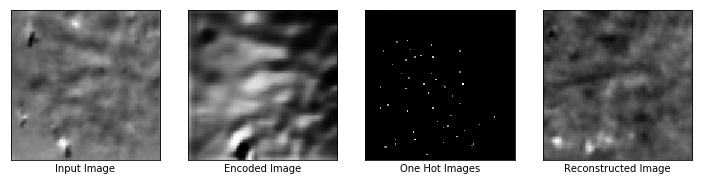

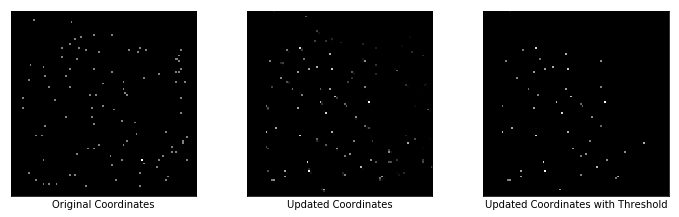

Reconstruction Loss: 0.00910229329019785
Regularizer Loss: 431461.28125, Total Loss: 431461.28125
Encoder Loss: 5.162098407745361
Max Similarity scores: 0.9347959756851196
Updated Coordinates: [[[0.5247842  0.78569317]]]



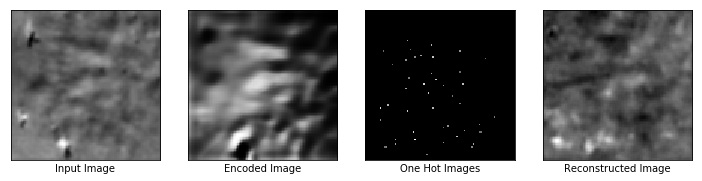

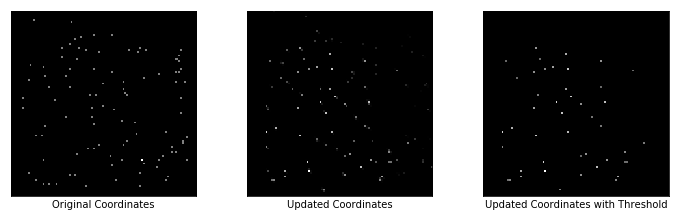

Reconstruction Loss: 0.009841055609285831
Regularizer Loss: 428625.46875, Total Loss: 428625.46875
Encoder Loss: 4.874054908752441
Max Similarity scores: 0.9163645505905151
Updated Coordinates: [[[0.5248143  0.78567606]]]


In [18]:
#list to be append to output 
loss_list_global = []
loss_list_encoded_one_hot = []
regulariser_loss_list = []
input_imgs = []
coords_list = []
encoded_imgs = []
reconstructed_imgs = []
one_hot_imgs_list = []
similarity_list = []

captions_01 = ['Input Image', 'Encoded Image', 'One Hot Images','Reconstructed Image']
captions_02 = ['Original Coordinates', 'Updated Coordinates', 'Updated Coordinates with Threshold']

#list to append to monitor each frames for the last epochs 
one_hot_imgs_last_list = []
encoder_output_last_list = []
similarity_score_last_list = []
reconstruction_last_list = []

val_data_path = "/home/kevinteng/Desktop/validation/DG13_7-16-17_preprocessed_dF.npy"
val_data = np.load(val_data_path)
re_list = utils.resize(val_data, NEW_SIZE)
re_list = utils.min_max_norm(re_list)
#add channel 
re_list = np.expand_dims(re_list, axis = -1)
re_list = tf.convert_to_tensor(re_list, dtype = tf.float32)
batch_imgs= tf.data.Dataset.from_tensor_slices(re_list).batch(BATCH_SIZE, drop_remainder=True)

for steps, batched_imgs in enumerate(batch_imgs):
    loss, updated_coords, one_hot_imgs, encoder_output, similarity_score, reconstruction = val_fn(batched_imgs, 
                                                                                                  IMG_SIZE, BATCH_SIZE, 
                                                                                                  neuron_multi = False, one_hot_thr = False)
    if steps%1==0:
        rand = randint(0, BATCH_SIZE-1) #random number to generate for plotting outputs 
        img_row01 = [batched_imgs[rand], encoder_output[rand], similarity_multi(one_hot_imgs, similarity_score, thr=thr)[rand], reconstruction[rand]]
        img_row02 = [stack4plot(ori_one_hot_imgs), similarity_multi(one_hot_imgs, similarity_score)[rand], similarity_multi(one_hot_imgs, similarity_score, thr=thr)[rand]]
        plot_comparison(img_row01, captions_01, n_col=len(img_row01), figsize = (10, 10))
        plot_comparison(img_row02, captions_02, n_col=len(img_row02), figsize = (10, 10))
        #print for each session in the epochs 
        #note for loss indices
        #loss = [global_loss, encoded_dummy, regularizer_loss, total_loss]
        print("Reconstruction Loss: {}".format(loss[0].numpy()))
        print("Regularizer Loss: {}, Total Loss: {}".format(loss[2].numpy(), loss[-1].numpy()))
        print("Encoder Loss: {}".format(loss[1].numpy()))
        print("Max Similarity scores: {}".format(np.max(similarity_score[rand])))
        print("Updated Coordinates: {}".format(updated_coords[0]))
        #append to list 
        encoded_imgs.append(encoder_output)
        input_imgs.append(batched_imgs)
        coords_list.append(updated_coords)
        reconstructed_imgs.append(reconstruction)
        one_hot_imgs_list.append(one_hot_imgs)
        similarity_list.append(similarity_score)
    loss_list_global.append(loss[0])
    one_hot_imgs_last_list.append(one_hot_imgs)
    #encoder_output_last_sess.append(encoder_output)
    similarity_score_last_list.append(similarity_score)
    #reconstruction_last_sess.append(reconstruction)

In [19]:
print("Average reconstruction loss: {}".format(np.mean(np.array(loss_list_global))))

Average reconstruction loss: 0.010025223717093468


In [20]:
similarity_score_last_list = utils.concat_batch(similarity_score_last_list)

In [21]:
similarity_score_last_list_npy = np.array(similarity_score_last_list)
one_hot_imgs_last_list_npy = np.array(tf.convert_to_tensor(one_hot_imgs_last_list))

## Model Output

True Positives:  0.2957540263543192
False Positives:  0.7042459736456809
False Negatives:  0.2544591151262451
True Negatives:  0.7455408848737549
TP_total:  404
FP_total:  962
FN_total:  2197
F1 score:  0.3815656291906453


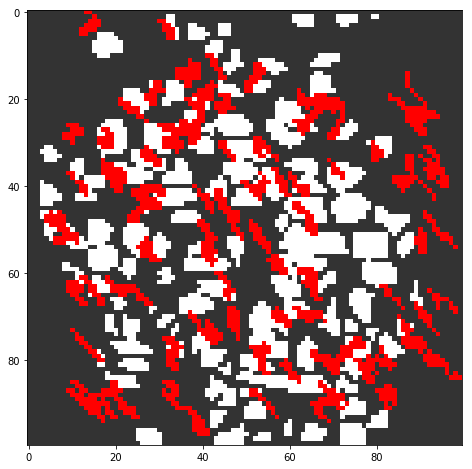

In [22]:
#define color
col = [(0.2, 0.2, 0.2),(1,1,1),(1,0,0)] 
cm = LinearSegmentedColormap.from_list('mylist', col, 3)  
#     #Bins for cmap
bounds=[0,1,5,10]
norm = BoundaryNorm(bounds, cm.N)

roi_img = np.load("/home/kevinteng/Desktop/validation/DG-13-7-16-17_ROImask.npy")
roi_img = cv2.resize(roi_img, (IMG_SIZE, IMG_SIZE))
tensor = multi_similarity_frame(one_hot_imgs_last_list_npy, similarity_score_last_list_npy, IMG_SIZE, BATCH_SIZE)
plt.figure(figsize=(8,8))
tensor_sum02 = np.where(np.sum(tensor, axis=0)<0.8, 0, 1.0)
roi_frame = overlapMasks02(roi_img, tensor_sum02)
plt.imshow(roi_frame, cmap = cm , norm = norm)
confMatrix = utils_model.getConfusionMatrix(roi_img, tensor_sum02)
print("True Positives: ", confMatrix[0])
print("False Positives: ", confMatrix[1])
print("False Negatives: ", confMatrix[2])
print("True Negatives: ", confMatrix[3])
print("TP_total: ", confMatrix[4])
print("FP_total: ", confMatrix[5])
print("FN_total: ", confMatrix[6])
print("F1 score: ", utils_model.f1score(confMatrix))
plt.show()

## Random Coordinates

True Positives:  0.2727272727272727
False Positives:  0.7272727272727273
False Negatives:  0.25997374002625995
True Negatives:  0.74002625997374
TP_total:  27
FP_total:  72
FN_total:  2574
F1 score:  0.3558779833221508


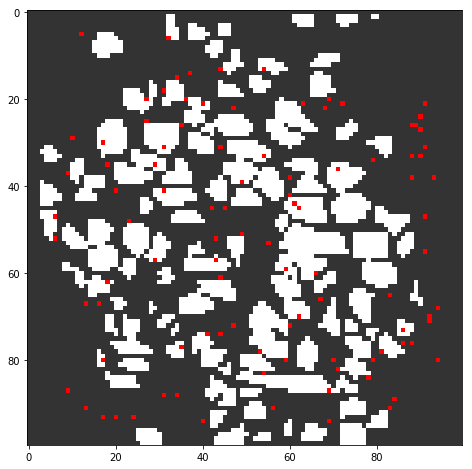

In [23]:
ori_onehot_imgs = stack4plot(ori_one_hot_imgs_npy)

plt.figure(figsize=(8,8))
roi_frame = overlapMasks02(roi_img, ori_onehot_imgs)
plt.imshow(roi_frame, cmap = cm , norm = norm)
confMatrix = utils_model.getConfusionMatrix(roi_img, ori_onehot_imgs)
print("True Positives: ", confMatrix[0])
print("False Positives: ", confMatrix[1])
print("False Negatives: ", confMatrix[2])
print("True Negatives: ", confMatrix[3])
print("TP_total: ", confMatrix[4])
print("FP_total: ", confMatrix[5])
print("FN_total: ", confMatrix[6])
print("F1 score: ", utils_model.f1score(confMatrix))
plt.show()